# One Pixel Attack Tutorial
## Part 1 - Cifar10

### Dan Kondratyuk
### February 3, 2019

![](images/pred2.png "All it takes is one pixel")

This notebook will demonstrate the one pixel attack with a few different convolutional neural network models. By using differential evolution, we find a special pixel that can modify a target image such that the network misclassifies the image (which it previously correctly classified).

In theory, we want models that don't get fooled by such tiny changes. Especially in images, it is undesirable to have a small alteration in the input result in a drastic change in the output. However, even the most accurate neural networks are susceptible to this type of attack.

To read more about it, see [the original paper](https://arxiv.org/abs/1710.08864), or the authors' [official repo](https://github.com/Carina02/One-Pixel-Attack).

Let's get started.

## Imports

Ensure that you have `numpy`, `pandas`, `scipy`, `matplotlib`, `tensorflow-gpu`, and `keras` installed.

Alternatively, you may [run this notebook in Google Colab](https://colab.research.google.com/drive/1Zq1kGP9C7i-70-SXyuEEaqYngtyQZMn7). Note: colab allows you to run this notebook on GPU, free of charge. Simply select "GPU" in the Accelerator drop-down in Notebook Settings (either through the Edit menu or the command palette at cmd/ctrl-shift-P).

In [7]:
# If running in Google Colab, import files
try:
    import google.colab
    in_colab = True
except:
    in_colab = False

if in_colab:
    !git clone https://github.com/Hyperparticle/one-pixel-attack-keras.git
    !mv -v one-pixel-attack-keras/* .
    !rm -rf one-pixel-attack-keras

# Python Libraries
%matplotlib inline
import pickle
import csv
import numpy as np
import pandas as pd
import re
import os
import matplotlib
from keras.datasets import cifar10
from keras import backend as K
from PIL import Image

# Custom Networks
from networks.lenet import LeNet
from networks.pure_cnn import PureCnn
from networks.network_in_network import NetworkInNetwork
from networks.resnet import ResNet
from networks.densenet import DenseNet
from networks.wide_resnet import WideResNet
from networks.capsnet import CapsNet

# Helper functions
from differential_evolution import differential_evolution
import helper

matplotlib.style.use('ggplot')
np.random.seed(100)

## Load Dataset

For this attack, we will use the [Cifar10 dataset](https://www.cs.toronto.edu/~kriz/cifar.html) packaged by Keras. The task of the dataset is to correctly classify a 32x32 pixel image in 1 of 10 categories (e.g., bird, deer, truck).

The code below will load the Cifar10 dataset. Keras will need to download the dataset if it is not cached locally already.

In [8]:
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

In [9]:
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

We can access and display any image in the dataset by its index. For instance, here is a horse.

In [10]:
# image = 99 # Image index in the test set
# helper.plot_image(x_test[image])

## Image Perturbation

To begin, we need a function to modify one or more pixels in an image. 

We can define the perturbation of a pixel as a 5-tuple 

$$\textbf{x} = (x, y, r, g, b)$$

where $x, y$ are the coordinates of the pixel from 0 to 31, and $r,g,b$ are the red, green, and blue values from 0 to 255. Then multiple perturbations can simply be a concatenation of these tuples:

$$X = (x_1, y_1, r_1, g_1, b_1, x_2, y_2, r_2, g_2, b_2, ...)$$

We could instead use an array of tuples, but the optimization algorithm we will use requires it to be a flat 1-d vector.

Then the function to perturb an image can take as an input the image and $X$, and output a copy of the image with each pixel at $x_i, y_i$ modified to have the color $r_i, g_i, b_i$. To speed up computation, we will batch together an array of $X$ perturbations, denoted $X_S$.

In [11]:
def perturb_image(xs, img):
    # If this function is passed just one perturbation vector,
    # pack it in a list to keep the computation the same
    if xs.ndim < 2:
        xs = np.array([xs])
    
    # Copy the image n == len(xs) times so that we can 
    # create n new perturbed images
    tile = [len(xs)] + [1]*(xs.ndim+1)
    imgs = np.tile(img, tile)
    
    # Make sure to floor the members of xs as int types
    xs = xs.astype(int)
    
    for x,img in zip(xs, imgs):
        # Split x into an array of 5-tuples (perturbation pixels)
        # i.e., [[x,y,r,g,b], ...]
        pixels = np.split(x, len(x) // 5)
        for pixel in pixels:
            # At each pixel's x,y position, assign its rgb value
            x_pos, y_pos, *rgb = pixel
            img[x_pos, y_pos] = rgb
    
    return imgs

Now we can modify the pixels of any image we want.

Let's modify our horse image by making pixel (16,16) yellow.

In [12]:
# image = 99 # Image index in the test set
# pixel = np.array([16, 16, 255, 255, 0]) # pixel = x,y,r,g,b
# image_perturbed = perturb_image(pixel, x_test[image])[0]

# helper.plot_image(image_perturbed)

## Load Models

To demonstrate the attack, we need some neural network models trained on the Cifar10 dataset. We will now load some pretrained models, which can be found in the `networks/models` directory.

It is recommended to use Keras with a GPU enabled. If you're [running in Google Colab](https://colab.research.google.com/drive/1Zq1kGP9C7i-70-SXyuEEaqYngtyQZMn7), you can enable a GPU instance by selecting `Runtime > Change runtime type > Hardware accelerator > GPU` (you will need to re-run all cells). The code below can be used to check (if using TensorFlow).

In [13]:
# Should output /device:GPU:0
K.tensorflow_backend._get_available_gpus()

[]

There are two models included in this repository, `lenet` and `resnet` which will be loaded from disk automatically.

Optionally, you may [download the larger, more accurate models](https://www.dropbox.com/sh/dvatkpjl0sn79kn/AAC9L4puJ_sdFUkDZfr5SFkLa?dl=0) (e.g., Capsule Network, DenseNet, etc.). Make sure to copy the models into the `networks/models/` directory. Then uncomment the lines below and run the cell to load the models of your choosing.

In [14]:
#lenet = LeNet()
#resnet = ResNet()
densenet = DenseNet()
#pure_cnn = PureCnn()
models = [densenet]
#models = [lenet, resnet]#, densenet, pure_cnn]

## Uncomment below to load more models to play with. Make sure the model files exist by training or downloading them.

# lenet = LeNet()
# pure_cnn = PureCnn()
# net_in_net = NetworkInNetwork()
# resnet = ResNet()
# densenet = DenseNet()
# wide_resnet = WideResNet()
# capsnet = CapsNet()

# models = [lenet, pure_cnn, net_in_net, resnet, densenet, wide_resnet, capsnet]

Successfully loaded densenet


Note that there are even more networks available in the `networks` directory, but must be trained before loading them here.

### Calculate Model Accuracies

After loading the models, we would like to evaluate all test images with each model to ensure that we only attack the images which have been classified correctly. The code below will also display the accuracy and number of parameters of each model.

In [15]:
network_stats, correct_imgs = helper.evaluate_models(models, x_test, y_test)
correct_imgs = pd.DataFrame(correct_imgs, columns=['name', 'img', 'label', 'confidence', 'pred'])
network_stats = pd.DataFrame(network_stats, columns=['name', 'accuracy', 'param_count'])


network_stats

Evaluating densenet


,name,accuracy,param_count
0,densenet,0.9467,850606


### Prediction Function

For the black-box attack, all we should care about is the inputs to the model (the images), and the outputs of the model (the prediction probabilities). No special information about the model is required; we could even swap it with a model that is not a neural network.

Define a function that runs several perturbed images on a given model and returns the model's confidence (probability output) in the target class, one confidence value per image. If the target class is the correct class, this will be the function that we want to minimize so that the model will be most confident in another class (which is incorrect). Otherwise, the target is an incorrect class and we will want to maximize it.

In [16]:
def predict_classes(xs, img, target_class, model, minimize=True):
    # Perturb the image with the given pixel(s) x and get the prediction of the model
    imgs_perturbed = perturb_image(xs, img)
    predictions = model.predict(imgs_perturbed)[:,target_class]
    # This function should always be minimized, so return its complement if needed
    return predictions if minimize else 1 - predictions

Below we can modify a pixel in an image and see how the confidence of the model changes. In almost all cases, the confidence will not change. However, for very special cases it will change drastically.

In [17]:
# image = 384
# pixel = np.array([16, 13,  25, 48, 156])
# model = resnet

# true_class = y_test[image,0]
# prior_confidence = model.predict_one(x_test[image])[true_class]
# confidence = predict_classes(pixel, x_test[image], true_class, model)[0]

# print('Confidence in true class', class_names[true_class], 'is', confidence)
# print('Prior confidence was', prior_confidence)
# helper.plot_image(perturb_image(pixel, x_test[image])[0])

## The Attack

Here we will demonstrate two variants of the one pixel attack: untargeted and targeted.

### Targeted vs. Untargeted Attacks

The objective of an untargeted attack is to cause a model to misclassify an image. This means we want to perturb an image as to minimize the confidence probability of the correct classification category and maximize the sum of the probabilities of all other categories.

The objective of a targeted attack is to cause a model to classify an image as a given  target class. We want to perturb an image as to maximize the probability of a class of our own choosing.

### Success Criterion

Define a function so that whenever a given perturbation is sufficient to fool a model, it returns `True`. This will be called the success criterion. The `targeted_attack` boolean flag will indicate whether success means maximization of the target class or minimization of the correct (target) class.

In [18]:
def attack_success(x, img, target_class, model, targeted_attack=False, verbose=False):
    # Perturb the image with the given pixel(s) and get the prediction of the model
    attack_image = perturb_image(x, x_test[img])

    confidence = model.predict(attack_image)[0]
    predicted_class = np.argmax(confidence)
    
    # If the prediction is what we want (misclassification or 
    # targeted classification), return True
    if (verbose):
        print('Confidence:', confidence[target_class])
    if ((targeted_attack and predicted_class == target_class) or
        (not targeted_attack and predicted_class != target_class)):
        return True
    # NOTE: return None otherwise (not False), due to how Scipy handles its callback function

Here we demonstrate the usage of the success criterion function. It's nearly identical to `predict_class()` as before, but also decides the success of the attack. For purposes of demonstration we assume an untargeted attack.

In [19]:
# image = 541
# pixel = np.array([17, 18, 185, 36, 215])
# model = resnet

# true_class = y_test[image,0]
# prior_confidence = model.predict_one(x_test[image])[true_class]
# success = attack_success(pixel, image, true_class, model, verbose=True)

# print('Prior confidence', prior_confidence)
# print('Attack success:', success == True)
# helper.plot_image(perturb_image(pixel, x_test[image])[0])

### Attack Function

Finally, we arrive at the attack itself: how do we find the pixels that will result in a successful attack? First, formulate it as an optimization problem: in an untargeted attack, minimize the confidence of the correct class, and in a targeted attack, maximize the confidence of a target class. This is precisely our `predict_class` function.

When performing black-box optimizations such as the one pixel attack, it can be very difficult to find an efficient gradient-based optimization that will work for the problem. It would be nice to use an optimization algorithm that can find good solutions without relying on the smoothness of the function. In our case, we have discrete integer positions ranging from 0 to 31 and color intensities from 0 to 255, so the function is expected to be jagged.

For that, we use an algorithm called [differential evolution](https://en.wikipedia.org/wiki/Differential_evolution). Here's an example of differential evolution optimizing the [Ackley function](https://en.wikipedia.org/wiki/Ackley_function) (if you're using Google Colab, run the code cell below):

<br>

![Ackley GIF](images/Ackley.gif)

<br>

Differential evolution is a type of evolutionary algorithm where a population of candidate solutions generate offspring which compete with the rest of the population each generation according to their fitness. Each candidate solution is represented by a vector of real numbers which are the inputs to the function we would like to minimize. The lower the output of this function, the better the fitness. The algorithm works by initializing a (usually random) population of vectors, generating new offspring vectors by combining (mutating) individuals in the population, and replacing worse-performing individuals with better candidates.

In the context of the one pixel attack, our input will be a flat vector of pixel values:

$$X = (x_1, y_1, r_1, g_1, b_1, x_2, y_2, r_2, g_2, b_2, ...)$$

These will be encoded as floating-point values, but will be floored back into integers to calculate image perturbations. First we generate a random population of $n$ perturbations

$$\textbf{P} = (X_1, X_2, \dots, X_n)$$

Then, on each iteration we calculate $n$ new mutant children using the formula

$$X_i = X_{r1} + F (X_{r2} - X_{r3})$$

such that

$$r1 \neq r2 \neq r3$$

where $r1,r2,r3$ are random indices into our population $\textbf{P}$, and $F = 0.5$ is a mutation parameter. Basically, we pick 3 random individuals from the previous generation and recombine them to make a new candidate solution. If this candidate $X_i$ gives a lower minimum at position $i$ (i.e., the attack is closer to success), replace the old $X_i$ with this new one. This process repeats for several iterations until our stopping criterion, `attack_success`, which is when we find an image that successfully completes the attack.

<br>

See [this excellent tutorial post](https://pablormier.github.io/2017/09/05/a-tutorial-on-differential-evolution-with-python/) on how differential evolution works in greater detail. 

We will use a [slight modification](differential_evolution.py) of [Scipy's implementation of differential evolution](https://docs.scipy.org/doc/scipy-0.17.0/reference/generated/scipy.optimize.differential_evolution.html) to utilize GPU parallelism by batching predictions together.

In [20]:
# Run this cell if you are using Google Colab to see the Ackley GIF
# if in_colab:
#     from IPython.display import Image
#     with open('images/Ackley.gif','rb') as file:
#         display(Image(file.read()))

In [21]:
def attack(img, model, target=None, pixel_count=1, 
           maxiter=75, popsize=400, verbose=False):
    # Change the target class based on whether this is a targeted attack or not
    targeted_attack = target is not None
    target_class = target if targeted_attack else y_test[img,0]
    
    # Define bounds for a flat vector of x,y,r,g,b values
    # For more pixels, repeat this layout
    bounds = [(0,32), (0,32), (0,256), (0,256), (0,256)] * pixel_count
    
    # Population multiplier, in terms of the size of the perturbation vector x
    popmul = max(1, popsize // len(bounds))
    
    # Format the predict/callback functions for the differential evolution algorithm
    predict_fn = lambda xs: predict_classes(
        xs, x_test[img], target_class, model, target is None)
    callback_fn = lambda x, convergence: attack_success(
        x, img, target_class, model, targeted_attack, verbose)
    
    # Call Scipy's Implementation of Differential Evolution
    attack_result = differential_evolution(
        predict_fn, bounds, maxiter=maxiter, popsize=popmul,
        recombination=1, atol=-1, callback=callback_fn, polish=False)

    # Calculate some useful statistics to return from this function
    attack_image = perturb_image(attack_result.x, x_test[img])[0]
    prior_probs = model.predict_one(x_test[img])
    predicted_probs = model.predict_one(attack_image)
    predicted_class = np.argmax(predicted_probs)
    actual_class = y_test[img,0]
    success = predicted_class != actual_class
    cdiff = prior_probs[actual_class] - predicted_probs[actual_class]
    
    #Save attacked images
    attack_image_save = Image.fromarray(attack_image)
    attack_image_save.save(model.name + '_attack/' + class_names[actual_class] + '_' + str(img) + '.bmp')
    #attack_image_save.save(model.name + '_test/' + class_names[actual_class] + '_' + str(img) + '.bmp')
    #Save attacked images stats
    #file = open(model.name + '_test.csv', 'a')
    file = open(model.name + '_attack_prediction.csv', 'a')
    with file:
        writer = csv.writer(file)
        writer.writerow([img, model.name, prior_probs, predicted_probs, class_names[predicted_class], class_names[actual_class], pixel_count])

    # Show the best attempt at a solution (successful or not)
    helper.plot_image(attack_image, actual_class, class_names, predicted_class)

    return [model.name, pixel_count, img, actual_class, predicted_class, success, cdiff, prior_probs, predicted_probs, attack_result.x]

#### Untargeted Attack

Let's look at one iteration of the untargeted attack. Here we will demonstrate a successful attack an image of a frog with the `resnet` model. We should see the confidence in the true class drop after several iterations.

Try to see if you can successfully attack other images/models. The more pixels we are allowed to modify, the more likely it is we are to find a solution for any given image.

In [22]:
# image = 102
# pixels = 1 # Number of pixels to attack
# model = resnet

# _ = attack(image, model, pixel_count=pixels, verbose=False)

#### Targeted Attack

In the targeted attack, we can choose which class we want a model to classify an image as. The task is much harder for the targeted attack, as we constrain the misclassification to a given class rather than any class that's not the correct one. We should see the confidence in the target class rise after several iterations.

Below we try to cause the `lenet` to classify an image of a `ship` as an `automobile`. Try to change the parameters and see what happens.

In [23]:
# image = 108
# target_class = 1 # Integer in range 0-9
# pixels = 3
# model = lenet

# print('Attacking with target', class_names[target_class])
# _ = attack(image, model, target_class, pixel_count=pixels, verbose=True)

### Collect Results

Armed with all the necessary tools to conduct a one pixel attack, the final step is to collect relevant statistics on the targeted and untargeted attack. The relevant data points are what percentage of images were we able to successfully attack for a given model, and how the number of pixels affect this percentage.

We will loop through every combination of all models, perturbations of 1,3,5 pixels, images, and target classes (for the targeted attack). This will take a lot of computational resources and time, so [skip to the statistics section](#Attack-Statistics) if that's not your idea of fun.

In [24]:
def attack_all(models, samples=500, pixels=(1,3,5), targeted=False, 
               maxiter=75, popsize=400, verbose=False):
    results = []
    for model in models:
        model_results = []
        valid_imgs = correct_imgs[correct_imgs.name == model.name].img
        print(len(valid_imgs))
        img_samples = np.random.choice(valid_imgs, samples, replace=False)
        print(len(img_samples))
        print(len(img_samples) == len(set(img_samples)))
        
        for pixel_count in pixels:
            for i,img in enumerate(img_samples):
                print(model.name, '- image', img, '-', i+1, '/', len(img_samples))
                targets = [None] if not targeted else range(10)
                
                for target in targets:
                    if (targeted):
                        print('Attacking with target', class_names[target])
                        if (target == y_test[img,0]):
                            continue
                    result = attack(img, model, target, pixel_count, 
                                    maxiter=maxiter, popsize=popsize, 
                                    verbose=verbose)
                    model_results.append(result)
                    
        results += model_results
        helper.checkpoint(results, targeted)
    return results

9467
1000
True
densenet - image 6655 - 1 / 1000


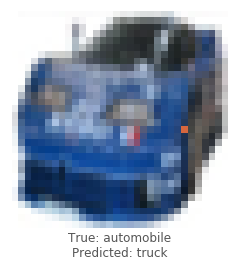

densenet - image 878 - 2 / 1000


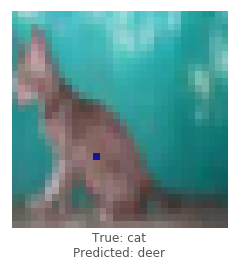

densenet - image 8164 - 3 / 1000


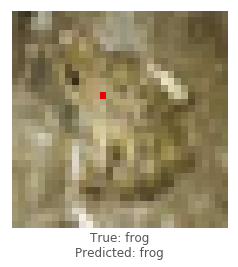

densenet - image 5652 - 4 / 1000


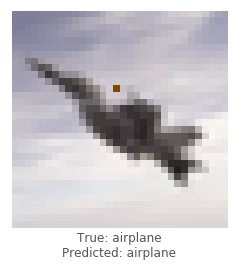

densenet - image 4609 - 5 / 1000


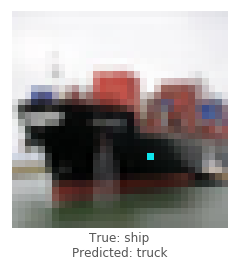

densenet - image 9545 - 6 / 1000


/home/pshah26/one-pixel-attack-keras/differential_evolution.py:585: RuntimeWarning: divide by zero encountered in double_scalars
  convergence=self.tol / convergence) is True):


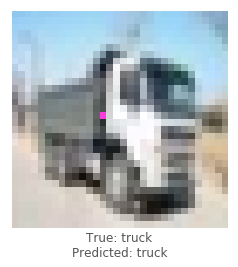

densenet - image 9368 - 7 / 1000


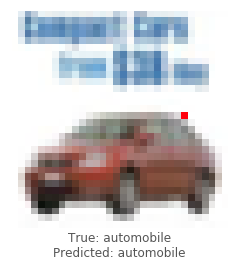

densenet - image 642 - 8 / 1000


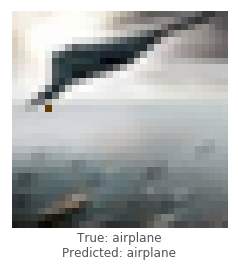

densenet - image 8376 - 9 / 1000


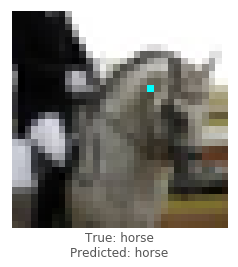

densenet - image 7740 - 10 / 1000


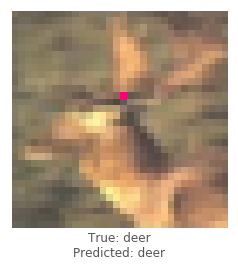

densenet - image 5187 - 11 / 1000


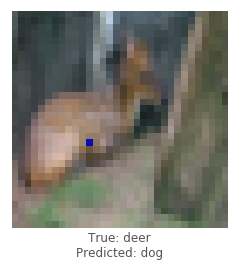

densenet - image 5389 - 12 / 1000


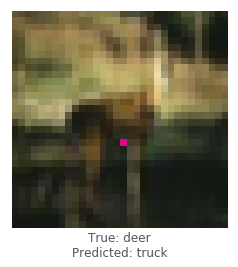

densenet - image 6769 - 13 / 1000


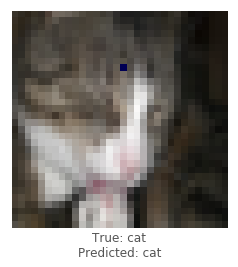

densenet - image 7808 - 14 / 1000


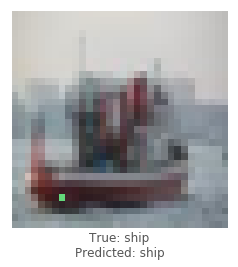

densenet - image 7294 - 15 / 1000


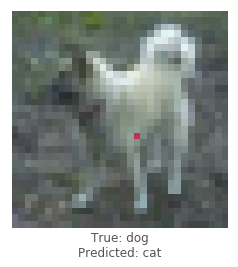

densenet - image 9079 - 16 / 1000


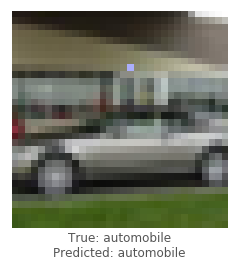

densenet - image 1559 - 17 / 1000


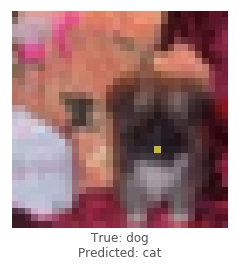

densenet - image 9366 - 18 / 1000


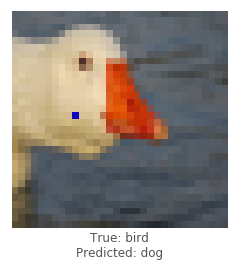

densenet - image 1542 - 19 / 1000


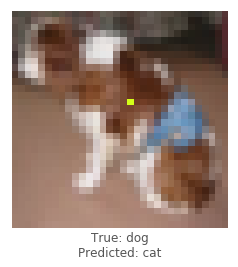

densenet - image 5494 - 20 / 1000


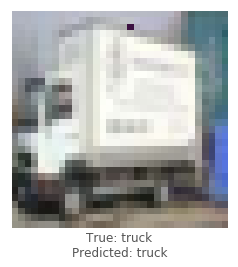

densenet - image 546 - 21 / 1000


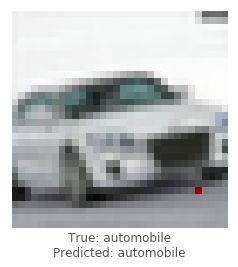

densenet - image 1084 - 22 / 1000


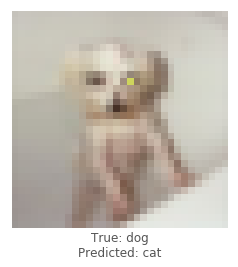

densenet - image 1304 - 23 / 1000


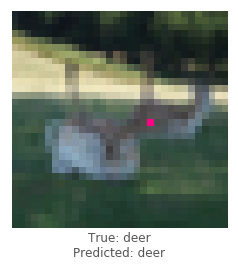

densenet - image 6389 - 24 / 1000


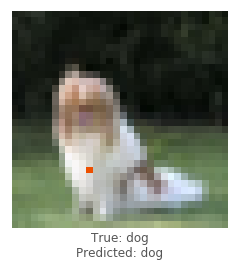

densenet - image 5991 - 25 / 1000


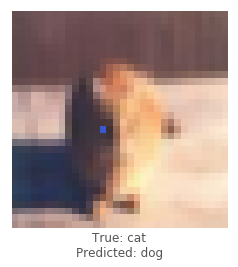

densenet - image 733 - 26 / 1000


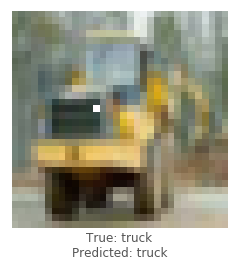

densenet - image 5197 - 27 / 1000


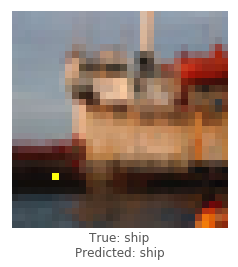

densenet - image 6844 - 28 / 1000


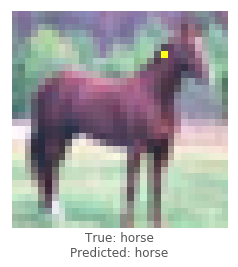

densenet - image 5795 - 29 / 1000


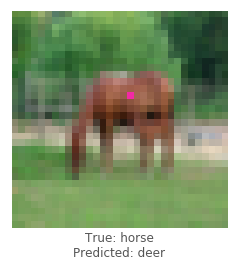

densenet - image 3092 - 30 / 1000


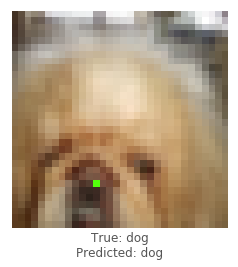

densenet - image 6583 - 31 / 1000


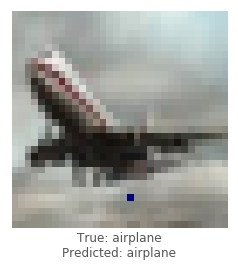

densenet - image 5249 - 32 / 1000


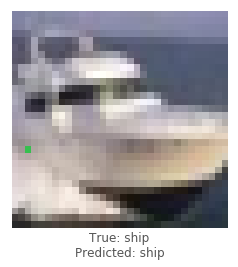

densenet - image 8916 - 33 / 1000


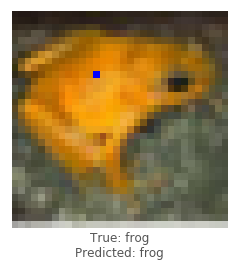

densenet - image 1605 - 34 / 1000


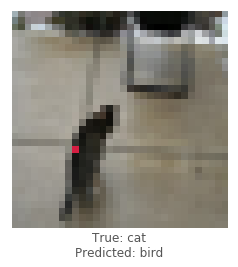

densenet - image 6398 - 35 / 1000


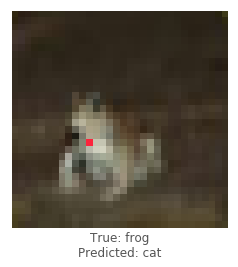

densenet - image 1494 - 36 / 1000


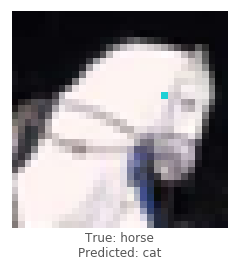

densenet - image 6099 - 37 / 1000


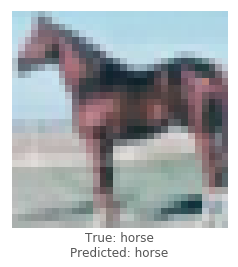

densenet - image 5098 - 38 / 1000


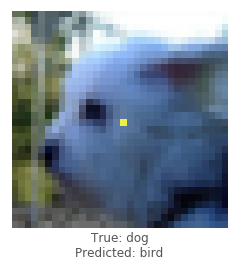

densenet - image 1004 - 39 / 1000


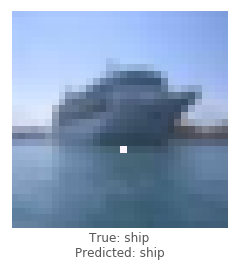

densenet - image 9678 - 40 / 1000


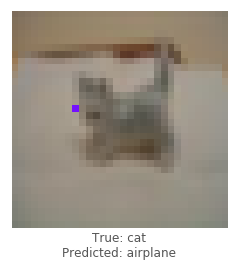

densenet - image 8437 - 41 / 1000


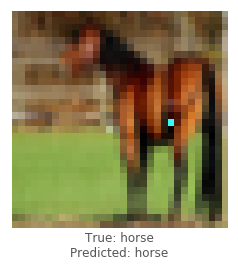

densenet - image 9370 - 42 / 1000


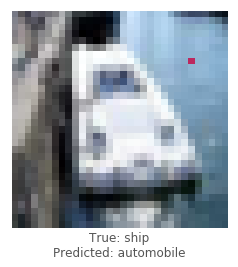

densenet - image 2581 - 43 / 1000


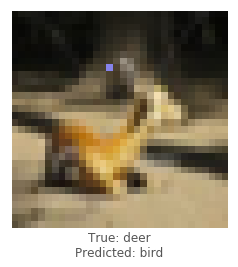

densenet - image 6284 - 44 / 1000


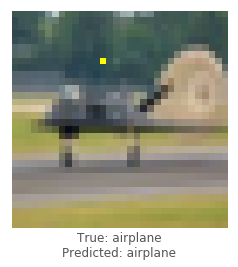

densenet - image 9429 - 45 / 1000


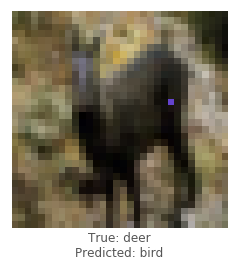

densenet - image 6793 - 46 / 1000


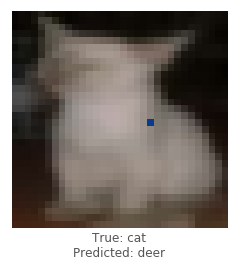

densenet - image 7566 - 47 / 1000


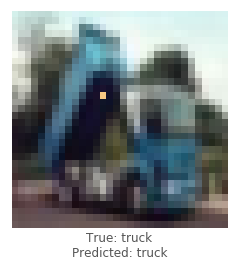

densenet - image 6139 - 48 / 1000


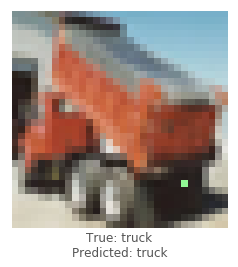

densenet - image 5574 - 49 / 1000


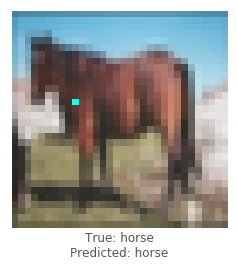

densenet - image 2932 - 50 / 1000


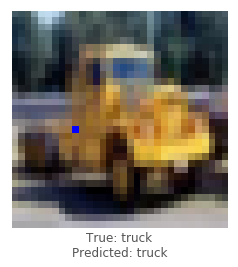

densenet - image 4451 - 51 / 1000


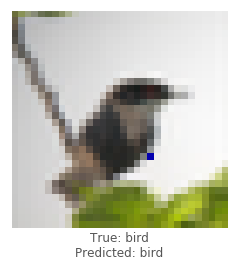

densenet - image 8133 - 52 / 1000


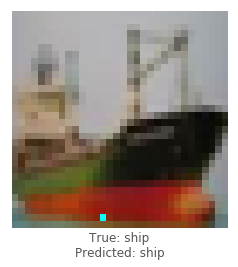

densenet - image 8606 - 53 / 1000


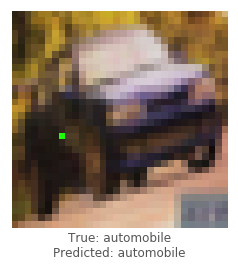

densenet - image 9300 - 54 / 1000


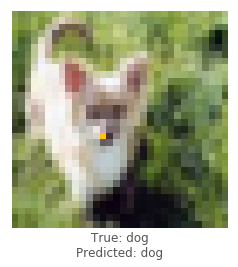

densenet - image 4613 - 55 / 1000


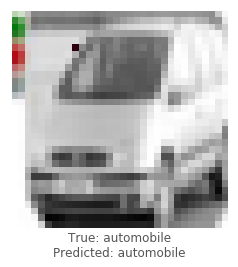

densenet - image 4135 - 56 / 1000


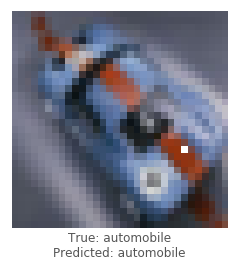

densenet - image 5938 - 57 / 1000


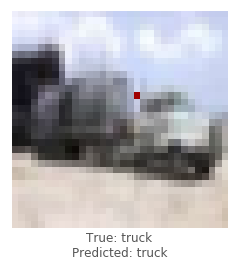

densenet - image 9351 - 58 / 1000


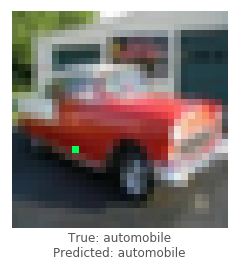

densenet - image 5575 - 59 / 1000


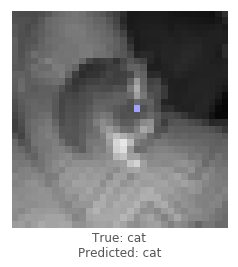

densenet - image 4941 - 60 / 1000


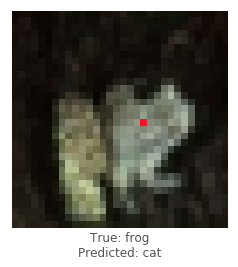

densenet - image 743 - 61 / 1000


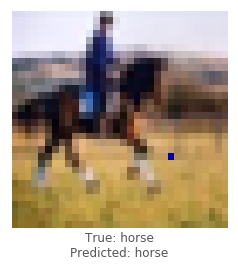

densenet - image 9398 - 62 / 1000


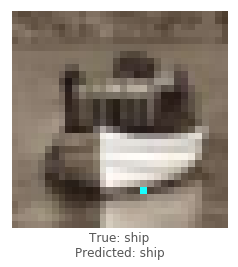

densenet - image 9943 - 63 / 1000


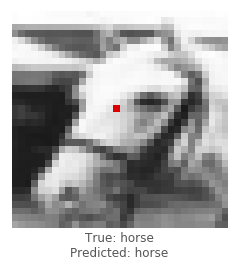

densenet - image 8977 - 64 / 1000


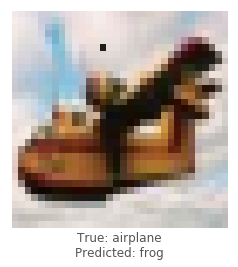

densenet - image 3461 - 65 / 1000


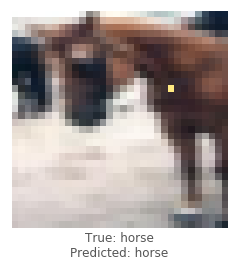

densenet - image 4531 - 66 / 1000


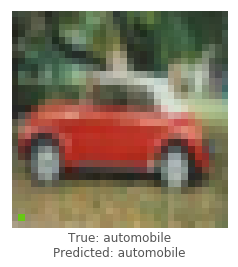

densenet - image 895 - 67 / 1000


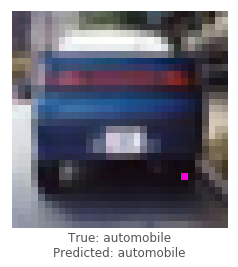

densenet - image 798 - 68 / 1000


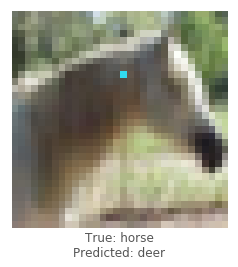

densenet - image 9800 - 69 / 1000


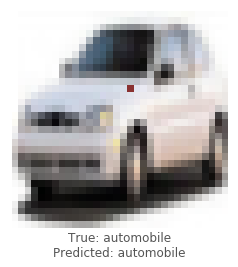

densenet - image 1092 - 70 / 1000


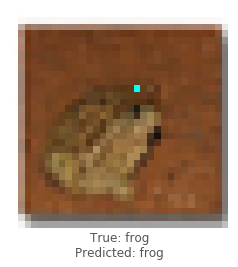

densenet - image 5833 - 71 / 1000


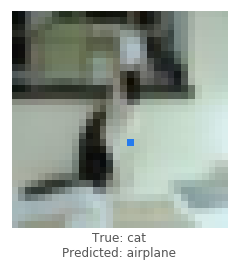

densenet - image 6360 - 72 / 1000


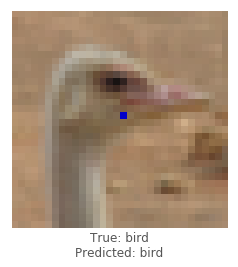

densenet - image 3326 - 73 / 1000


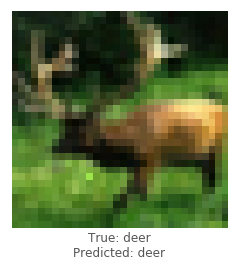

densenet - image 6678 - 74 / 1000


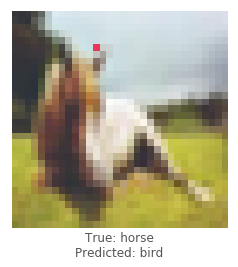

densenet - image 5088 - 75 / 1000


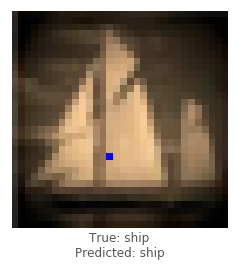

densenet - image 3390 - 76 / 1000


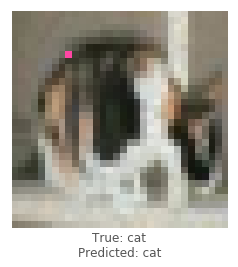

densenet - image 1285 - 77 / 1000


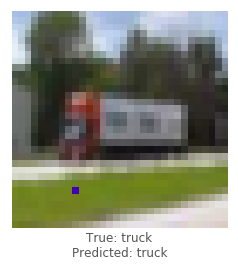

densenet - image 5551 - 78 / 1000


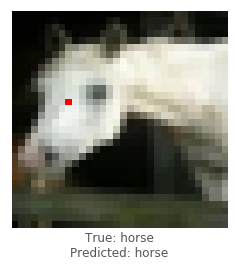

densenet - image 1320 - 79 / 1000


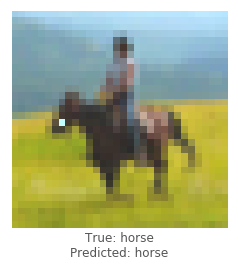

densenet - image 1483 - 80 / 1000


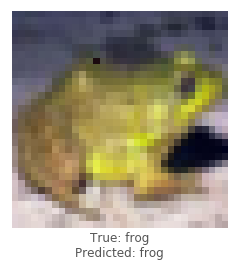

densenet - image 2823 - 81 / 1000


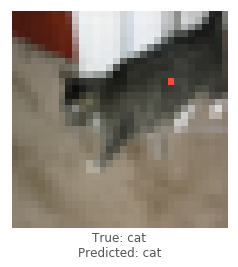

densenet - image 717 - 82 / 1000


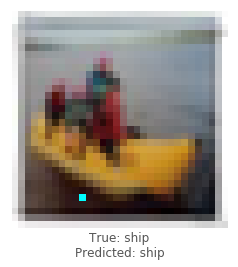

densenet - image 4769 - 83 / 1000


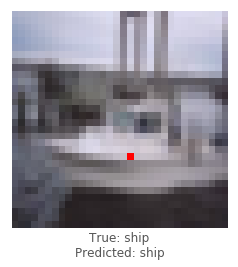

densenet - image 3337 - 84 / 1000


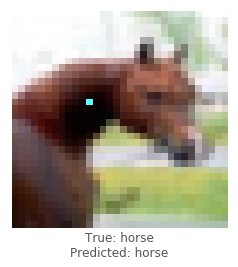

densenet - image 91 - 85 / 1000


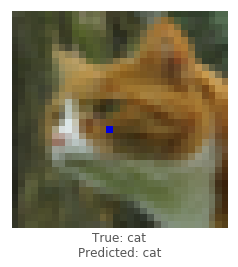

densenet - image 8444 - 86 / 1000


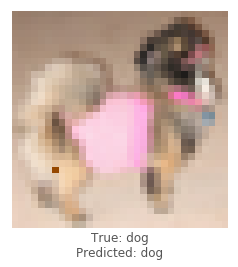

densenet - image 1352 - 87 / 1000


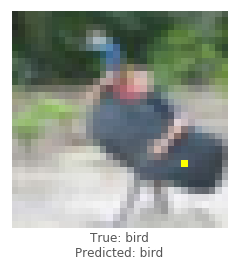

densenet - image 673 - 88 / 1000


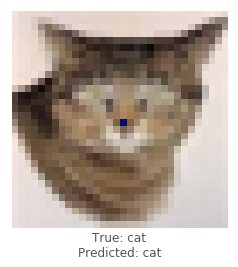

densenet - image 2383 - 89 / 1000


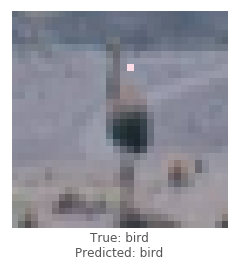

densenet - image 4959 - 90 / 1000


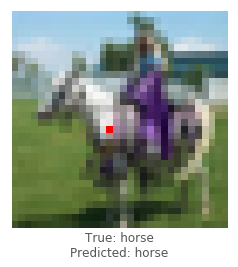

densenet - image 1377 - 91 / 1000


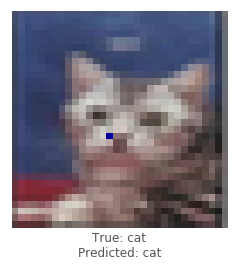

densenet - image 6076 - 92 / 1000


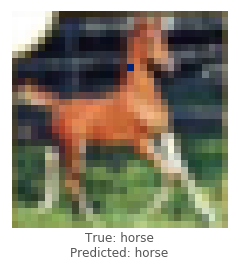

densenet - image 3666 - 93 / 1000


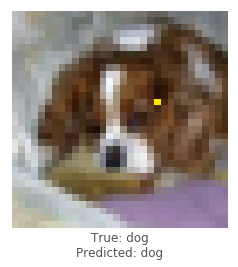

densenet - image 2560 - 94 / 1000


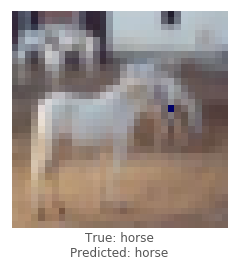

densenet - image 7959 - 95 / 1000


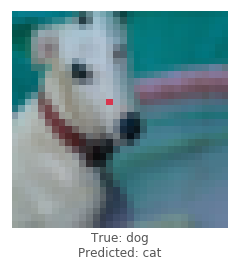

densenet - image 5891 - 96 / 1000


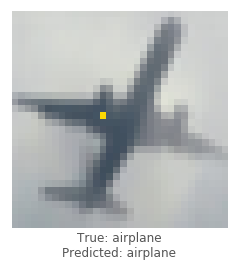

densenet - image 4651 - 97 / 1000


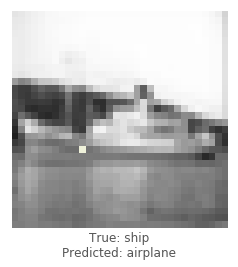

densenet - image 2638 - 98 / 1000


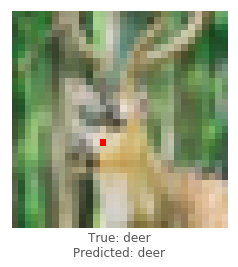

densenet - image 9764 - 99 / 1000


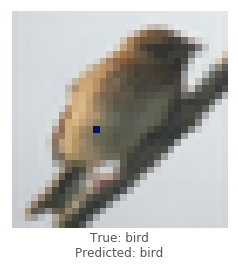

densenet - image 362 - 100 / 1000


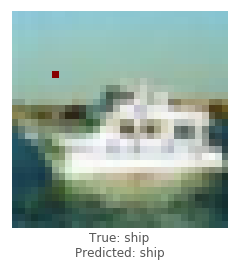

densenet - image 5909 - 101 / 1000


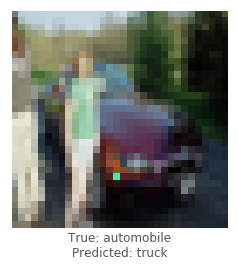

densenet - image 7291 - 102 / 1000


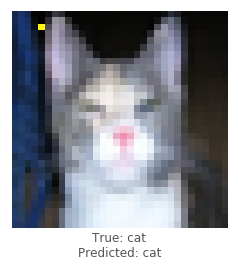

densenet - image 7751 - 103 / 1000


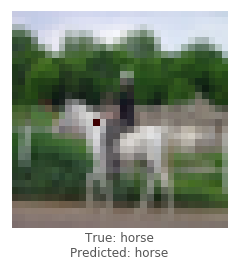

densenet - image 7233 - 104 / 1000


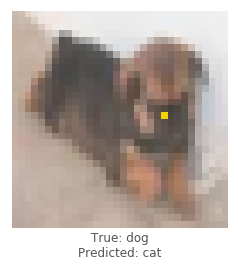

densenet - image 511 - 105 / 1000


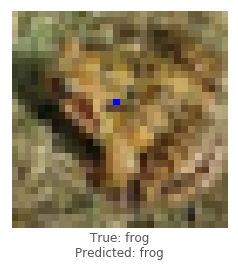

densenet - image 2410 - 106 / 1000


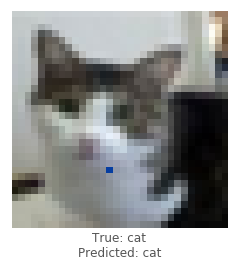

densenet - image 3944 - 107 / 1000


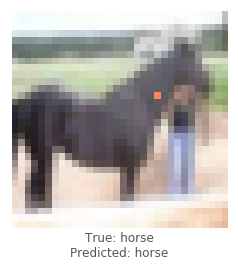

densenet - image 6604 - 108 / 1000


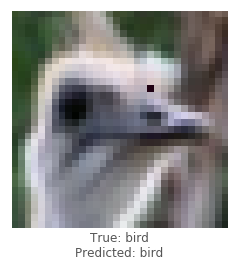

densenet - image 4606 - 109 / 1000


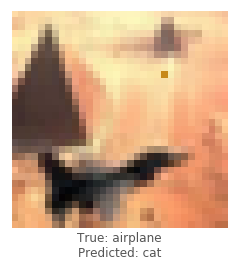

densenet - image 5593 - 110 / 1000


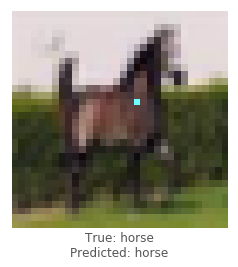

densenet - image 2942 - 111 / 1000


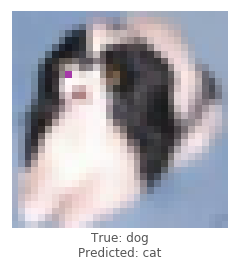

densenet - image 2520 - 112 / 1000


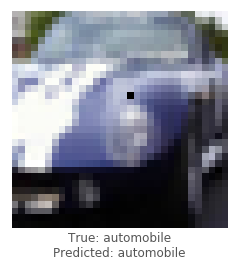

densenet - image 1689 - 113 / 1000


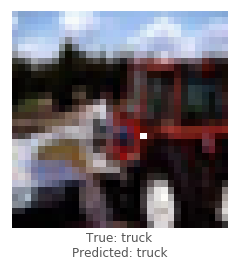

densenet - image 3553 - 114 / 1000


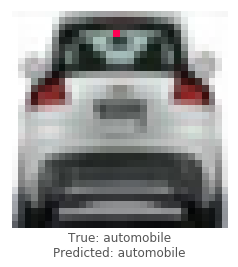

densenet - image 8772 - 115 / 1000


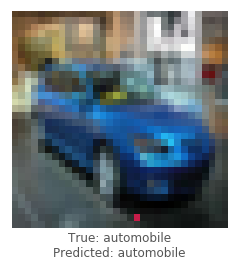

densenet - image 979 - 116 / 1000


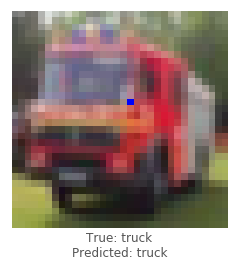

densenet - image 8243 - 117 / 1000


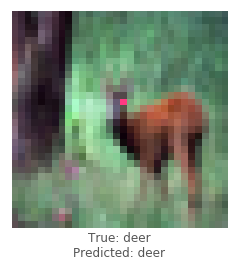

densenet - image 5629 - 118 / 1000


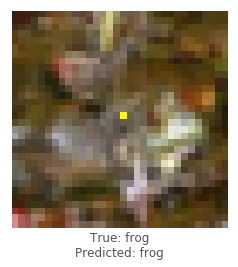

densenet - image 1914 - 119 / 1000


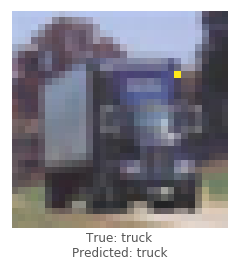

densenet - image 9742 - 120 / 1000


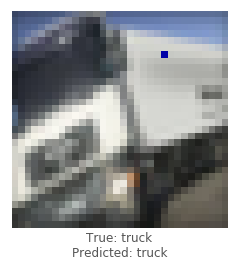

densenet - image 4574 - 121 / 1000


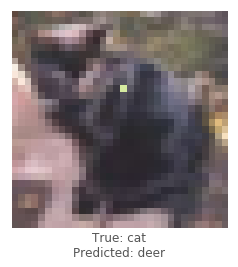

densenet - image 4896 - 122 / 1000


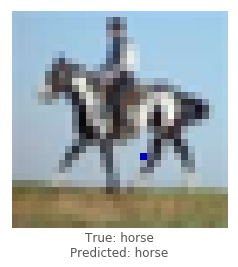

densenet - image 6081 - 123 / 1000


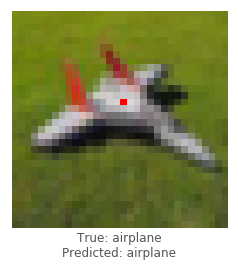

densenet - image 1399 - 124 / 1000


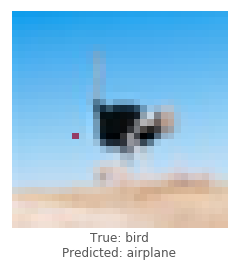

densenet - image 5521 - 125 / 1000


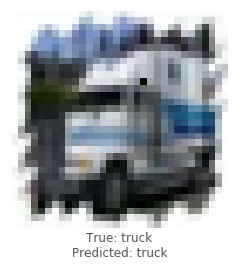

densenet - image 6098 - 126 / 1000


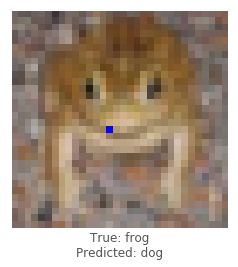

densenet - image 6697 - 127 / 1000


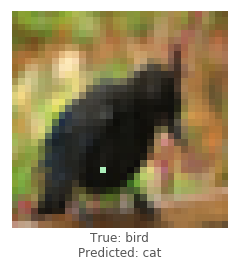

densenet - image 9983 - 128 / 1000


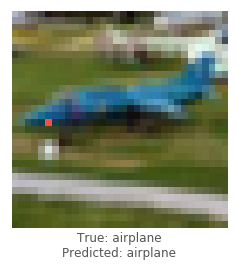

densenet - image 4008 - 129 / 1000


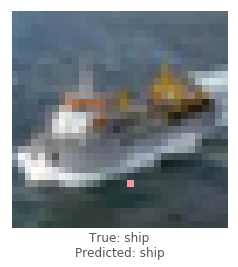

densenet - image 4282 - 130 / 1000


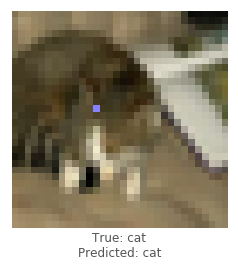

densenet - image 9527 - 131 / 1000


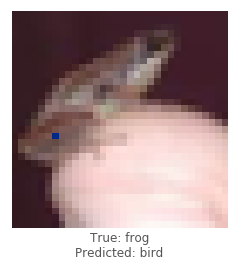

densenet - image 2692 - 132 / 1000


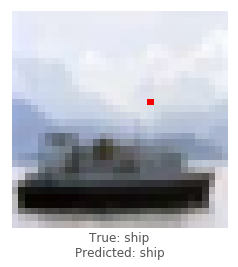

densenet - image 7639 - 133 / 1000


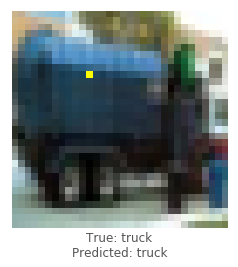

densenet - image 2099 - 134 / 1000


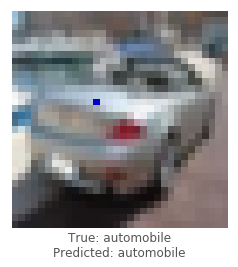

densenet - image 3820 - 135 / 1000


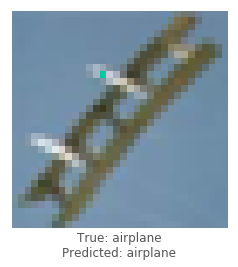

densenet - image 4653 - 136 / 1000


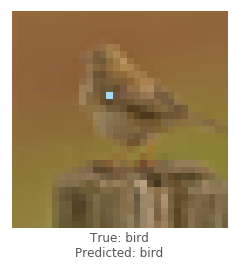

densenet - image 2680 - 137 / 1000


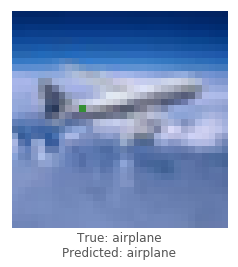

densenet - image 8764 - 138 / 1000


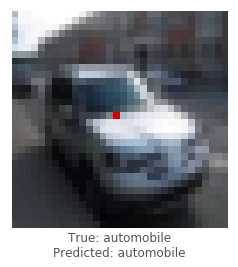

densenet - image 5716 - 139 / 1000


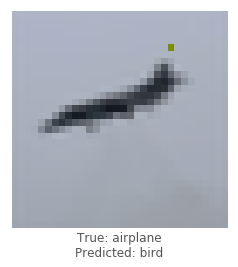

densenet - image 8058 - 140 / 1000


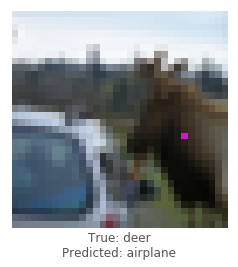

densenet - image 768 - 141 / 1000


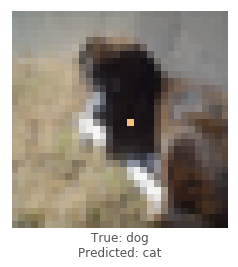

densenet - image 7358 - 142 / 1000


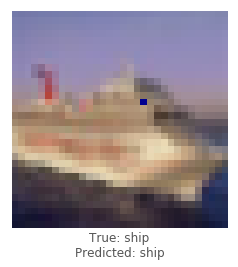

densenet - image 5515 - 143 / 1000


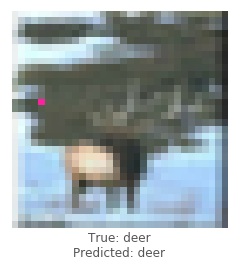

densenet - image 6745 - 144 / 1000


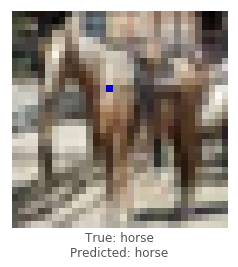

densenet - image 7167 - 145 / 1000


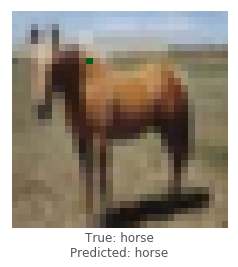

densenet - image 4659 - 146 / 1000


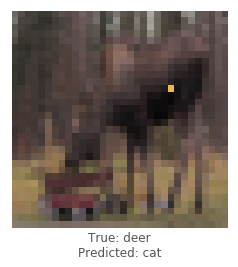

densenet - image 2686 - 147 / 1000


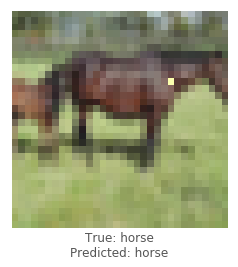

densenet - image 9340 - 148 / 1000


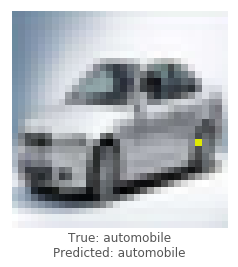

densenet - image 5680 - 149 / 1000


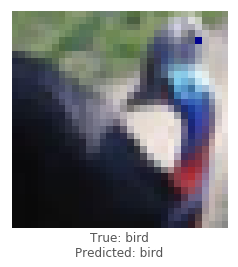

densenet - image 3355 - 150 / 1000


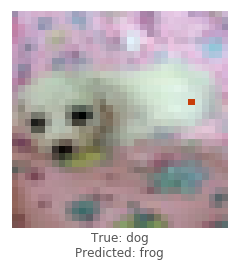

densenet - image 7493 - 151 / 1000


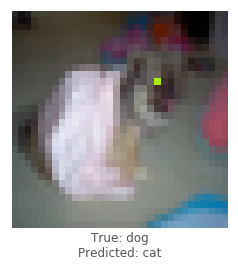

densenet - image 6229 - 152 / 1000


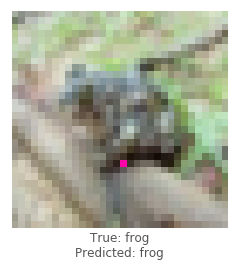

densenet - image 4844 - 153 / 1000


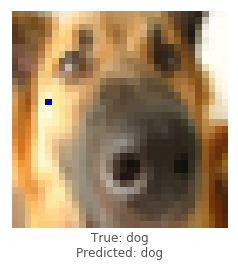

densenet - image 7789 - 154 / 1000


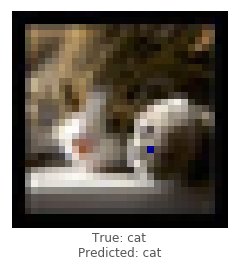

densenet - image 283 - 155 / 1000


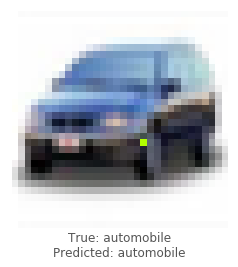

densenet - image 9235 - 156 / 1000


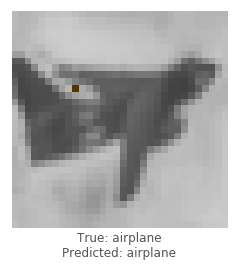

densenet - image 794 - 157 / 1000


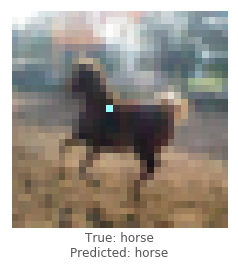

densenet - image 7055 - 158 / 1000


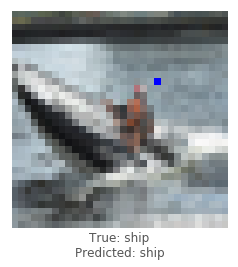

densenet - image 1501 - 159 / 1000


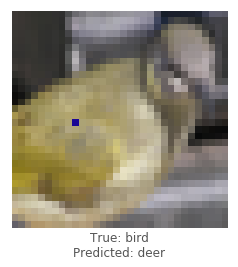

densenet - image 5518 - 160 / 1000


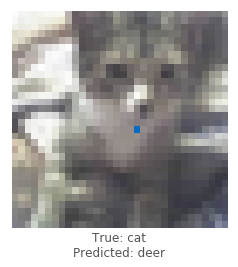

densenet - image 6354 - 161 / 1000


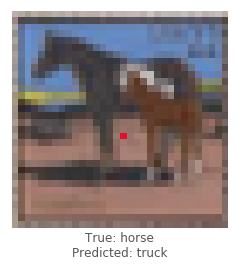

densenet - image 3654 - 162 / 1000


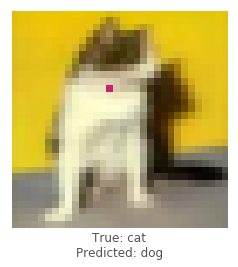

densenet - image 3857 - 163 / 1000


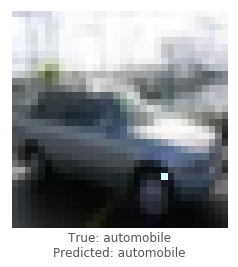

densenet - image 1200 - 164 / 1000


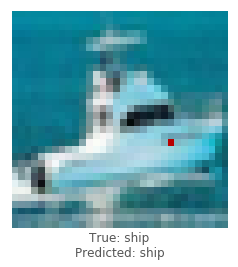

densenet - image 3252 - 165 / 1000


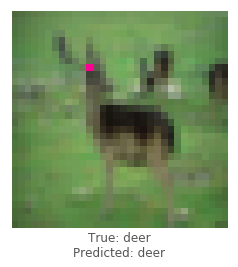

densenet - image 3802 - 166 / 1000


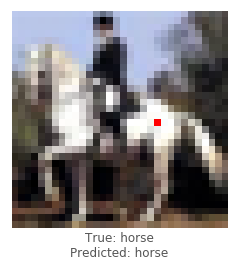

densenet - image 3361 - 167 / 1000


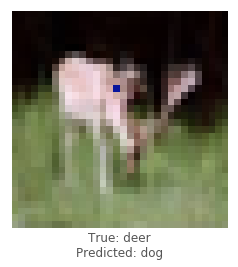

densenet - image 8492 - 168 / 1000


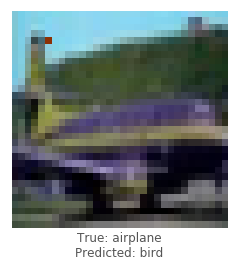

densenet - image 955 - 169 / 1000


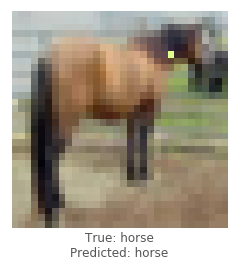

densenet - image 8430 - 170 / 1000


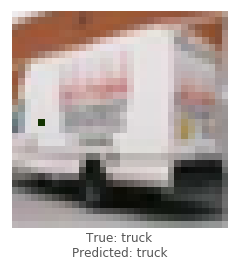

densenet - image 715 - 171 / 1000


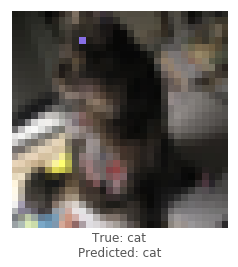

densenet - image 5598 - 172 / 1000


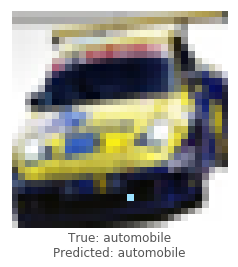

densenet - image 7519 - 173 / 1000


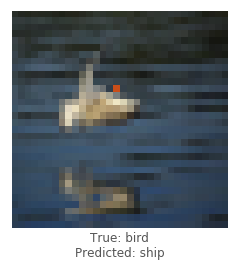

densenet - image 5786 - 174 / 1000


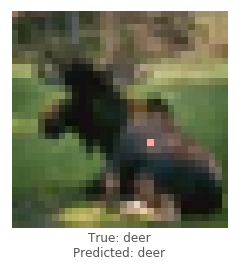

densenet - image 9937 - 175 / 1000


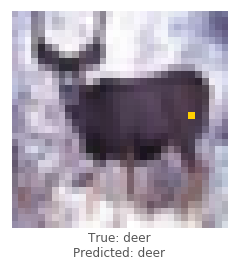

densenet - image 5351 - 176 / 1000


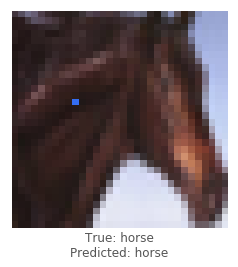

densenet - image 5166 - 177 / 1000


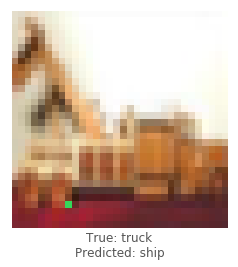

densenet - image 7937 - 178 / 1000


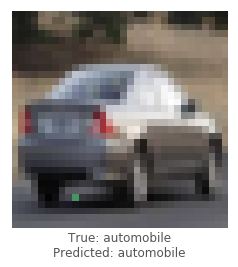

densenet - image 873 - 179 / 1000


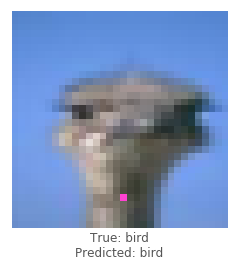

densenet - image 8959 - 180 / 1000


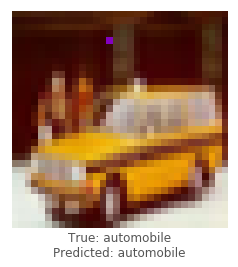

densenet - image 6766 - 181 / 1000


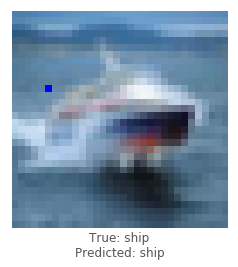

densenet - image 4571 - 182 / 1000


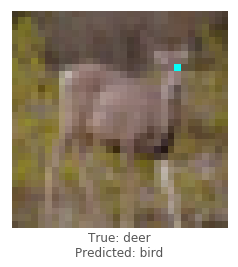

densenet - image 6524 - 183 / 1000


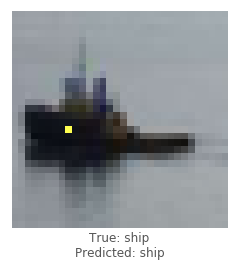

densenet - image 7562 - 184 / 1000


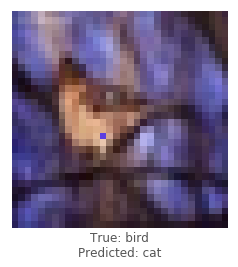

densenet - image 2787 - 185 / 1000


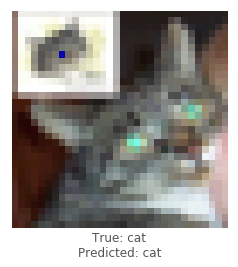

densenet - image 2610 - 186 / 1000


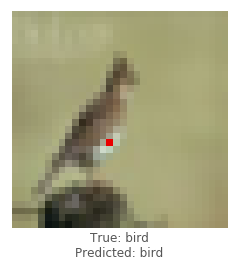

densenet - image 6001 - 187 / 1000


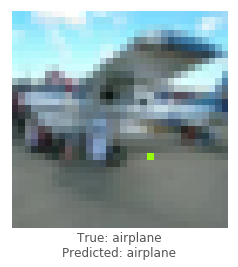

densenet - image 3672 - 188 / 1000


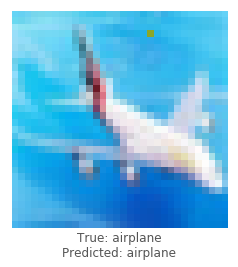

densenet - image 3476 - 189 / 1000


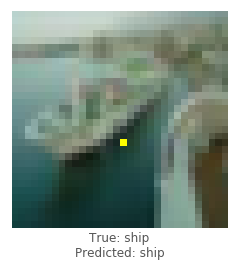

densenet - image 4353 - 190 / 1000


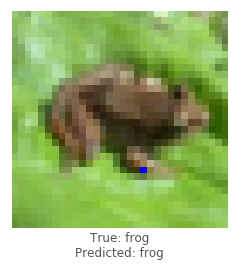

densenet - image 8858 - 191 / 1000


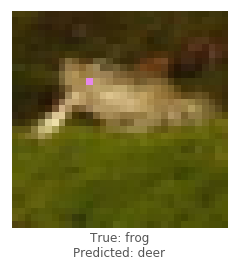

densenet - image 2349 - 192 / 1000


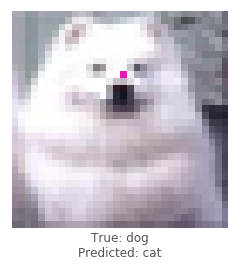

densenet - image 3743 - 193 / 1000


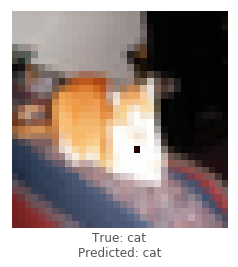

densenet - image 4837 - 194 / 1000


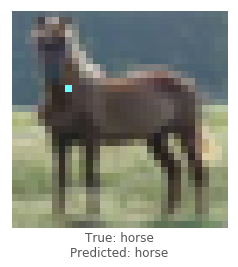

densenet - image 2750 - 195 / 1000


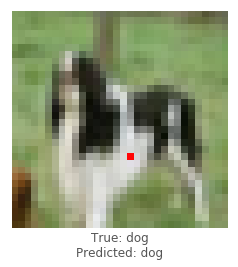

densenet - image 8392 - 196 / 1000


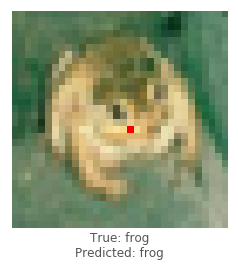

densenet - image 958 - 197 / 1000


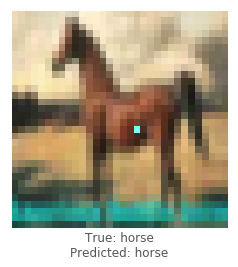

densenet - image 8744 - 198 / 1000


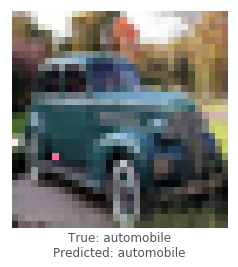

densenet - image 5258 - 199 / 1000


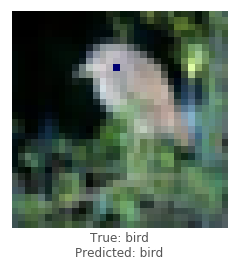

densenet - image 6258 - 200 / 1000


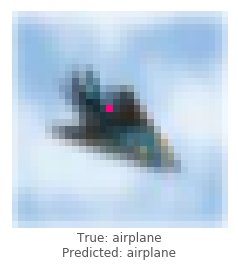

densenet - image 6639 - 201 / 1000


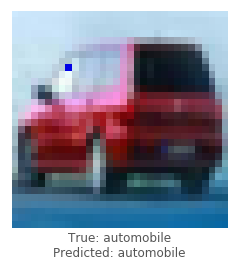

densenet - image 2077 - 202 / 1000


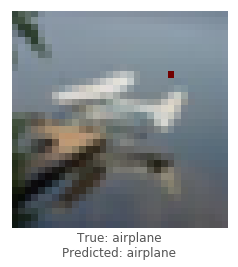

densenet - image 2791 - 203 / 1000


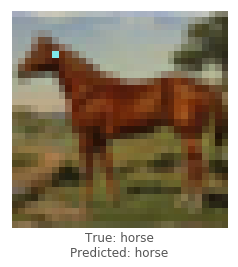

densenet - image 4885 - 204 / 1000


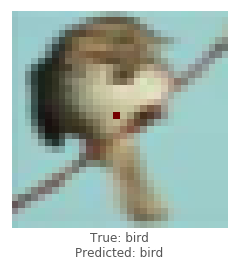

densenet - image 6803 - 205 / 1000


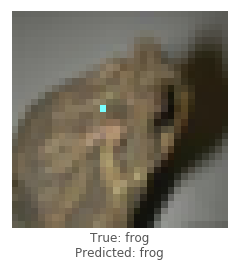

densenet - image 8590 - 206 / 1000


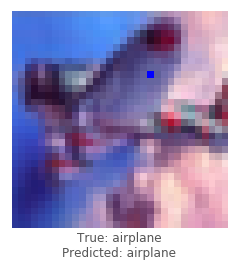

densenet - image 2939 - 207 / 1000


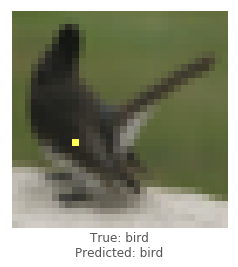

densenet - image 7897 - 208 / 1000


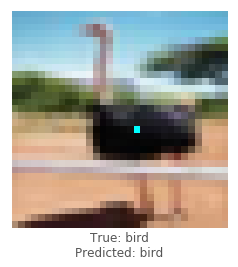

densenet - image 2386 - 209 / 1000


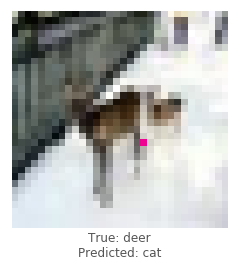

densenet - image 8537 - 210 / 1000


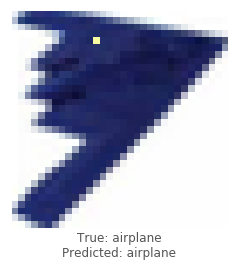

densenet - image 5961 - 211 / 1000


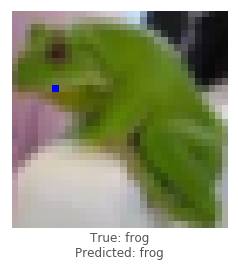

densenet - image 9030 - 212 / 1000


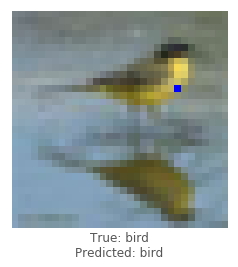

densenet - image 6097 - 213 / 1000


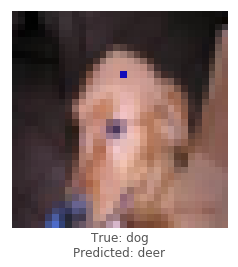

densenet - image 9610 - 214 / 1000


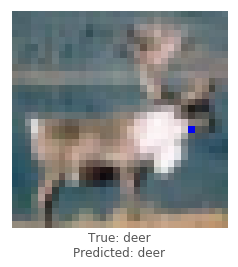

densenet - image 6765 - 215 / 1000


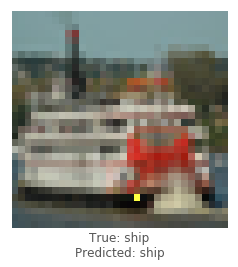

densenet - image 718 - 216 / 1000


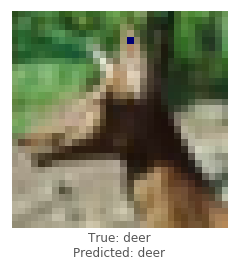

densenet - image 5357 - 217 / 1000


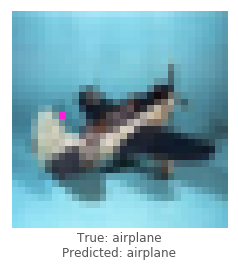

densenet - image 3057 - 218 / 1000


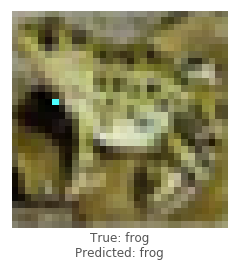

densenet - image 7319 - 219 / 1000


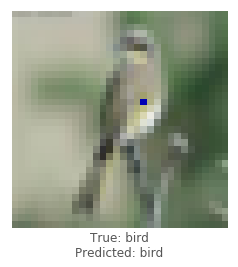

densenet - image 4722 - 220 / 1000


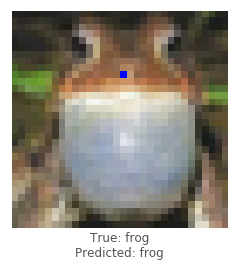

densenet - image 6823 - 221 / 1000


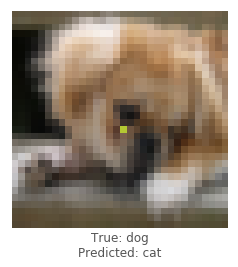

densenet - image 3282 - 222 / 1000


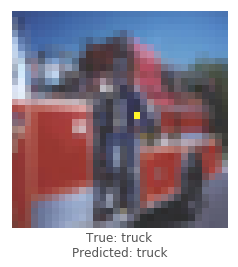

densenet - image 9967 - 223 / 1000


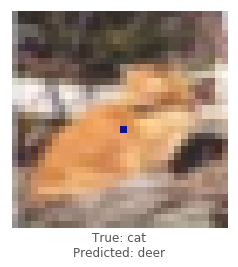

densenet - image 3837 - 224 / 1000


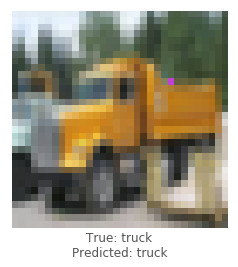

densenet - image 8230 - 225 / 1000


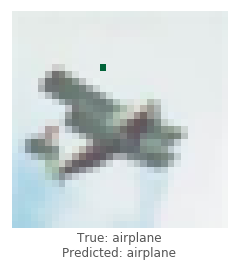

densenet - image 1517 - 226 / 1000


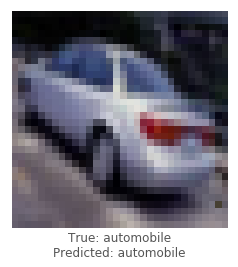

densenet - image 160 - 227 / 1000


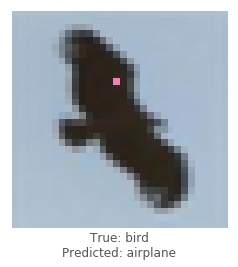

densenet - image 6006 - 228 / 1000


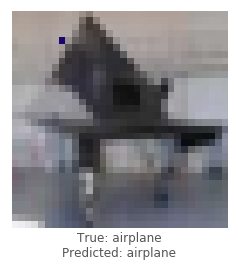

densenet - image 3776 - 229 / 1000


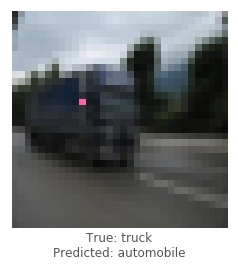

densenet - image 9428 - 230 / 1000


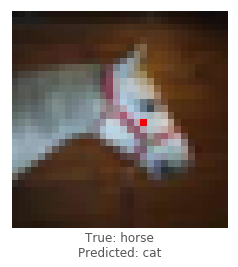

densenet - image 463 - 231 / 1000


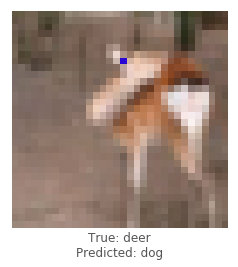

densenet - image 2900 - 232 / 1000


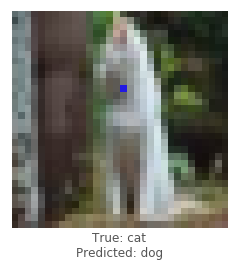

densenet - image 8129 - 233 / 1000


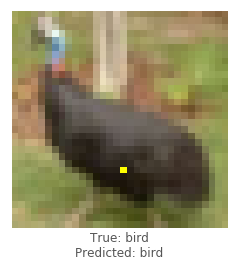

densenet - image 2401 - 234 / 1000


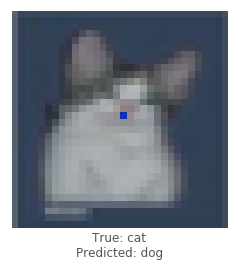

densenet - image 8331 - 235 / 1000


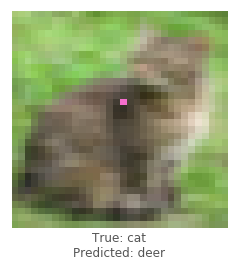

densenet - image 120 - 236 / 1000


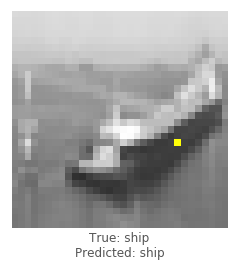

densenet - image 2822 - 237 / 1000


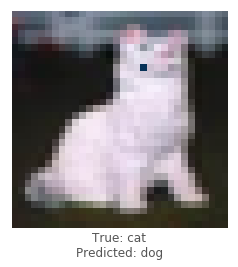

densenet - image 8855 - 238 / 1000


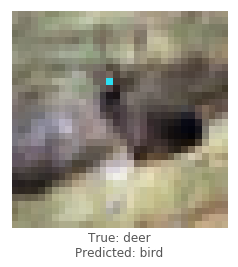

densenet - image 6509 - 239 / 1000


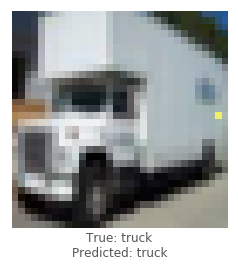

densenet - image 6953 - 240 / 1000


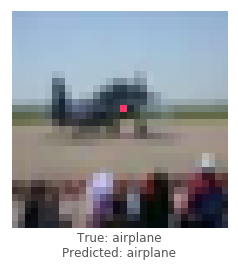

densenet - image 7288 - 241 / 1000


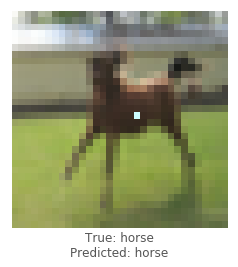

densenet - image 7136 - 242 / 1000


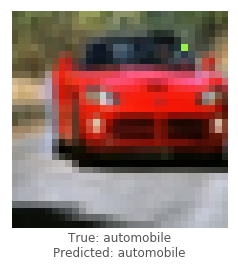

densenet - image 5738 - 243 / 1000


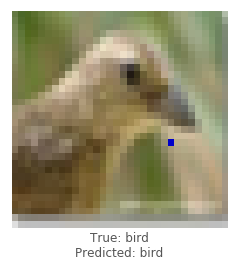

densenet - image 7389 - 244 / 1000


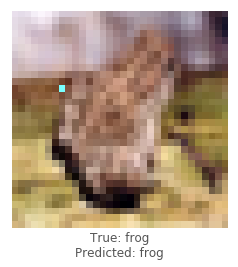

densenet - image 7025 - 245 / 1000


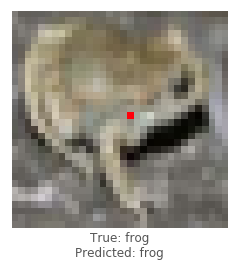

densenet - image 4774 - 246 / 1000


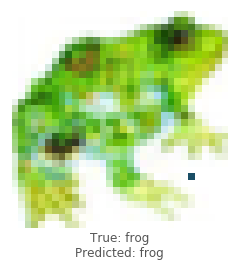

densenet - image 7102 - 247 / 1000


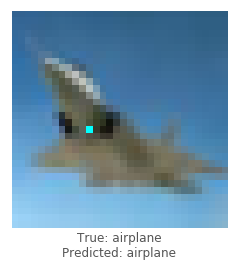

densenet - image 3962 - 248 / 1000


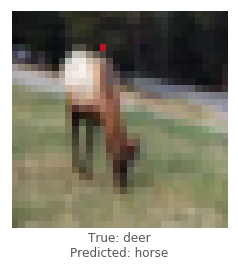

densenet - image 4382 - 249 / 1000


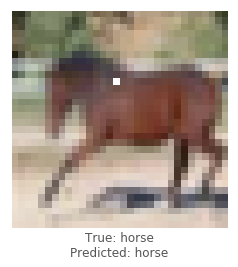

densenet - image 7667 - 250 / 1000


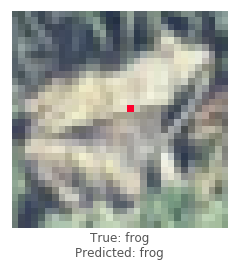

densenet - image 8309 - 251 / 1000


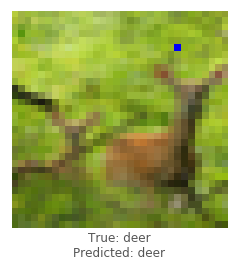

densenet - image 2572 - 252 / 1000


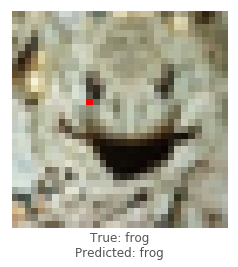

densenet - image 6743 - 253 / 1000


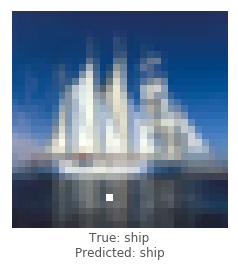

densenet - image 1971 - 254 / 1000


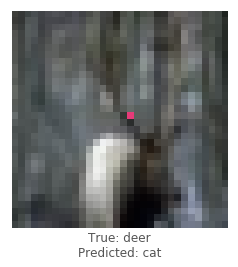

densenet - image 9887 - 255 / 1000


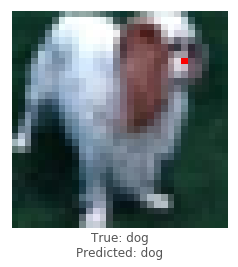

densenet - image 9917 - 256 / 1000


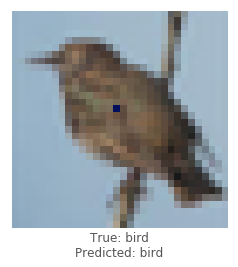

densenet - image 4030 - 257 / 1000


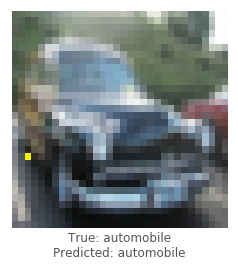

densenet - image 4208 - 258 / 1000


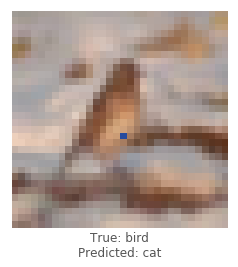

densenet - image 7746 - 259 / 1000


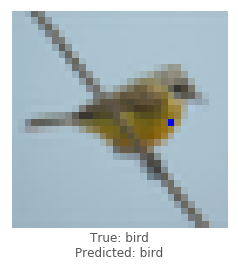

densenet - image 9224 - 260 / 1000


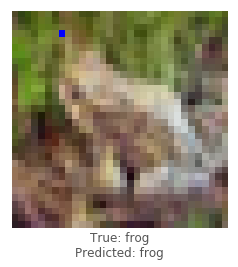

densenet - image 985 - 261 / 1000


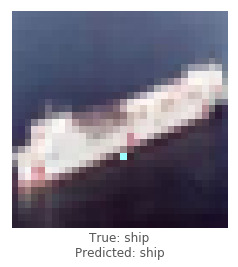

densenet - image 9523 - 262 / 1000


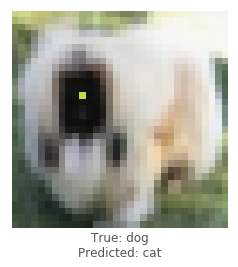

densenet - image 5835 - 263 / 1000


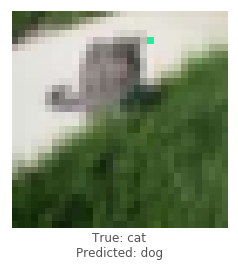

densenet - image 6773 - 264 / 1000


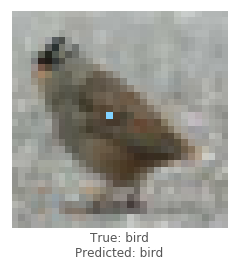

densenet - image 5365 - 265 / 1000


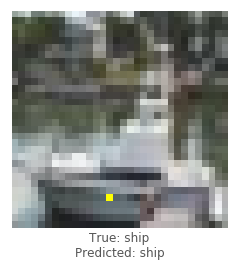

densenet - image 8496 - 266 / 1000


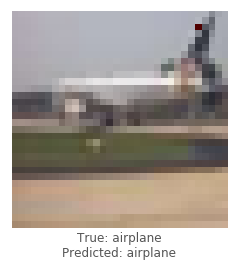

densenet - image 165 - 267 / 1000


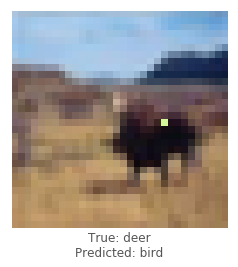

densenet - image 8895 - 268 / 1000


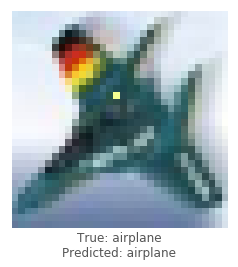

densenet - image 9295 - 269 / 1000


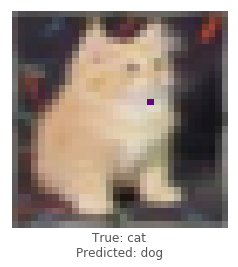

densenet - image 2973 - 270 / 1000


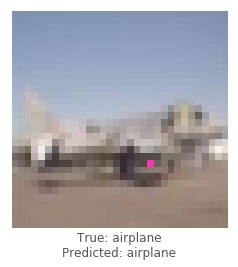

densenet - image 8478 - 271 / 1000


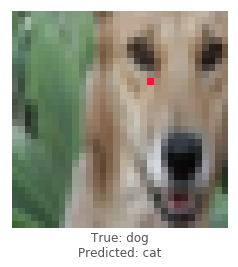

densenet - image 3577 - 272 / 1000


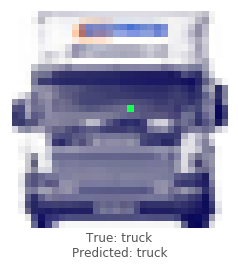

densenet - image 3314 - 273 / 1000


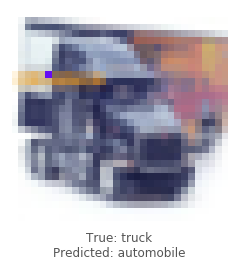

densenet - image 7314 - 274 / 1000


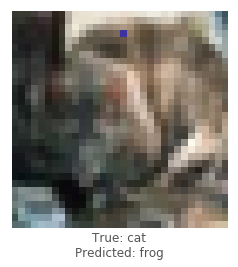

densenet - image 6920 - 275 / 1000


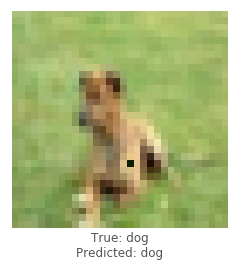

densenet - image 1162 - 276 / 1000


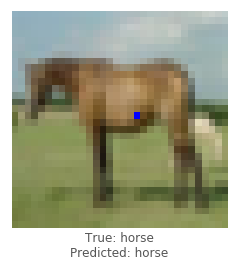

densenet - image 7830 - 277 / 1000


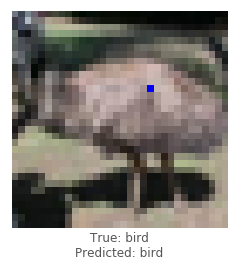

densenet - image 8295 - 278 / 1000


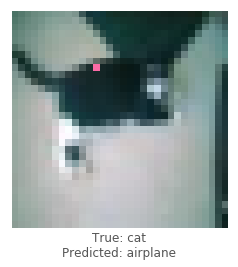

densenet - image 7201 - 279 / 1000


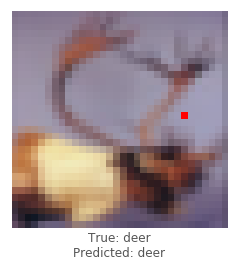

densenet - image 607 - 280 / 1000


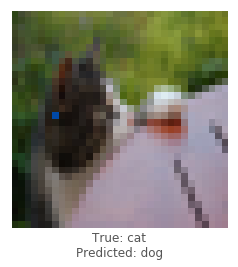

densenet - image 3500 - 281 / 1000


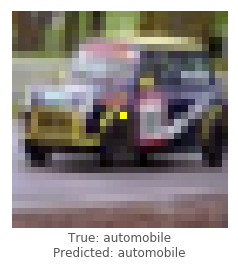

densenet - image 9709 - 282 / 1000


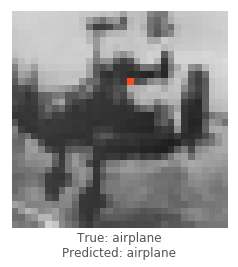

densenet - image 4375 - 283 / 1000


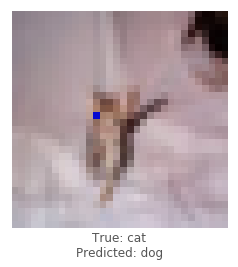

densenet - image 9437 - 284 / 1000


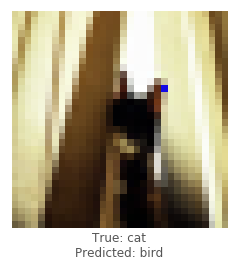

densenet - image 1872 - 285 / 1000


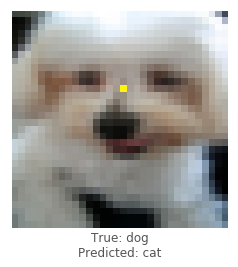

densenet - image 9249 - 286 / 1000


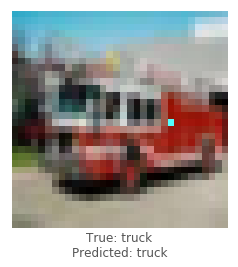

densenet - image 2828 - 287 / 1000


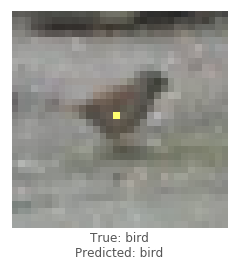

densenet - image 8161 - 288 / 1000


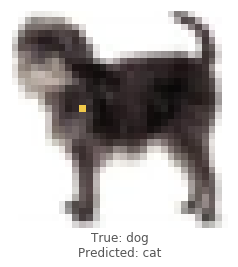

densenet - image 6850 - 289 / 1000


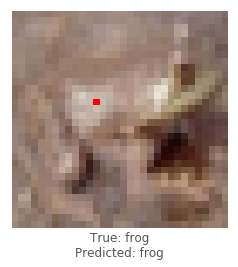

densenet - image 3554 - 290 / 1000


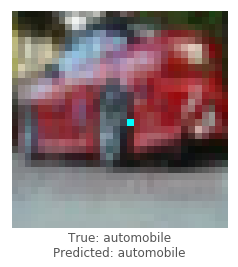

densenet - image 1586 - 291 / 1000


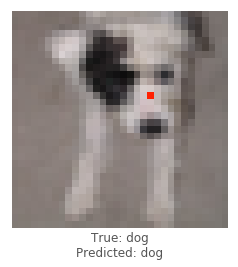

densenet - image 6025 - 292 / 1000


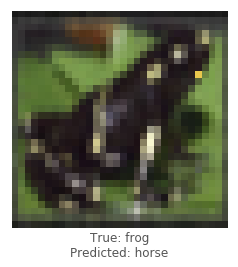

densenet - image 8873 - 293 / 1000


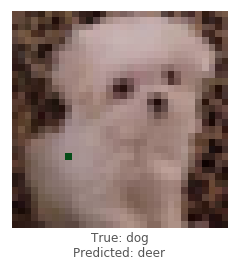

densenet - image 5868 - 294 / 1000


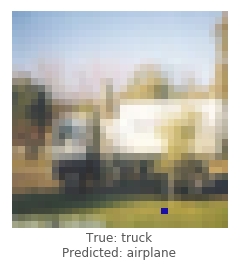

densenet - image 8541 - 295 / 1000


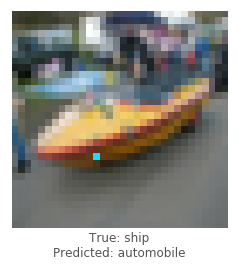

densenet - image 4799 - 296 / 1000


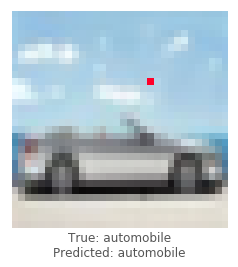

densenet - image 4525 - 297 / 1000


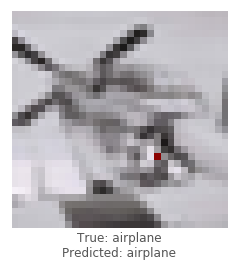

densenet - image 6266 - 298 / 1000


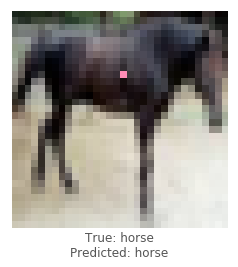

densenet - image 5673 - 299 / 1000


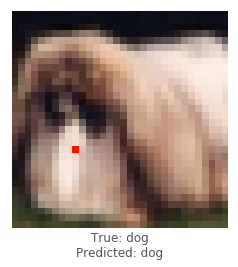

densenet - image 6777 - 300 / 1000


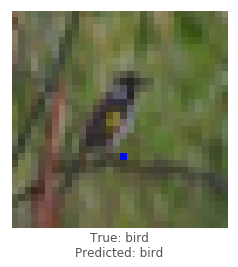

densenet - image 77 - 301 / 1000


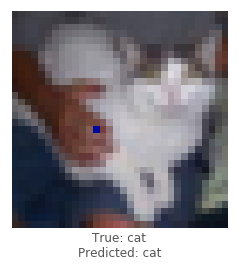

densenet - image 1817 - 302 / 1000


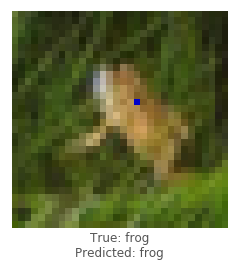

densenet - image 8102 - 303 / 1000


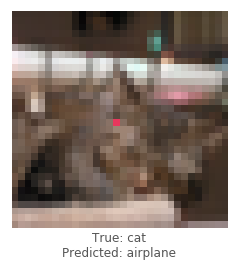

densenet - image 7200 - 304 / 1000


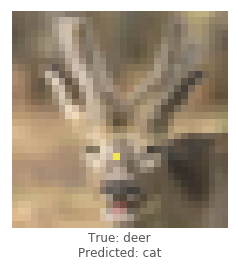

densenet - image 2562 - 305 / 1000


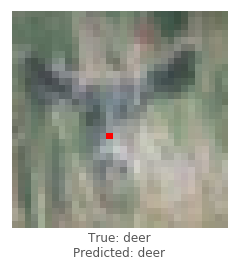

densenet - image 3751 - 306 / 1000


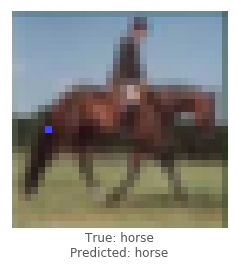

densenet - image 446 - 307 / 1000


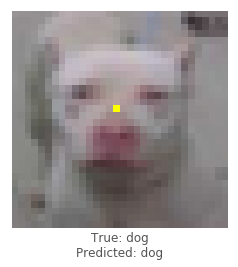

densenet - image 2743 - 308 / 1000


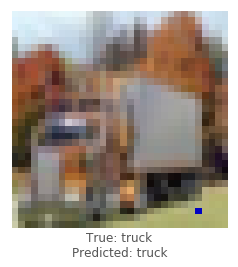

densenet - image 8835 - 309 / 1000


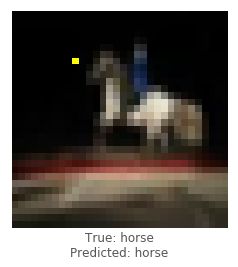

densenet - image 879 - 310 / 1000


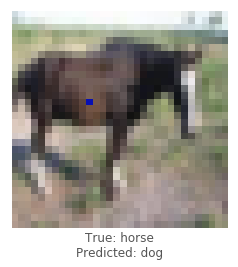

densenet - image 2799 - 311 / 1000


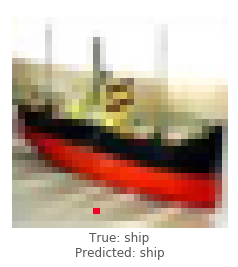

densenet - image 8423 - 312 / 1000


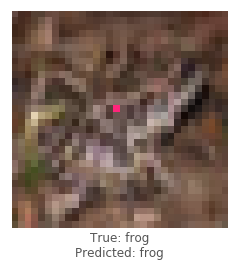

densenet - image 9019 - 313 / 1000


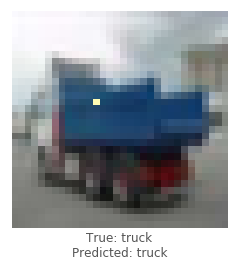

densenet - image 4870 - 314 / 1000


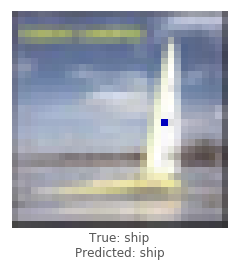

densenet - image 4753 - 315 / 1000


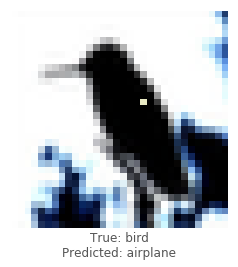

densenet - image 623 - 316 / 1000


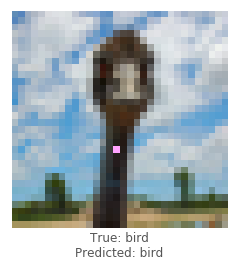

densenet - image 5587 - 317 / 1000


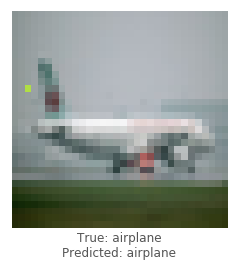

densenet - image 6619 - 318 / 1000


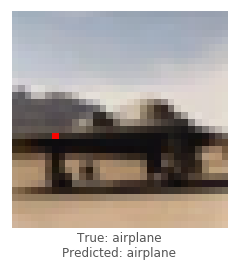

densenet - image 7770 - 319 / 1000


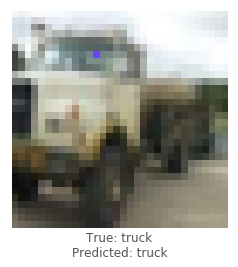

densenet - image 300 - 320 / 1000


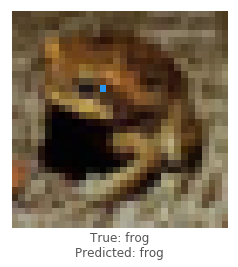

densenet - image 356 - 321 / 1000


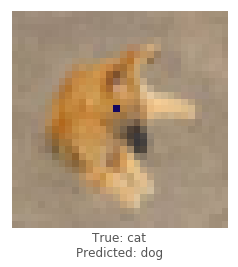

densenet - image 5932 - 322 / 1000


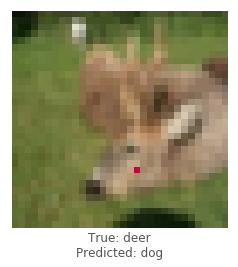

densenet - image 3035 - 323 / 1000


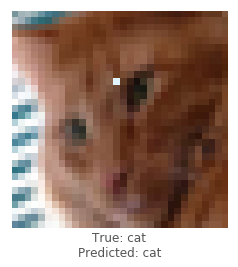

densenet - image 7792 - 324 / 1000


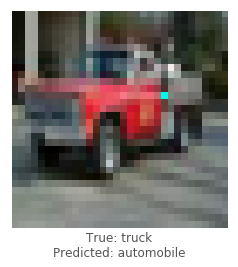

densenet - image 8686 - 325 / 1000


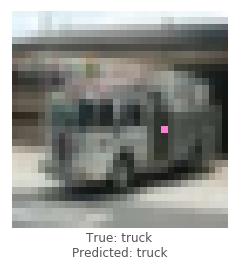

densenet - image 6367 - 326 / 1000


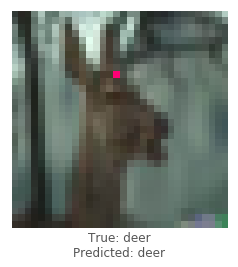

densenet - image 3194 - 327 / 1000


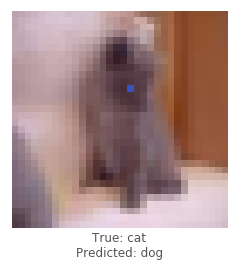

densenet - image 7874 - 328 / 1000


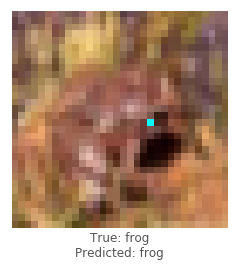

densenet - image 6028 - 329 / 1000


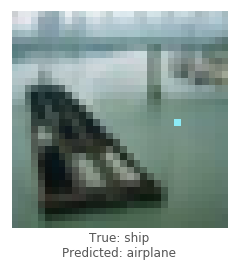

densenet - image 9256 - 330 / 1000


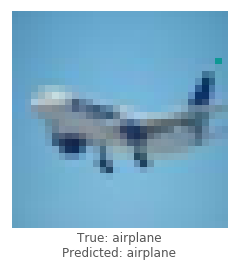

densenet - image 2655 - 331 / 1000


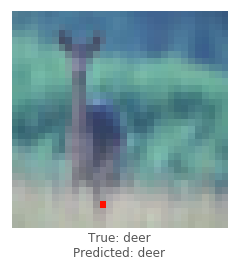

densenet - image 453 - 332 / 1000


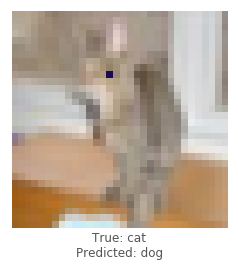

densenet - image 2001 - 333 / 1000


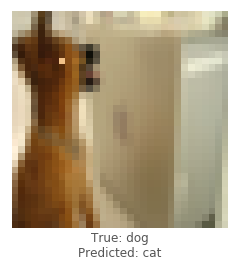

densenet - image 6691 - 334 / 1000


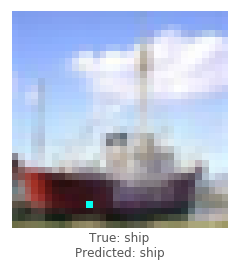

densenet - image 2961 - 335 / 1000


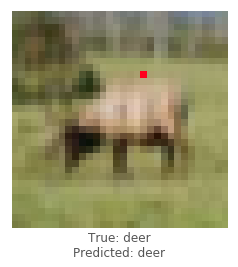

densenet - image 8646 - 336 / 1000


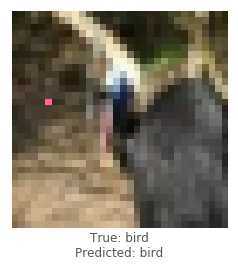

densenet - image 4047 - 337 / 1000


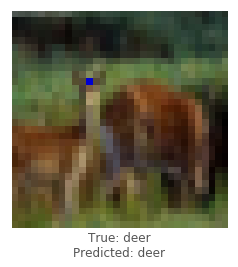

densenet - image 278 - 338 / 1000


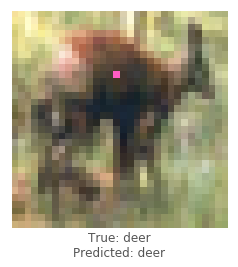

densenet - image 2038 - 339 / 1000


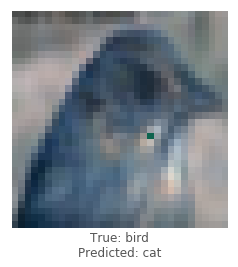

densenet - image 6060 - 340 / 1000


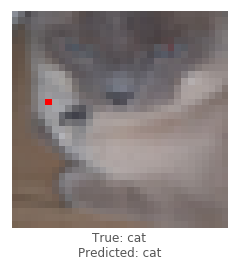

densenet - image 8863 - 341 / 1000


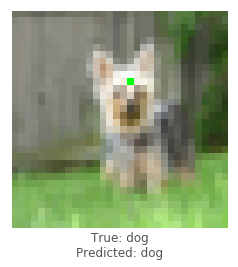

densenet - image 1709 - 342 / 1000


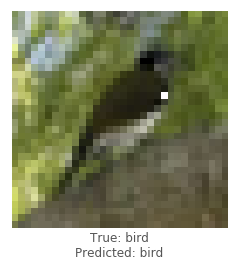

densenet - image 1650 - 343 / 1000


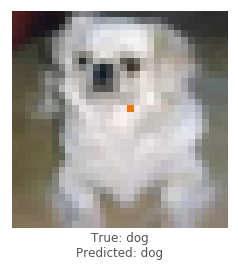

densenet - image 4881 - 344 / 1000


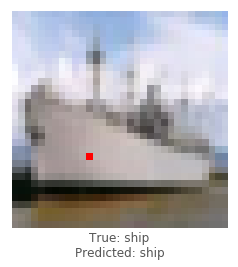

densenet - image 8903 - 345 / 1000


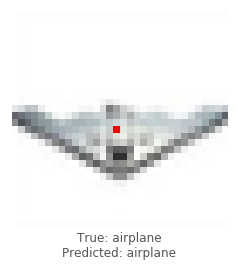

densenet - image 3996 - 346 / 1000


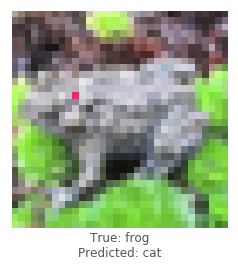

densenet - image 2569 - 347 / 1000


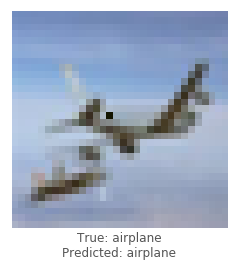

densenet - image 58 - 348 / 1000


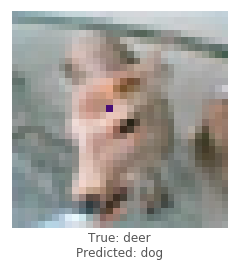

densenet - image 2669 - 349 / 1000


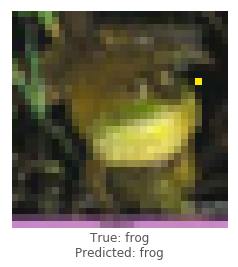

densenet - image 2616 - 350 / 1000


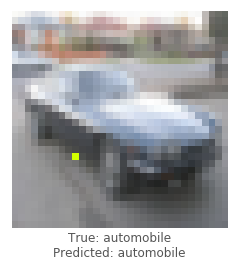

densenet - image 765 - 351 / 1000


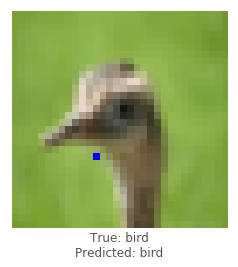

densenet - image 9048 - 352 / 1000


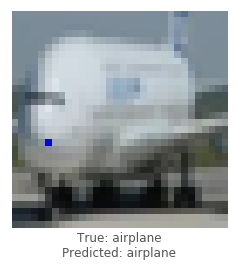

densenet - image 7317 - 353 / 1000


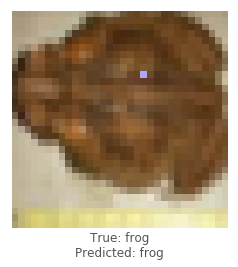

densenet - image 8237 - 354 / 1000


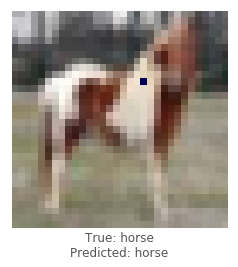

densenet - image 9143 - 355 / 1000


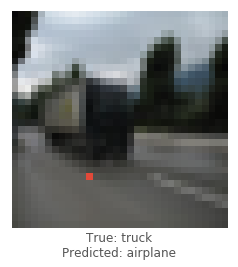

densenet - image 3781 - 356 / 1000


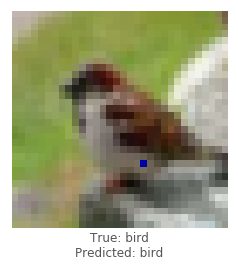

densenet - image 7998 - 357 / 1000


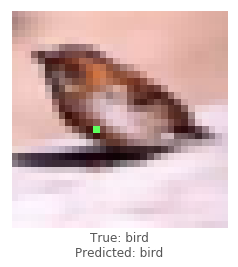

densenet - image 7712 - 358 / 1000


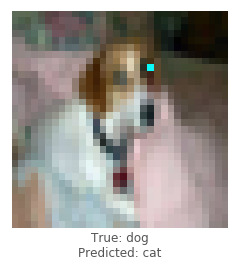

densenet - image 8169 - 359 / 1000


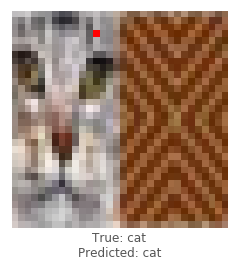

densenet - image 8658 - 360 / 1000


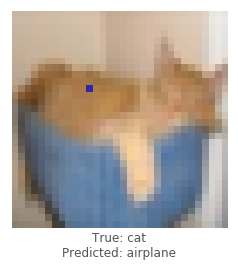

densenet - image 3218 - 361 / 1000


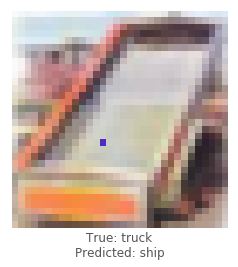

densenet - image 8333 - 362 / 1000


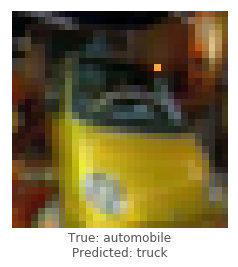

densenet - image 1175 - 363 / 1000


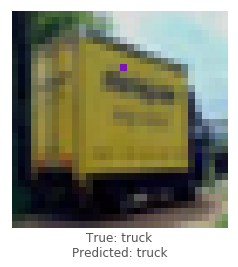

densenet - image 9276 - 364 / 1000


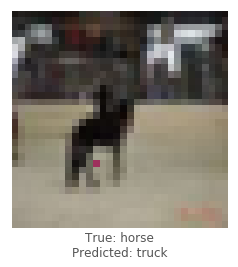

densenet - image 7512 - 365 / 1000


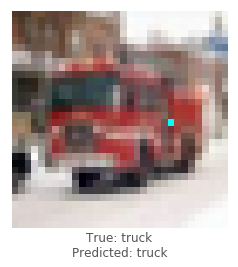

densenet - image 3087 - 366 / 1000


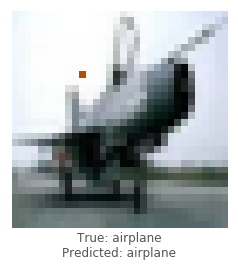

densenet - image 7491 - 367 / 1000


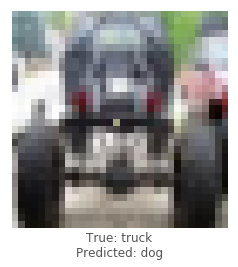

densenet - image 5939 - 368 / 1000


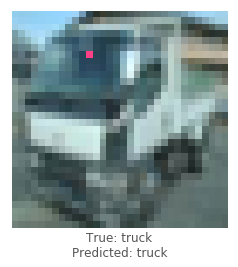

densenet - image 4174 - 369 / 1000


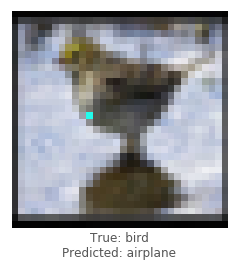

densenet - image 1029 - 370 / 1000


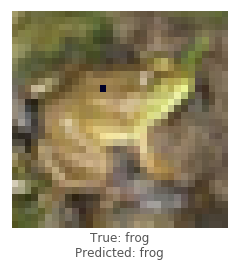

densenet - image 5023 - 371 / 1000


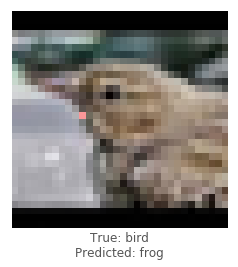

densenet - image 1978 - 372 / 1000


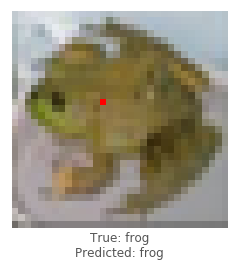

densenet - image 2656 - 373 / 1000


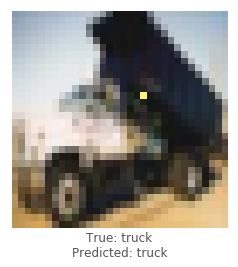

densenet - image 8346 - 374 / 1000


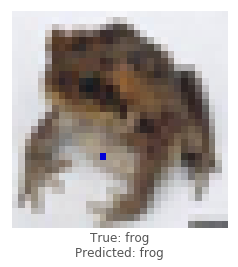

densenet - image 9822 - 375 / 1000


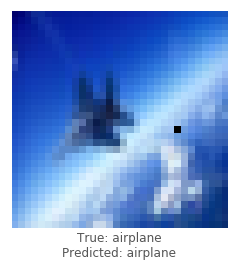

densenet - image 806 - 376 / 1000


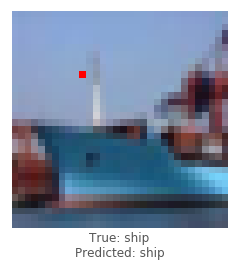

densenet - image 3083 - 377 / 1000


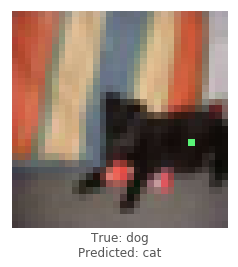

densenet - image 5131 - 378 / 1000


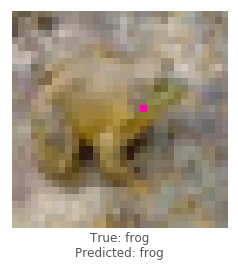

densenet - image 9400 - 379 / 1000


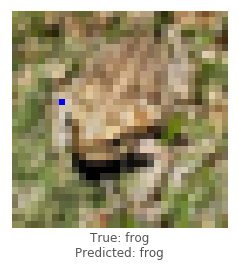

densenet - image 3177 - 380 / 1000


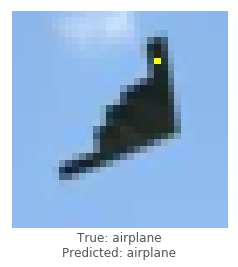

densenet - image 5547 - 381 / 1000


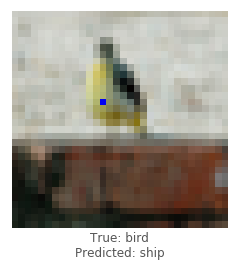

densenet - image 3375 - 382 / 1000


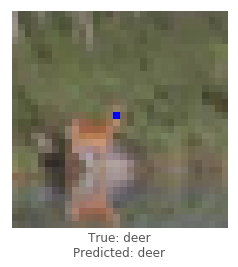

densenet - image 4741 - 383 / 1000


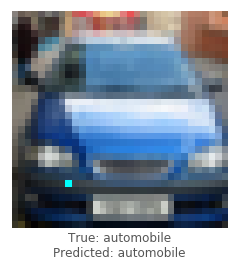

densenet - image 207 - 384 / 1000


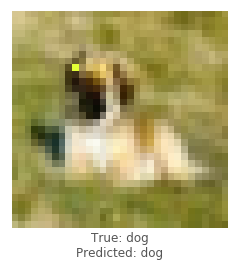

densenet - image 7151 - 385 / 1000


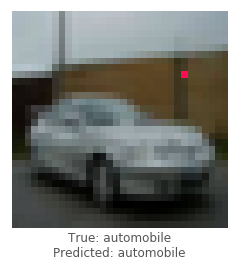

densenet - image 732 - 386 / 1000


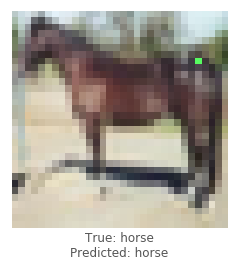

densenet - image 2671 - 387 / 1000


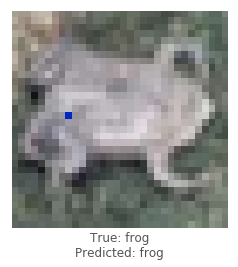

densenet - image 179 - 388 / 1000


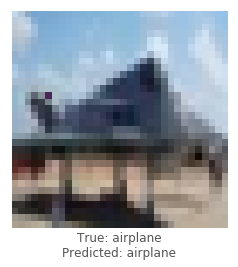

densenet - image 8383 - 389 / 1000


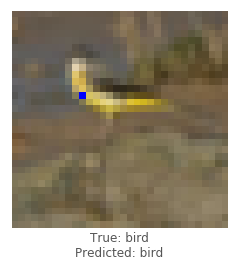

densenet - image 6355 - 390 / 1000


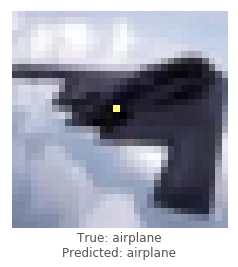

densenet - image 6017 - 391 / 1000


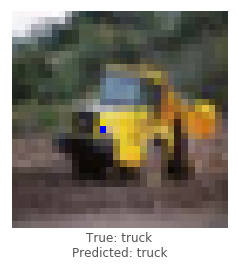

densenet - image 2073 - 392 / 1000


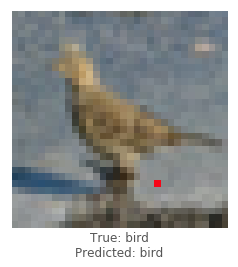

densenet - image 3321 - 393 / 1000


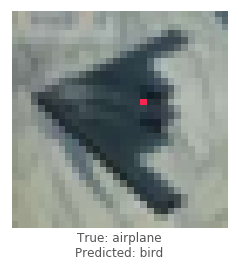

densenet - image 8122 - 394 / 1000


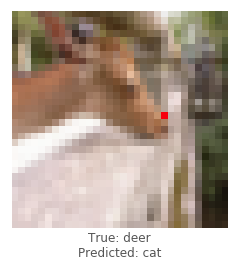

densenet - image 7147 - 395 / 1000


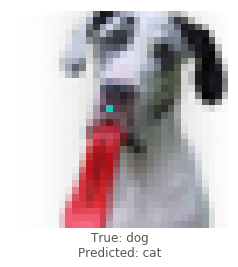

densenet - image 1311 - 396 / 1000


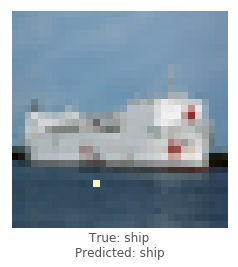

densenet - image 5482 - 397 / 1000


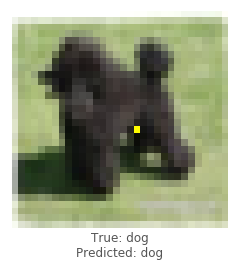

densenet - image 9215 - 398 / 1000


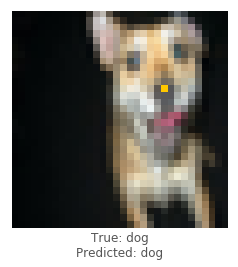

densenet - image 555 - 399 / 1000


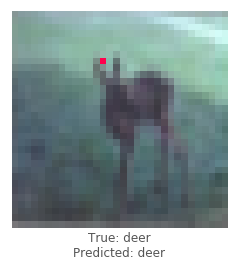

densenet - image 3171 - 400 / 1000


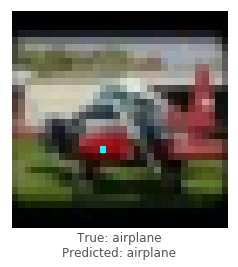

densenet - image 3335 - 401 / 1000


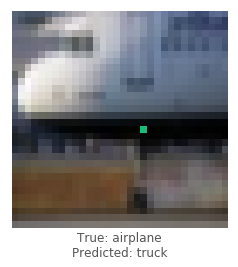

densenet - image 1960 - 402 / 1000


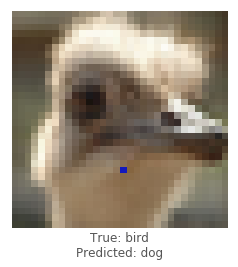

densenet - image 5099 - 403 / 1000


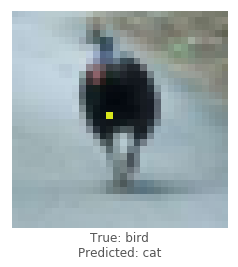

densenet - image 79 - 404 / 1000


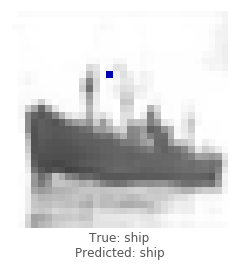

densenet - image 612 - 405 / 1000


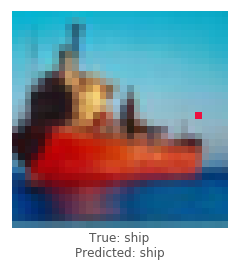

densenet - image 9698 - 406 / 1000


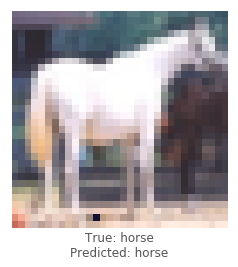

densenet - image 675 - 407 / 1000


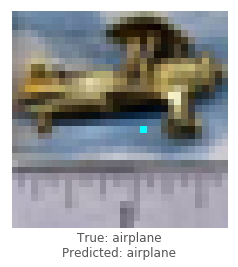

densenet - image 9502 - 408 / 1000


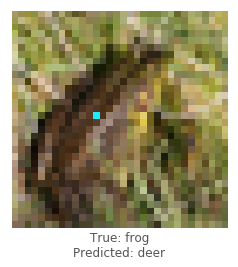

densenet - image 333 - 409 / 1000


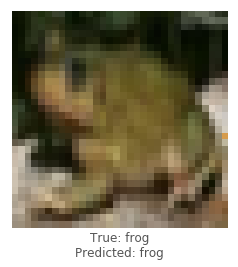

densenet - image 8763 - 410 / 1000


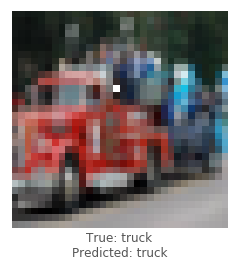

densenet - image 4971 - 411 / 1000


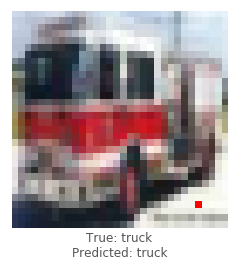

densenet - image 3941 - 412 / 1000


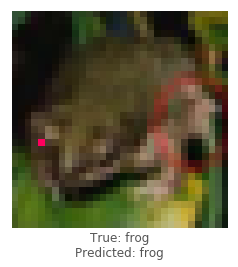

densenet - image 4019 - 413 / 1000


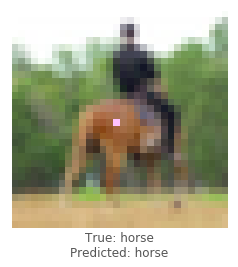

densenet - image 3960 - 414 / 1000


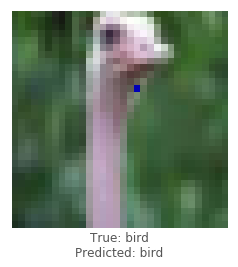

densenet - image 7426 - 415 / 1000


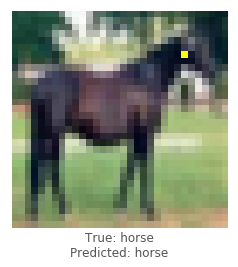

densenet - image 4312 - 416 / 1000


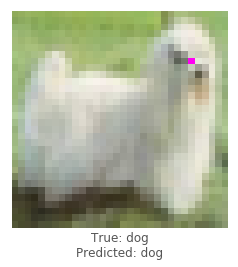

densenet - image 6274 - 417 / 1000


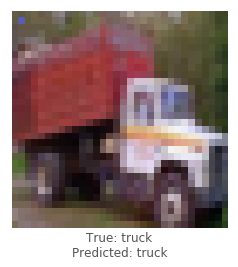

densenet - image 3181 - 418 / 1000


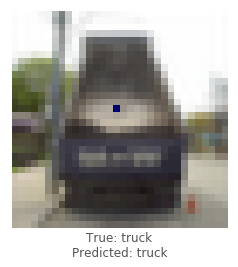

densenet - image 4193 - 419 / 1000


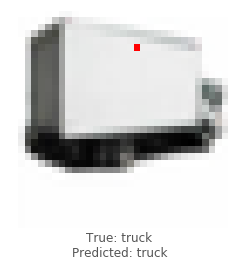

densenet - image 383 - 420 / 1000


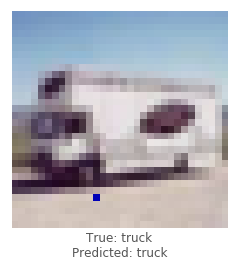

densenet - image 6714 - 421 / 1000


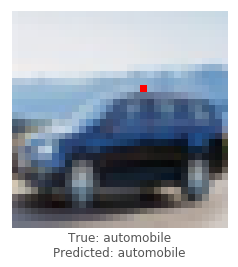

densenet - image 9820 - 422 / 1000


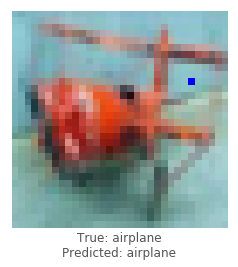

densenet - image 1719 - 423 / 1000


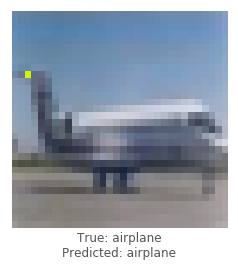

densenet - image 5029 - 424 / 1000


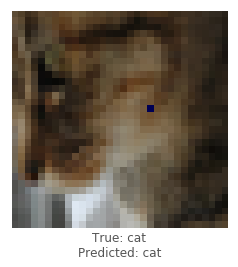

densenet - image 7816 - 425 / 1000


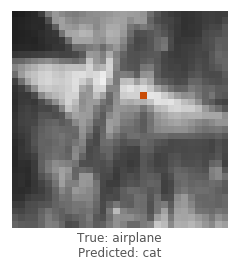

densenet - image 8802 - 426 / 1000


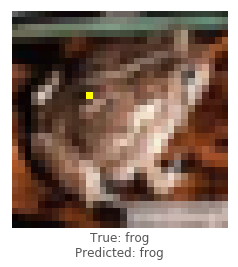

densenet - image 9622 - 427 / 1000


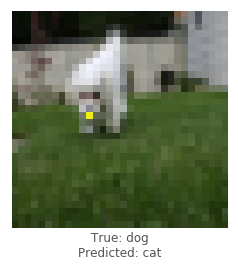

densenet - image 2722 - 428 / 1000


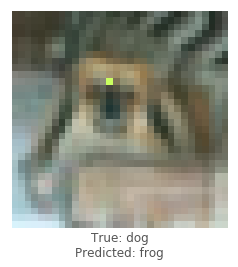

densenet - image 2472 - 429 / 1000


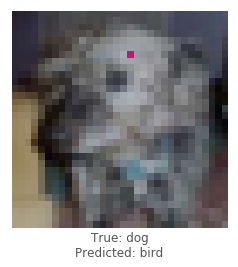

densenet - image 5941 - 430 / 1000


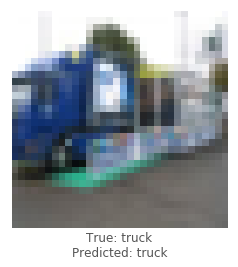

densenet - image 9864 - 431 / 1000


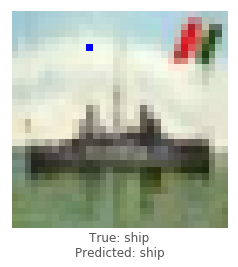

densenet - image 4084 - 432 / 1000


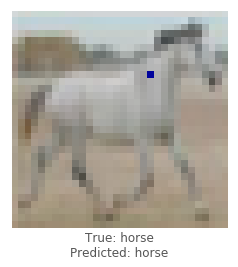

densenet - image 6454 - 433 / 1000


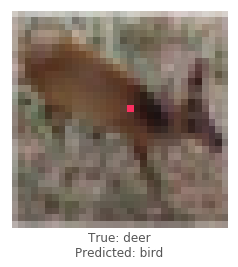

densenet - image 1260 - 434 / 1000


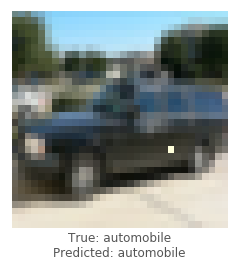

densenet - image 5161 - 435 / 1000


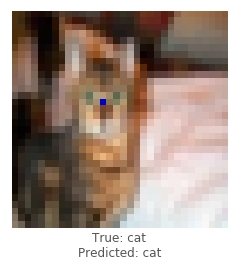

densenet - image 1593 - 436 / 1000


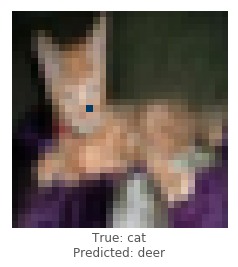

densenet - image 5929 - 437 / 1000


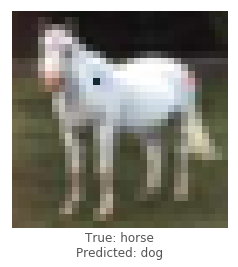

densenet - image 8442 - 438 / 1000


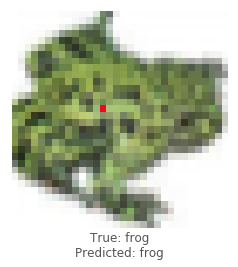

densenet - image 3810 - 439 / 1000


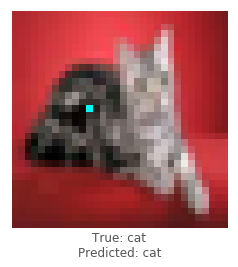

densenet - image 7008 - 440 / 1000


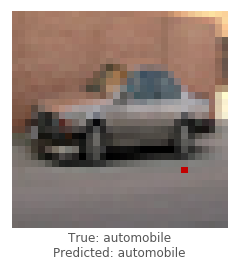

densenet - image 2053 - 441 / 1000


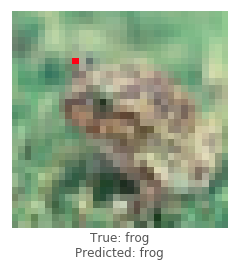

densenet - image 6732 - 442 / 1000


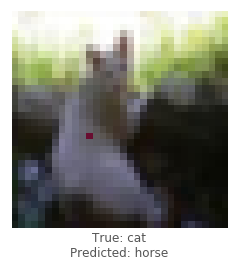

densenet - image 3053 - 443 / 1000


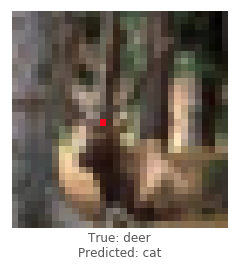

densenet - image 7237 - 444 / 1000


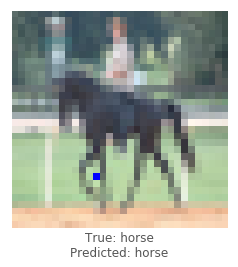

densenet - image 6804 - 445 / 1000


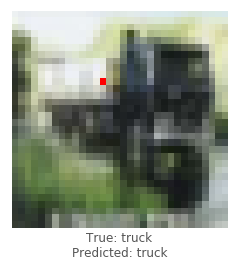

densenet - image 9313 - 446 / 1000


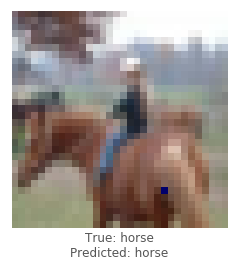

densenet - image 1416 - 447 / 1000


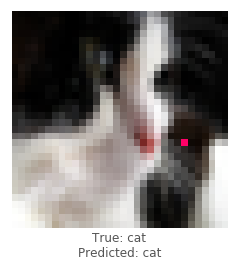

densenet - image 509 - 448 / 1000


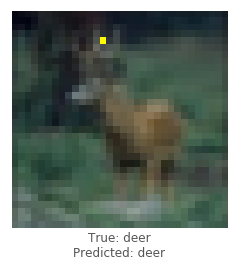

densenet - image 3149 - 449 / 1000


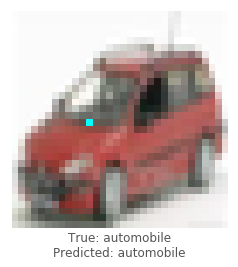

densenet - image 2319 - 450 / 1000


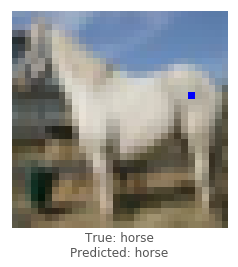

densenet - image 2887 - 451 / 1000


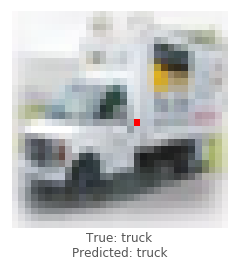

densenet - image 6752 - 452 / 1000


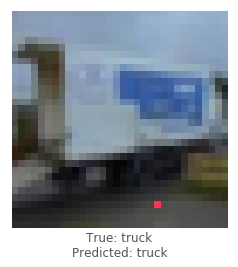

densenet - image 2832 - 453 / 1000


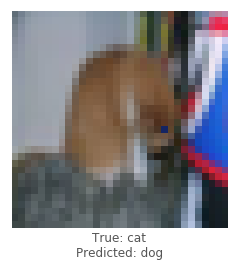

densenet - image 3990 - 454 / 1000


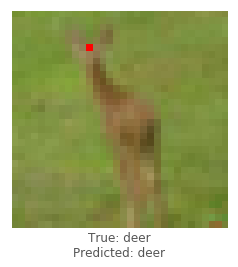

densenet - image 3413 - 455 / 1000


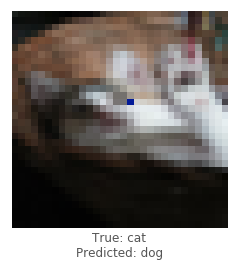

densenet - image 9579 - 456 / 1000


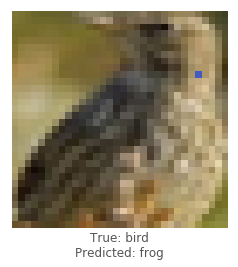

densenet - image 513 - 457 / 1000


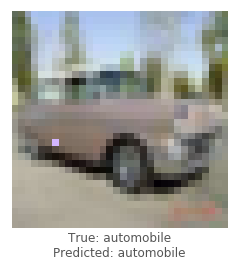

densenet - image 8824 - 458 / 1000


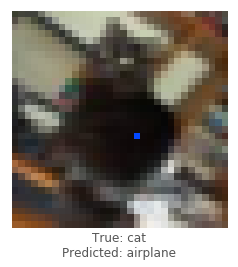

densenet - image 6970 - 459 / 1000


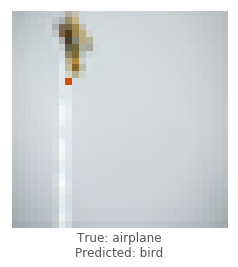

densenet - image 1505 - 460 / 1000


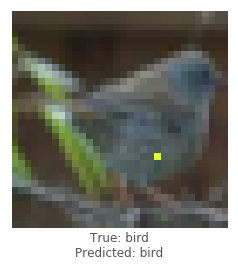

densenet - image 9157 - 461 / 1000


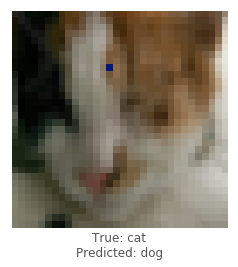

densenet - image 1594 - 462 / 1000


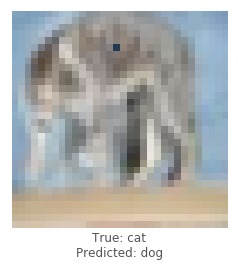

densenet - image 5660 - 463 / 1000


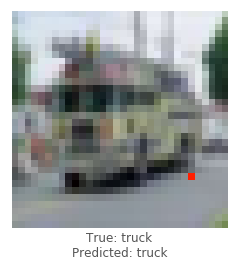

densenet - image 4476 - 464 / 1000


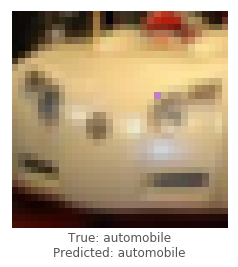

densenet - image 788 - 465 / 1000


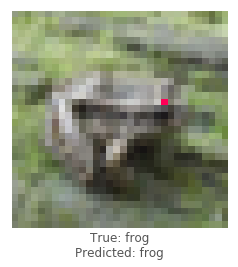

densenet - image 7382 - 466 / 1000


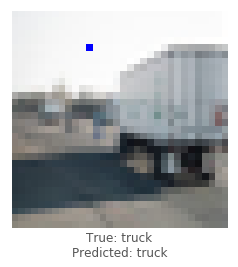

densenet - image 3049 - 467 / 1000


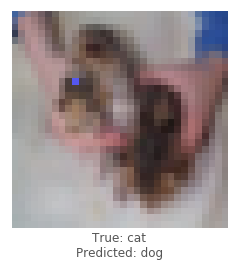

densenet - image 5392 - 468 / 1000


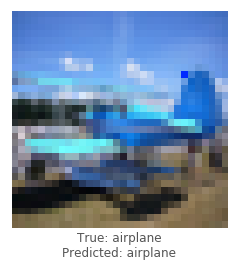

densenet - image 1308 - 469 / 1000


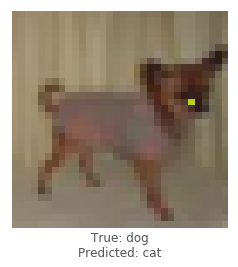

densenet - image 2812 - 470 / 1000


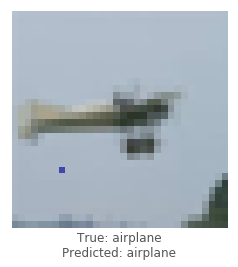

densenet - image 4664 - 471 / 1000


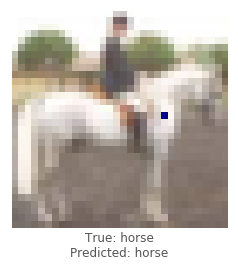

densenet - image 9728 - 472 / 1000


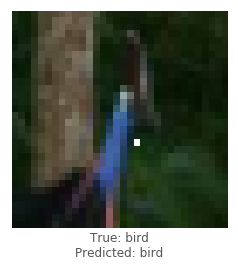

densenet - image 2445 - 473 / 1000


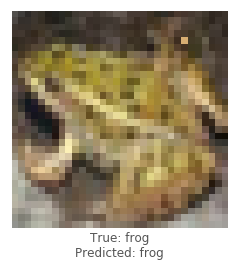

densenet - image 6982 - 474 / 1000


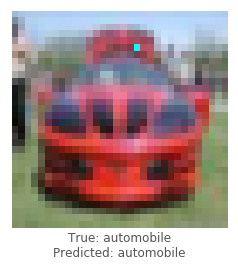

densenet - image 1688 - 475 / 1000


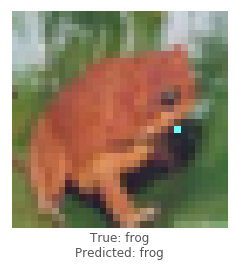

densenet - image 6032 - 476 / 1000


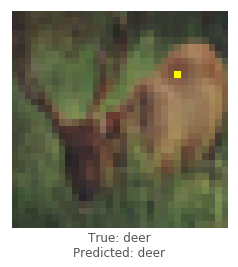

densenet - image 2107 - 477 / 1000


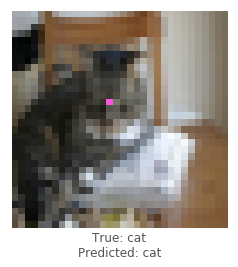

densenet - image 7261 - 478 / 1000


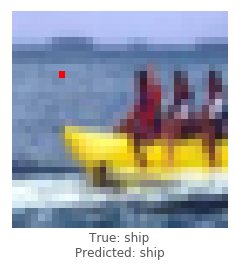

densenet - image 5146 - 479 / 1000


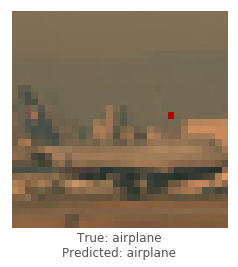

densenet - image 1888 - 480 / 1000


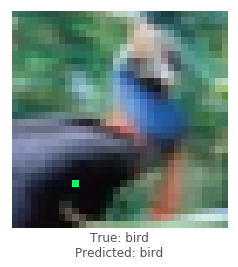

densenet - image 4969 - 481 / 1000


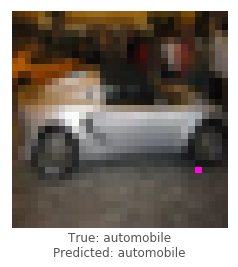

densenet - image 8260 - 482 / 1000


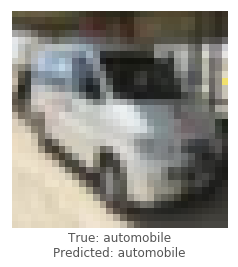

densenet - image 6585 - 483 / 1000


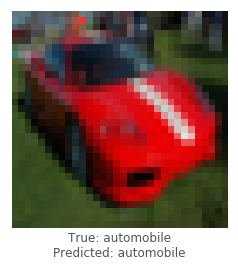

densenet - image 9971 - 484 / 1000


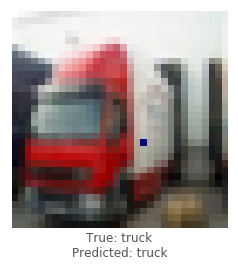

densenet - image 9888 - 485 / 1000


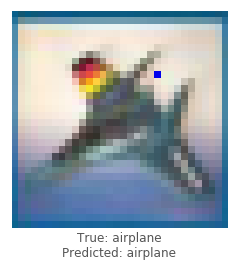

densenet - image 9393 - 486 / 1000


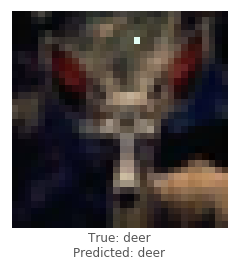

densenet - image 7495 - 487 / 1000


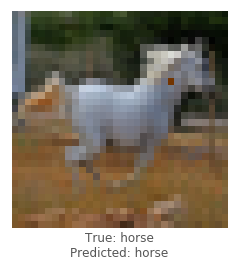

densenet - image 8884 - 488 / 1000


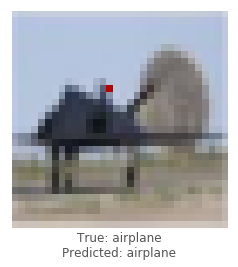

densenet - image 9396 - 489 / 1000


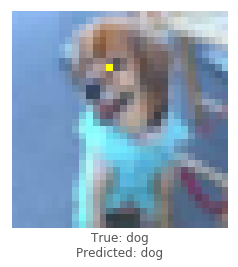

densenet - image 574 - 490 / 1000


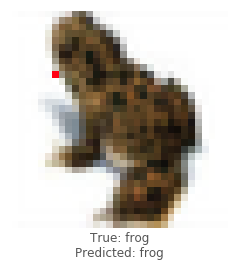

densenet - image 969 - 491 / 1000


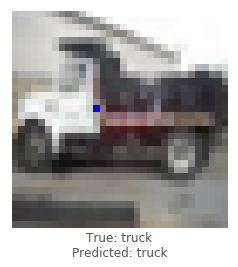

densenet - image 9797 - 492 / 1000


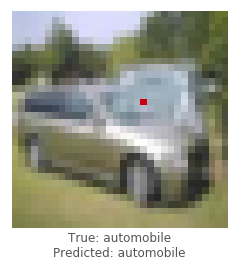

densenet - image 5175 - 493 / 1000


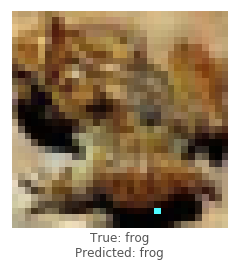

densenet - image 3935 - 494 / 1000


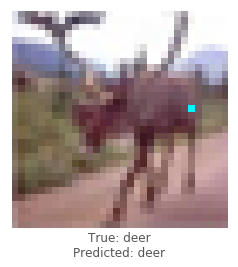

densenet - image 8856 - 495 / 1000


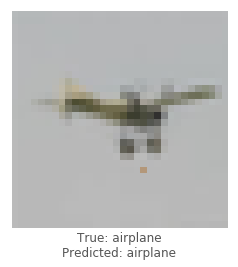

densenet - image 5508 - 496 / 1000


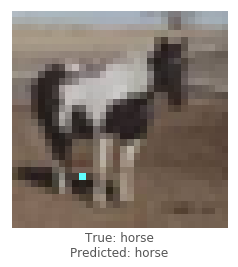

densenet - image 7716 - 497 / 1000


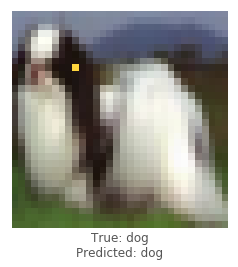

densenet - image 7871 - 498 / 1000


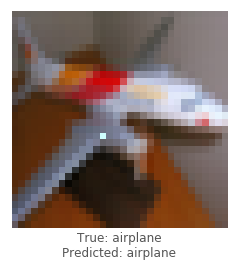

densenet - image 8452 - 499 / 1000


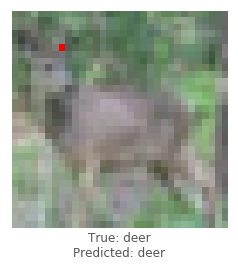

densenet - image 6616 - 500 / 1000


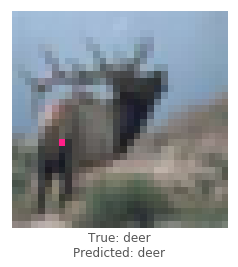

densenet - image 1406 - 501 / 1000


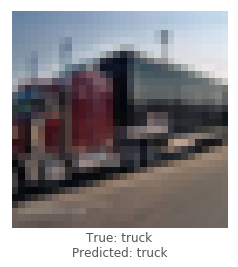

densenet - image 9663 - 502 / 1000


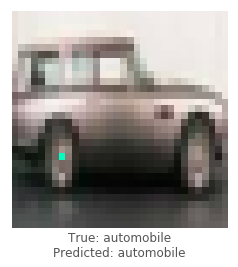

densenet - image 286 - 503 / 1000


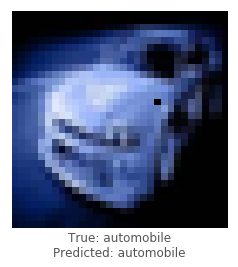

densenet - image 2567 - 504 / 1000


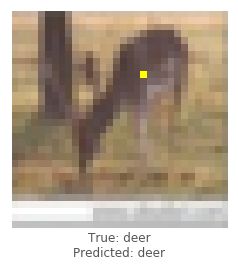

densenet - image 8017 - 505 / 1000


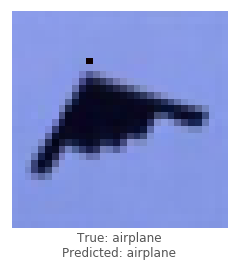

densenet - image 8127 - 506 / 1000


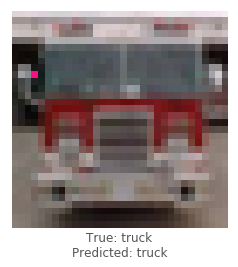

densenet - image 6904 - 507 / 1000


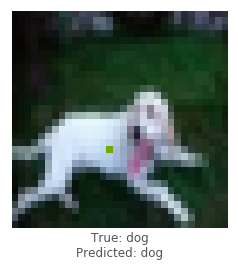

densenet - image 2012 - 508 / 1000


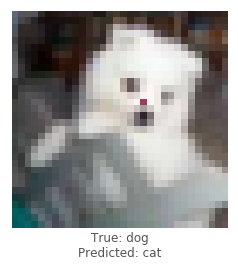

densenet - image 4874 - 509 / 1000


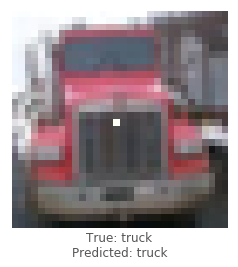

densenet - image 8813 - 510 / 1000


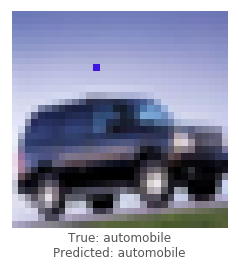

densenet - image 6285 - 511 / 1000


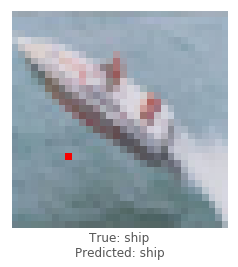

densenet - image 8100 - 512 / 1000


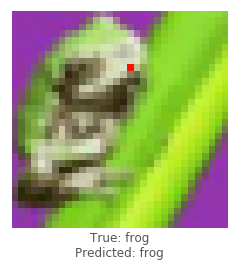

densenet - image 7714 - 513 / 1000


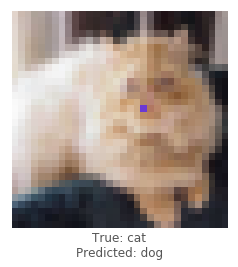

densenet - image 1952 - 514 / 1000


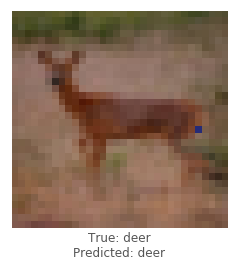

densenet - image 7860 - 515 / 1000


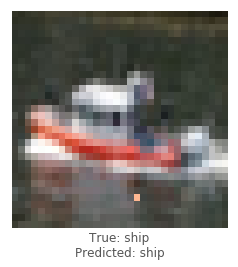

densenet - image 2811 - 516 / 1000


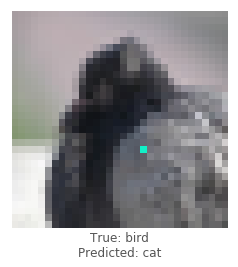

densenet - image 8774 - 517 / 1000


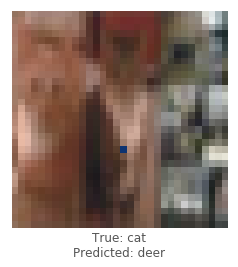

densenet - image 6380 - 518 / 1000


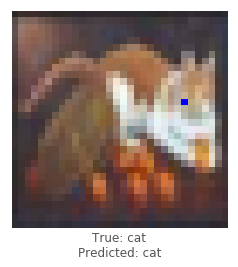

densenet - image 6932 - 519 / 1000


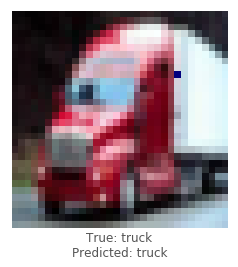

densenet - image 8801 - 520 / 1000


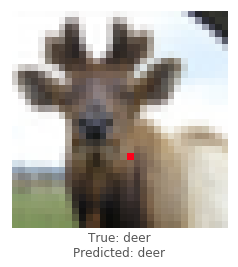

densenet - image 9221 - 521 / 1000


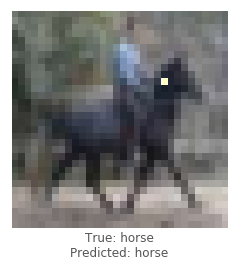

densenet - image 4128 - 522 / 1000


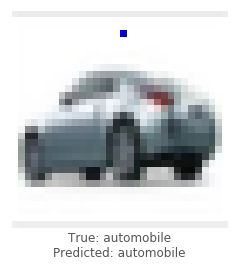

densenet - image 6731 - 523 / 1000


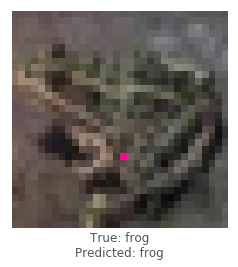

densenet - image 2685 - 524 / 1000


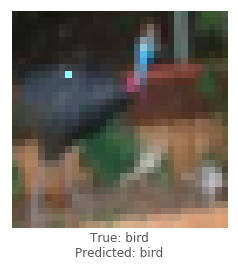

densenet - image 2231 - 525 / 1000


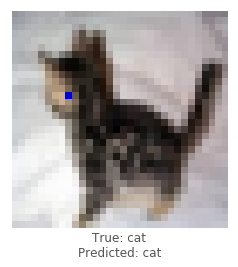

densenet - image 7778 - 526 / 1000


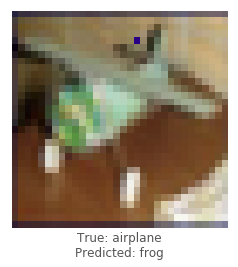

densenet - image 7950 - 527 / 1000


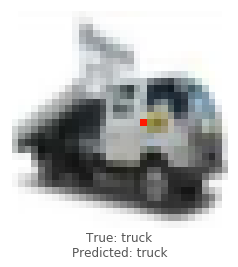

densenet - image 9223 - 528 / 1000


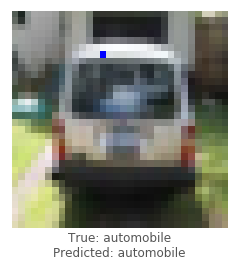

densenet - image 6406 - 529 / 1000


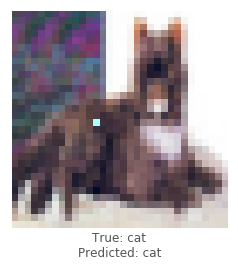

densenet - image 7511 - 530 / 1000


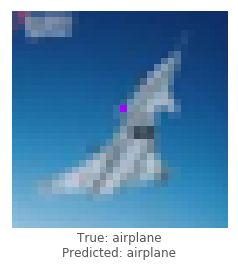

densenet - image 8436 - 531 / 1000


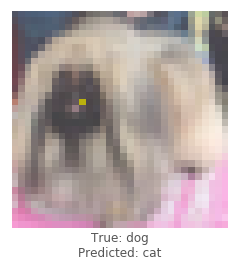

densenet - image 2076 - 532 / 1000


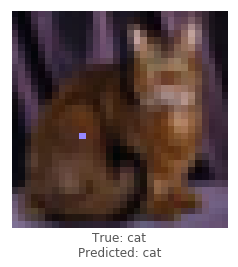

densenet - image 7503 - 533 / 1000


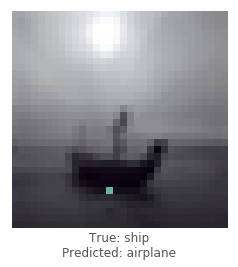

densenet - image 7180 - 534 / 1000


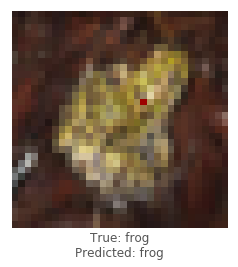

densenet - image 6361 - 535 / 1000


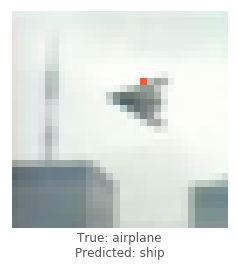

densenet - image 22 - 536 / 1000


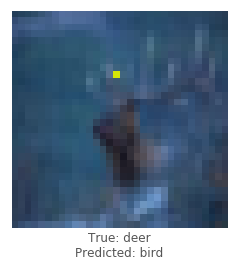

densenet - image 8839 - 537 / 1000


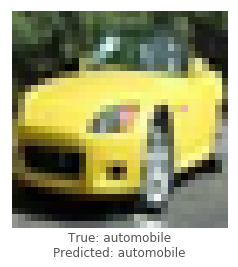

densenet - image 2163 - 538 / 1000


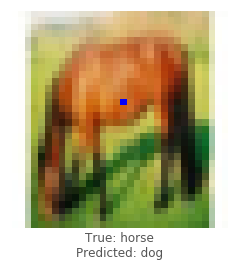

densenet - image 586 - 539 / 1000


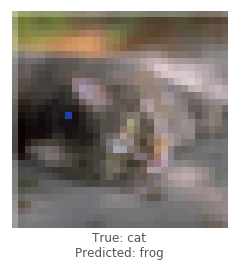

densenet - image 196 - 540 / 1000


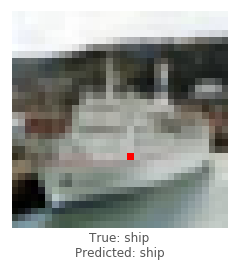

densenet - image 5955 - 541 / 1000


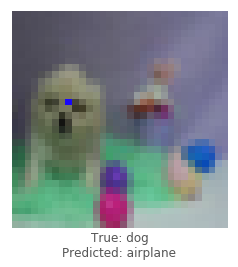

densenet - image 9045 - 542 / 1000


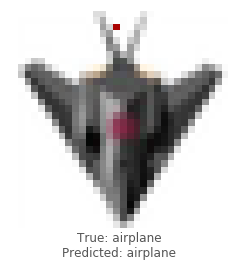

densenet - image 3127 - 543 / 1000


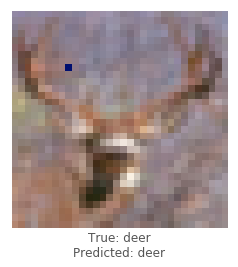

densenet - image 6499 - 544 / 1000


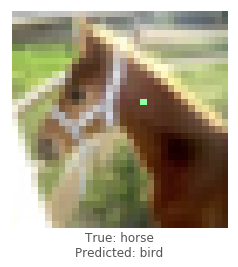

densenet - image 6993 - 545 / 1000


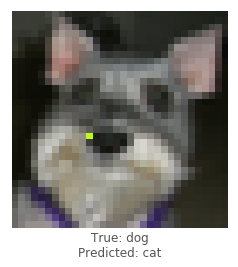

densenet - image 4315 - 546 / 1000


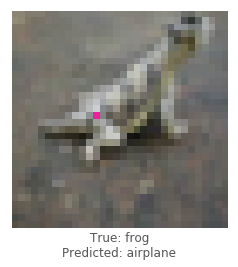

densenet - image 7472 - 547 / 1000


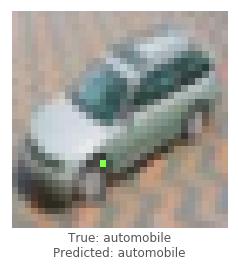

densenet - image 1312 - 548 / 1000


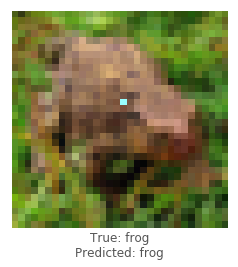

densenet - image 6116 - 549 / 1000


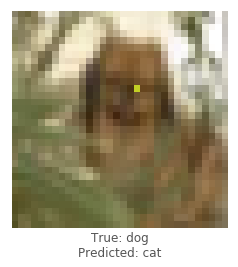

densenet - image 9898 - 550 / 1000


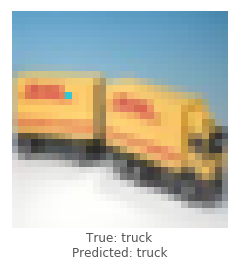

densenet - image 6445 - 551 / 1000


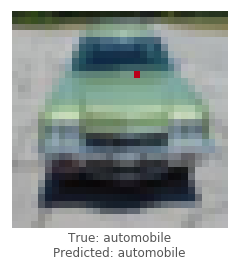

densenet - image 1916 - 552 / 1000


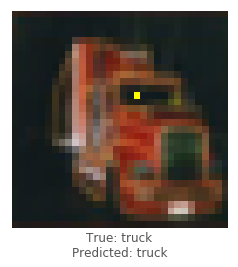

densenet - image 6983 - 553 / 1000


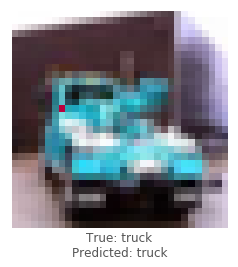

densenet - image 1386 - 554 / 1000


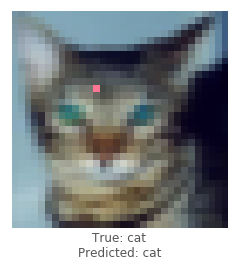

densenet - image 49 - 555 / 1000


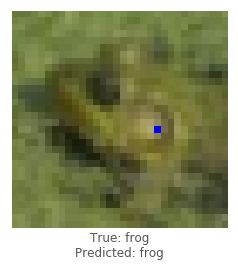

densenet - image 8189 - 556 / 1000


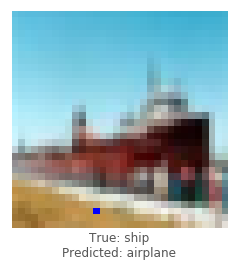

densenet - image 9468 - 557 / 1000


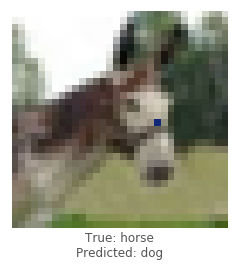

densenet - image 4253 - 558 / 1000


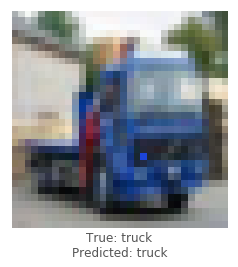

densenet - image 8340 - 559 / 1000


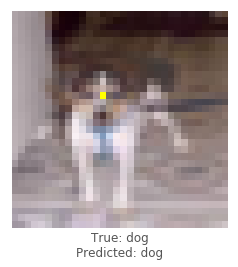

densenet - image 8602 - 560 / 1000


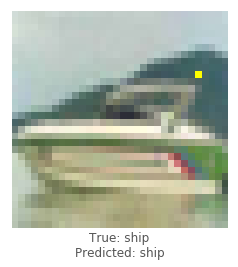

densenet - image 3987 - 561 / 1000


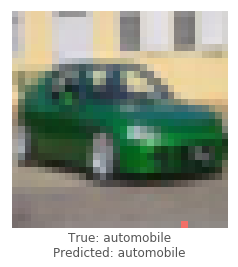

densenet - image 8061 - 562 / 1000


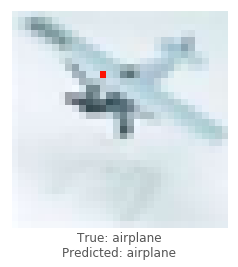

densenet - image 2945 - 563 / 1000


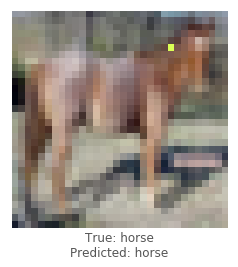

densenet - image 8946 - 564 / 1000


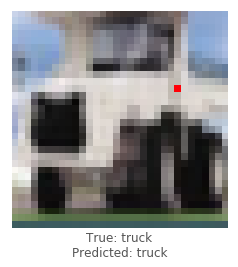

densenet - image 5998 - 565 / 1000


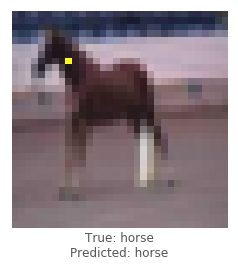

densenet - image 6597 - 566 / 1000


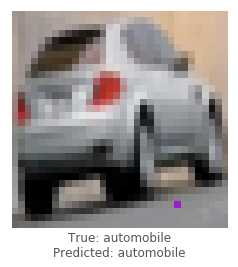

densenet - image 3812 - 567 / 1000


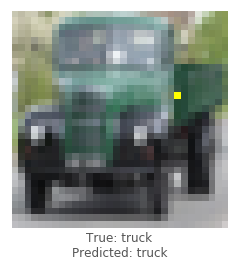

densenet - image 9161 - 568 / 1000


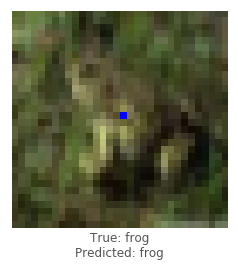

densenet - image 4039 - 569 / 1000


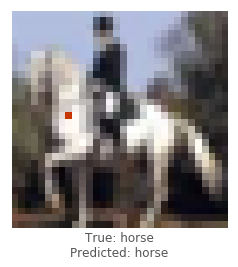

densenet - image 7726 - 570 / 1000


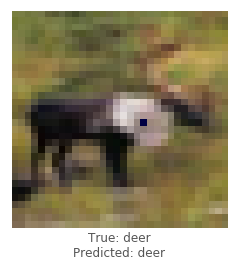

densenet - image 5062 - 571 / 1000


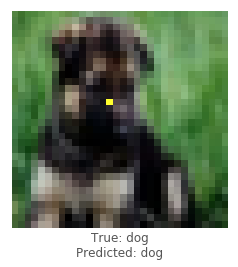

densenet - image 64 - 572 / 1000


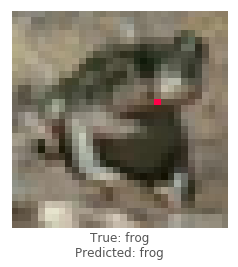

densenet - image 69 - 573 / 1000


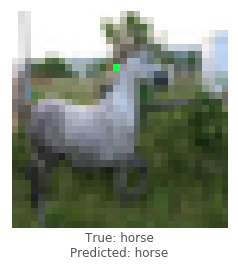

densenet - image 9634 - 574 / 1000


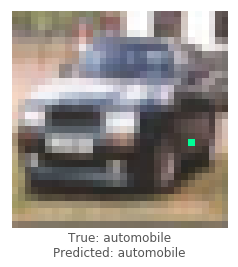

densenet - image 5368 - 575 / 1000


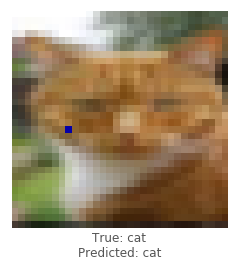

densenet - image 4516 - 576 / 1000


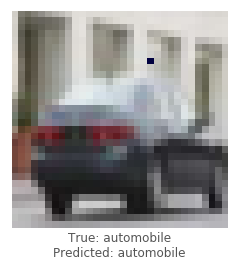

densenet - image 4939 - 577 / 1000


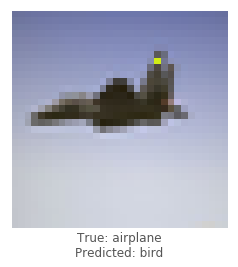

densenet - image 2564 - 578 / 1000


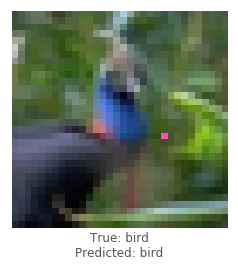

densenet - image 3230 - 579 / 1000


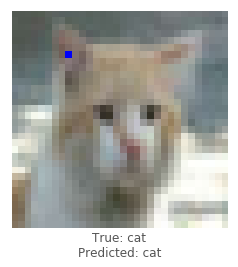

densenet - image 8404 - 580 / 1000


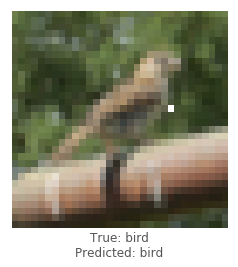

densenet - image 7534 - 581 / 1000


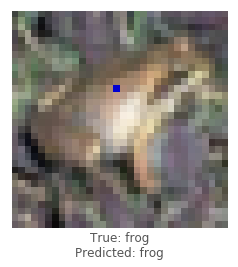

densenet - image 1906 - 582 / 1000


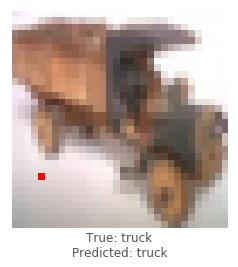

densenet - image 4886 - 583 / 1000


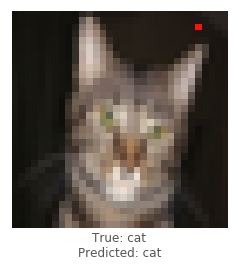

densenet - image 8103 - 584 / 1000


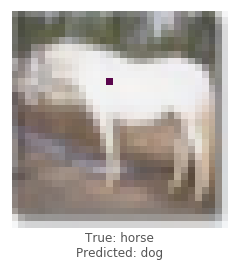

densenet - image 2681 - 585 / 1000


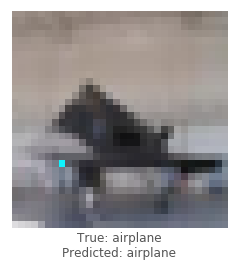

densenet - image 755 - 586 / 1000


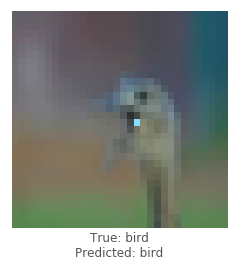

densenet - image 1857 - 587 / 1000


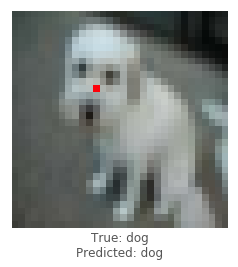

densenet - image 3646 - 588 / 1000


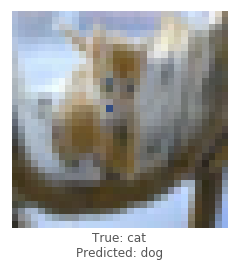

densenet - image 465 - 589 / 1000


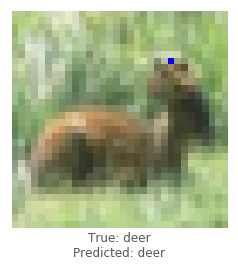

densenet - image 2972 - 590 / 1000


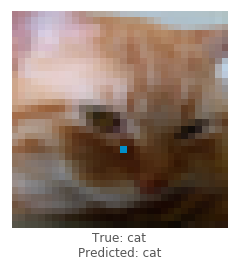

densenet - image 2711 - 591 / 1000


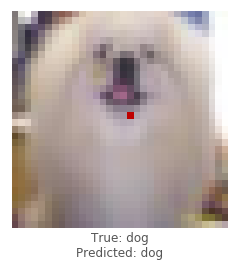

densenet - image 8544 - 592 / 1000


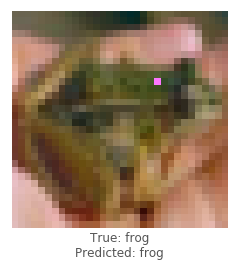

densenet - image 9128 - 593 / 1000


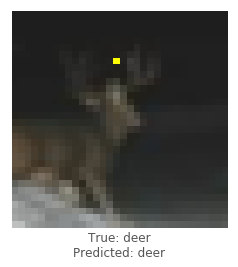

densenet - image 5303 - 594 / 1000


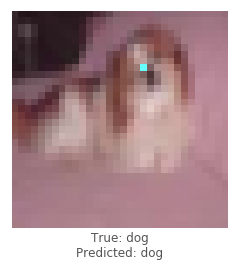

densenet - image 3322 - 595 / 1000


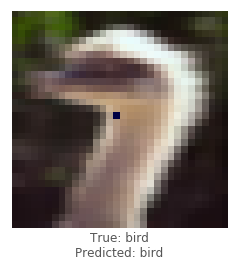

densenet - image 9466 - 596 / 1000


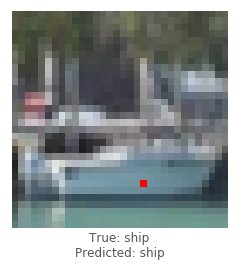

densenet - image 987 - 597 / 1000


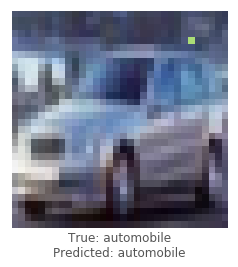

densenet - image 4217 - 598 / 1000


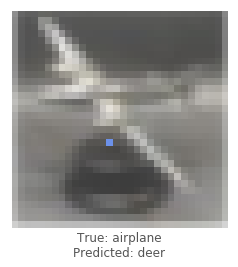

densenet - image 542 - 599 / 1000


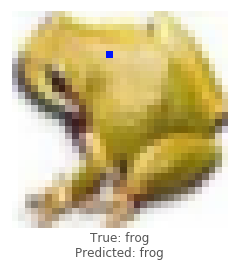

densenet - image 9164 - 600 / 1000


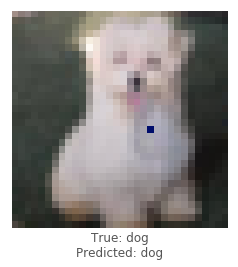

densenet - image 7073 - 601 / 1000


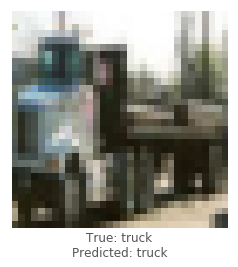

densenet - image 228 - 602 / 1000


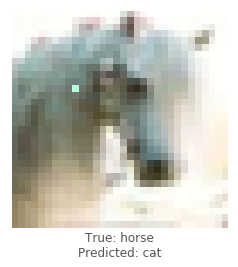

densenet - image 4658 - 603 / 1000


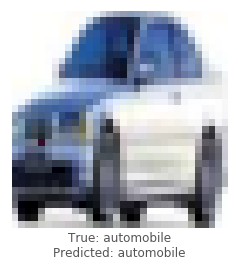

densenet - image 1833 - 604 / 1000


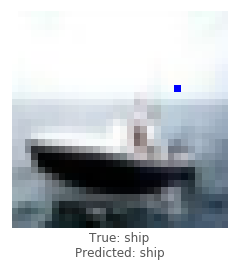

densenet - image 9022 - 605 / 1000


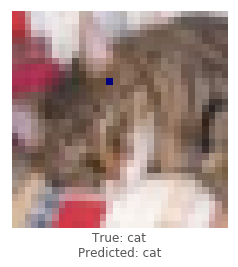

densenet - image 889 - 606 / 1000


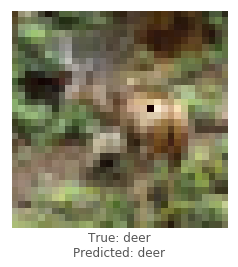

densenet - image 1632 - 607 / 1000


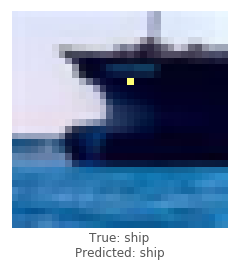

densenet - image 5914 - 608 / 1000


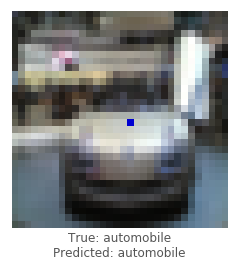

densenet - image 1928 - 609 / 1000


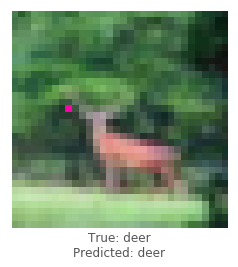

densenet - image 6737 - 610 / 1000


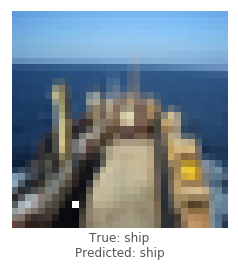

densenet - image 9234 - 611 / 1000


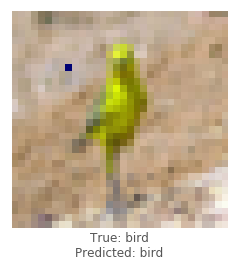

densenet - image 6675 - 612 / 1000


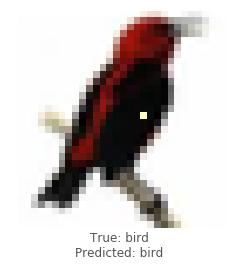

densenet - image 8933 - 613 / 1000


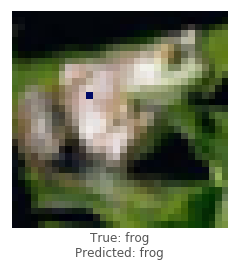

densenet - image 5473 - 614 / 1000


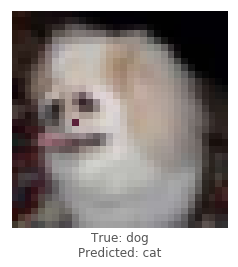

densenet - image 1571 - 615 / 1000


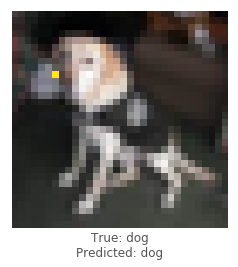

densenet - image 817 - 616 / 1000


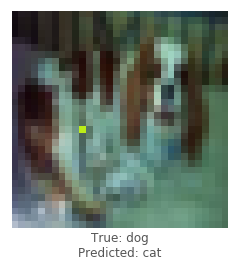

densenet - image 6779 - 617 / 1000


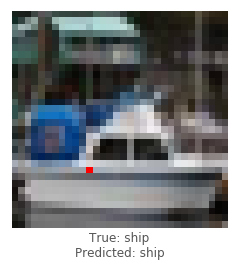

densenet - image 4050 - 618 / 1000


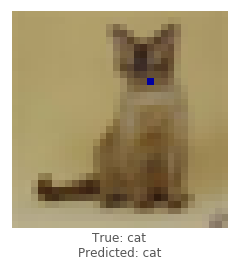

densenet - image 4553 - 619 / 1000


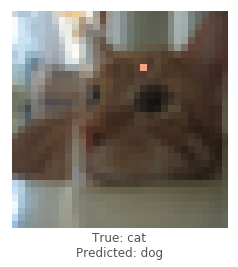

densenet - image 9594 - 620 / 1000


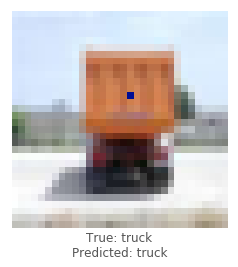

densenet - image 1630 - 621 / 1000


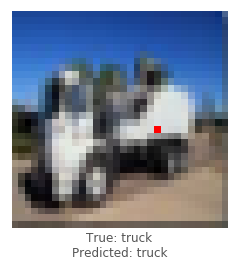

densenet - image 8771 - 622 / 1000


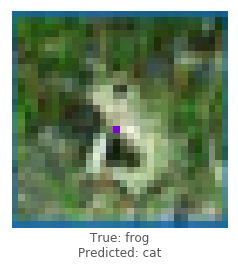

densenet - image 7482 - 623 / 1000


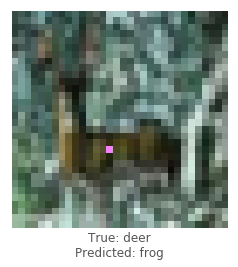

densenet - image 8632 - 624 / 1000


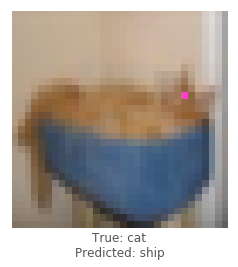

densenet - image 2650 - 625 / 1000


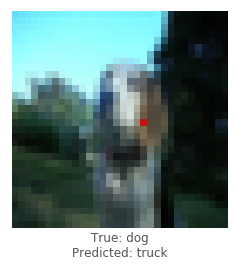

densenet - image 7986 - 626 / 1000


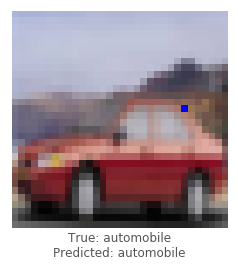

densenet - image 999 - 627 / 1000


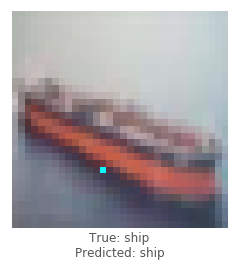

densenet - image 7365 - 628 / 1000


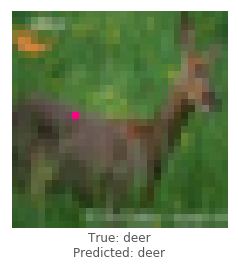

densenet - image 2501 - 629 / 1000


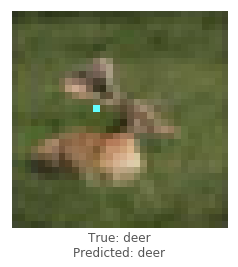

densenet - image 5919 - 630 / 1000


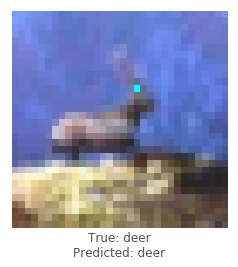

densenet - image 8213 - 631 / 1000


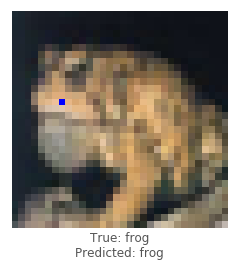

densenet - image 9922 - 632 / 1000


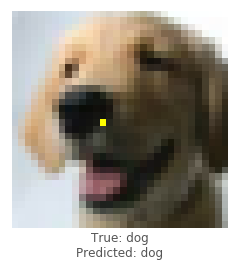

densenet - image 6607 - 633 / 1000


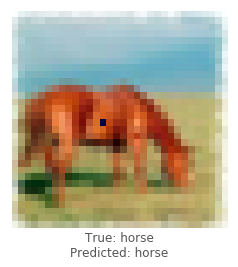

densenet - image 2691 - 634 / 1000


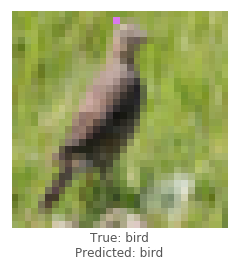

densenet - image 7938 - 635 / 1000


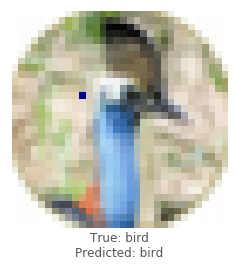

densenet - image 6760 - 636 / 1000


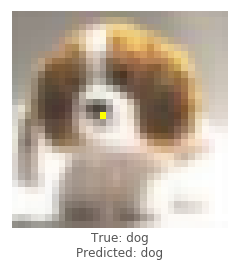

densenet - image 5852 - 637 / 1000


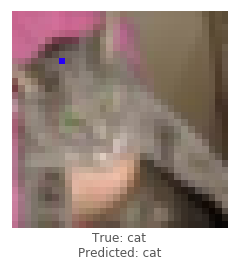

densenet - image 62 - 638 / 1000


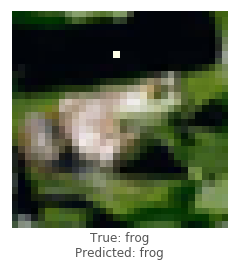

densenet - image 2097 - 639 / 1000


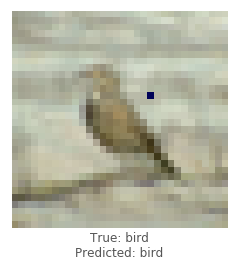

densenet - image 128 - 640 / 1000


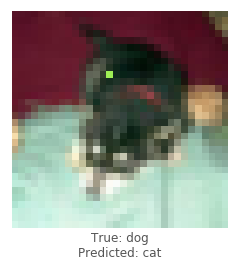

densenet - image 698 - 641 / 1000


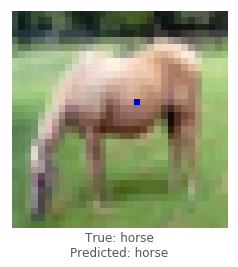

densenet - image 3406 - 642 / 1000


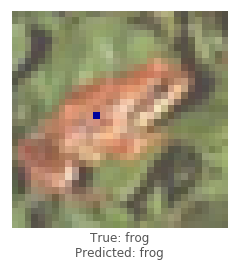

densenet - image 5589 - 643 / 1000


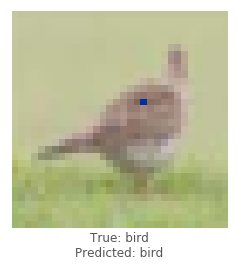

densenet - image 3586 - 644 / 1000


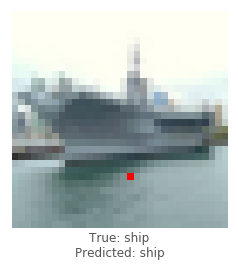

densenet - image 8301 - 645 / 1000


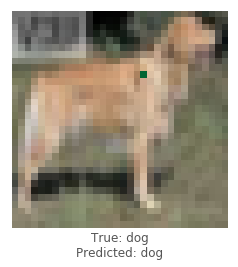

densenet - image 3788 - 646 / 1000


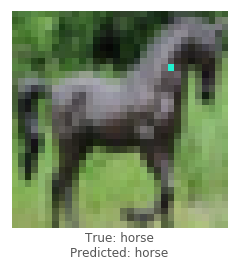

densenet - image 1528 - 647 / 1000


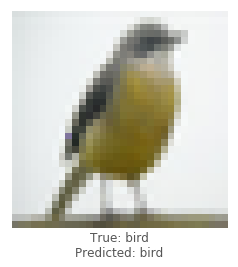

densenet - image 7203 - 648 / 1000


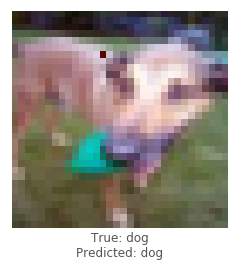

densenet - image 4759 - 649 / 1000


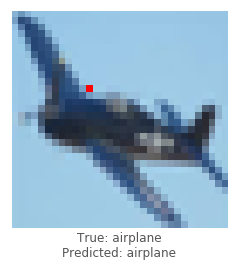

densenet - image 8207 - 650 / 1000


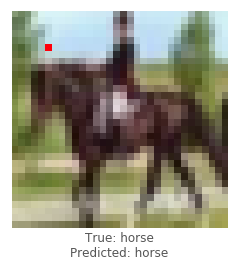

densenet - image 1202 - 651 / 1000


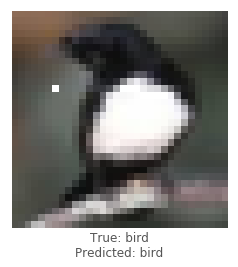

densenet - image 874 - 652 / 1000


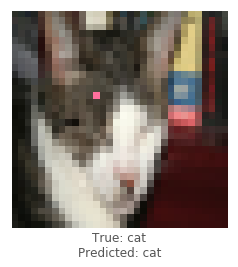

densenet - image 6422 - 653 / 1000


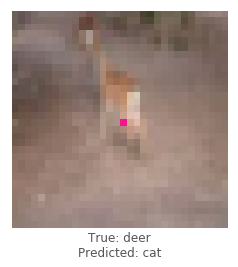

densenet - image 9986 - 654 / 1000


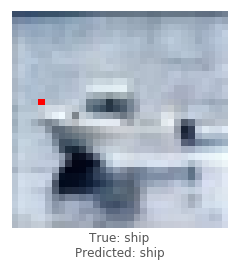

densenet - image 5498 - 655 / 1000


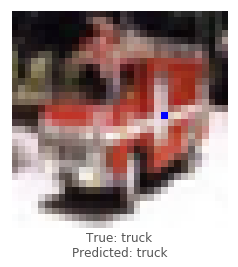

densenet - image 9842 - 656 / 1000


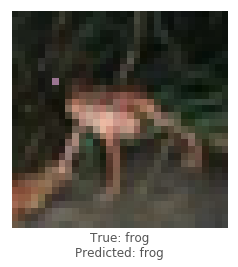

densenet - image 4984 - 657 / 1000


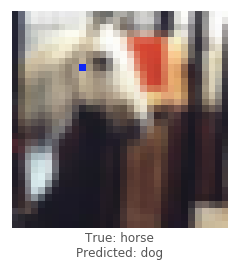

densenet - image 709 - 658 / 1000


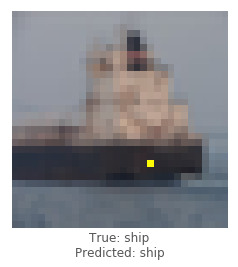

densenet - image 1003 - 659 / 1000


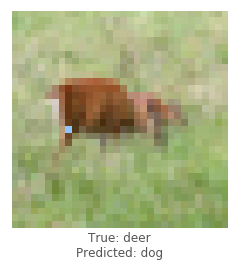

densenet - image 5714 - 660 / 1000


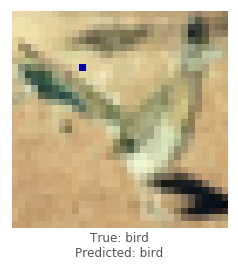

densenet - image 2557 - 661 / 1000


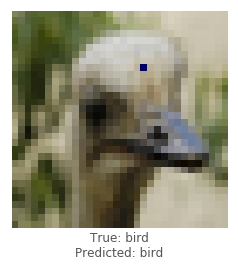

densenet - image 9597 - 662 / 1000


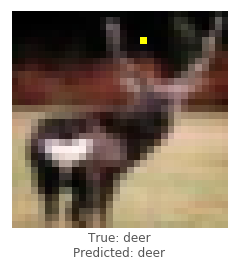

densenet - image 6177 - 663 / 1000


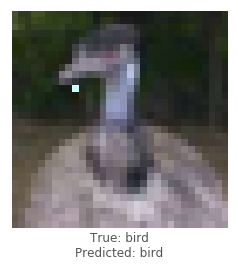

densenet - image 4716 - 664 / 1000


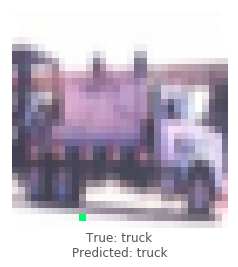

densenet - image 3508 - 665 / 1000


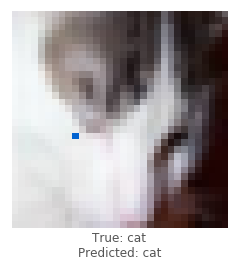

densenet - image 4179 - 666 / 1000


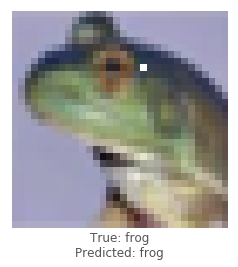

densenet - image 3159 - 667 / 1000


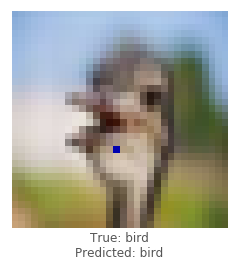

densenet - image 1873 - 668 / 1000


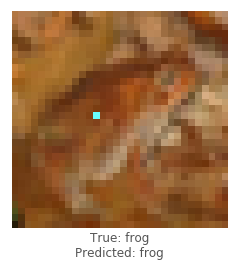

densenet - image 9834 - 669 / 1000


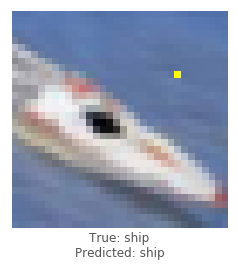

densenet - image 9934 - 670 / 1000


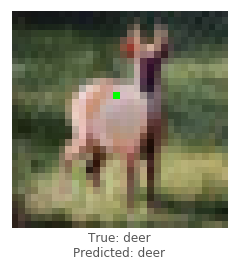

densenet - image 9755 - 671 / 1000


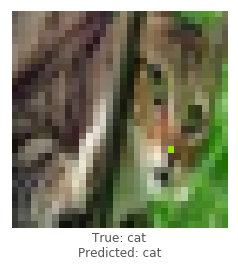

densenet - image 7383 - 672 / 1000


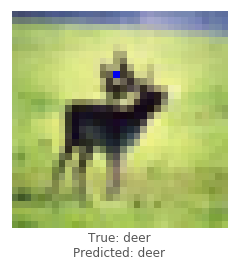

densenet - image 6427 - 673 / 1000


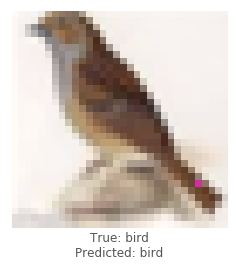

densenet - image 573 - 674 / 1000


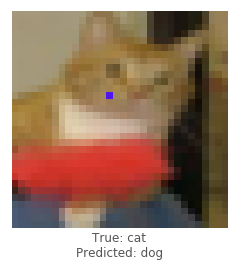

densenet - image 8746 - 675 / 1000


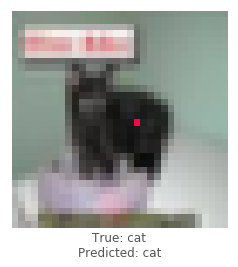

densenet - image 3091 - 676 / 1000


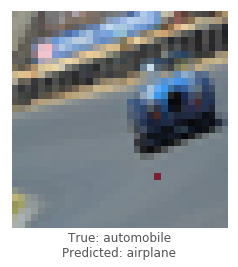

densenet - image 3060 - 677 / 1000


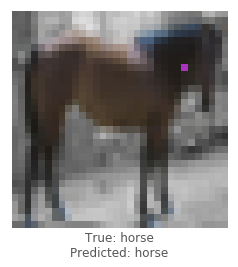

densenet - image 6666 - 678 / 1000


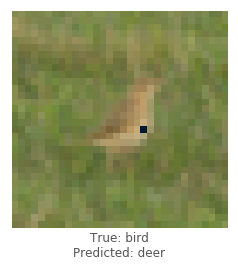

densenet - image 3344 - 679 / 1000


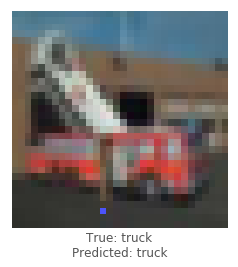

densenet - image 5032 - 680 / 1000


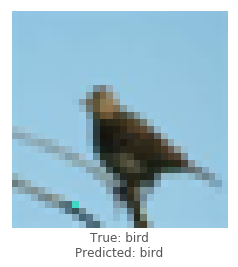

densenet - image 4000 - 681 / 1000


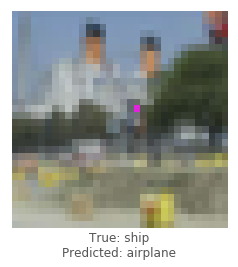

densenet - image 5524 - 682 / 1000


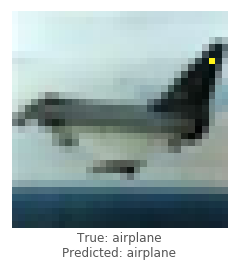

densenet - image 4185 - 683 / 1000


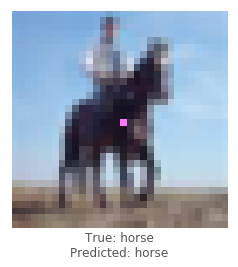

densenet - image 3184 - 684 / 1000


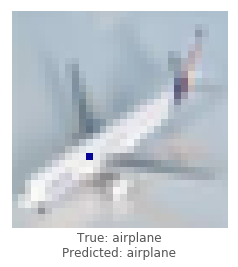

densenet - image 9804 - 685 / 1000


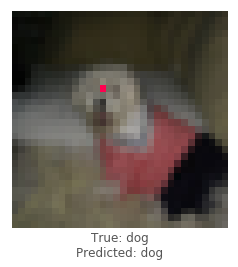

densenet - image 4843 - 686 / 1000


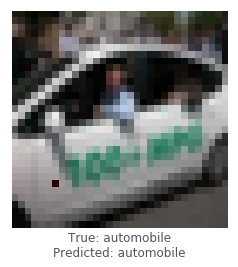

densenet - image 6944 - 687 / 1000


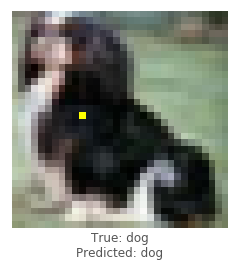

densenet - image 3130 - 688 / 1000


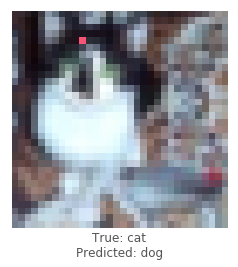

densenet - image 3766 - 689 / 1000


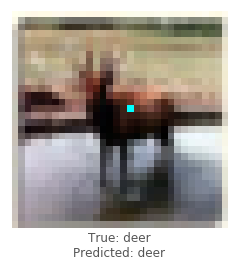

densenet - image 1117 - 690 / 1000


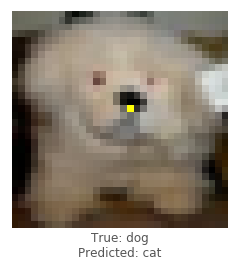

densenet - image 881 - 691 / 1000


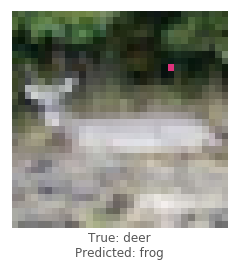

densenet - image 2767 - 692 / 1000


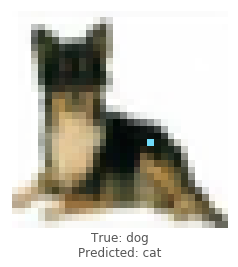

densenet - image 6644 - 693 / 1000


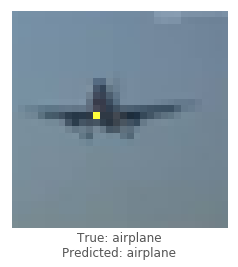

densenet - image 3449 - 694 / 1000


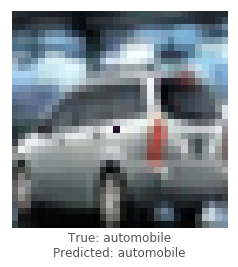

densenet - image 516 - 695 / 1000


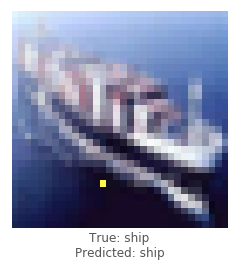

densenet - image 7679 - 696 / 1000


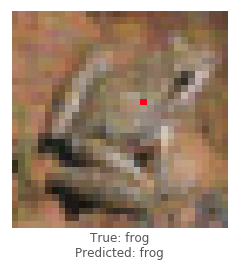

densenet - image 3200 - 697 / 1000


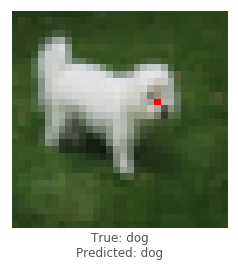

densenet - image 8978 - 698 / 1000


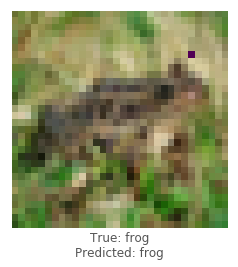

densenet - image 3493 - 699 / 1000


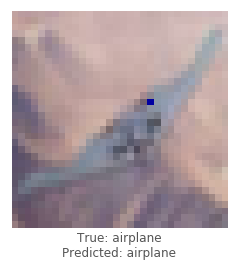

densenet - image 9516 - 700 / 1000


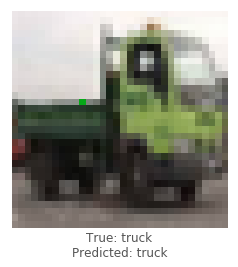

densenet - image 8880 - 701 / 1000


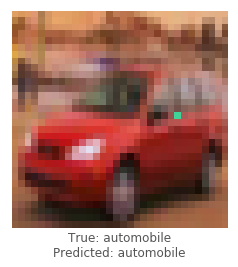

densenet - image 1294 - 702 / 1000


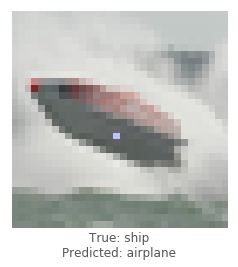

densenet - image 8546 - 703 / 1000


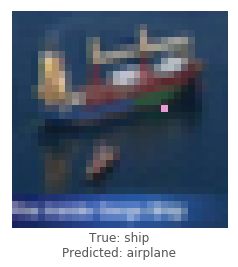

densenet - image 7093 - 704 / 1000


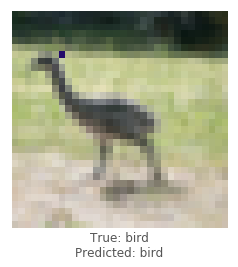

densenet - image 8312 - 705 / 1000


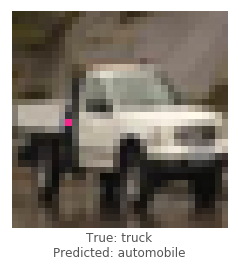

densenet - image 3974 - 706 / 1000


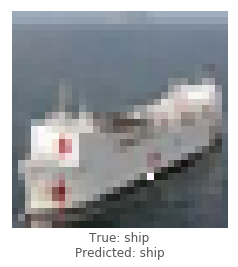

densenet - image 3590 - 707 / 1000


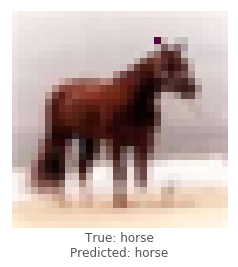

densenet - image 9931 - 708 / 1000


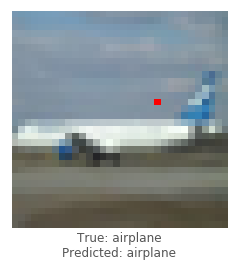

densenet - image 6430 - 709 / 1000


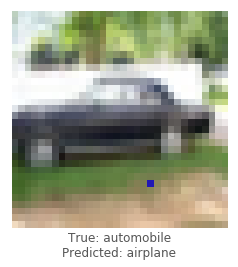

densenet - image 1500 - 710 / 1000


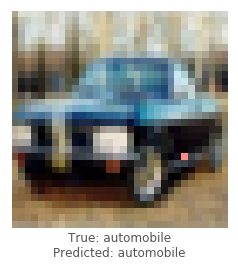

densenet - image 8314 - 711 / 1000


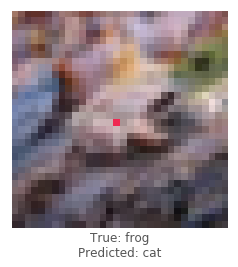

densenet - image 2873 - 712 / 1000


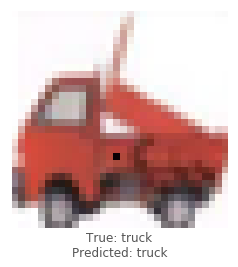

densenet - image 7287 - 713 / 1000


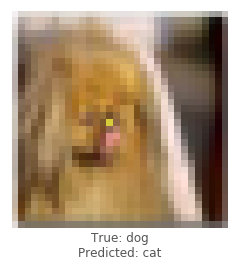

densenet - image 867 - 714 / 1000


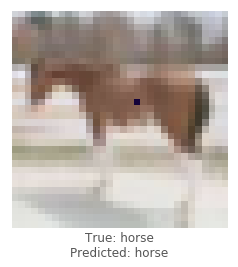

densenet - image 9749 - 715 / 1000


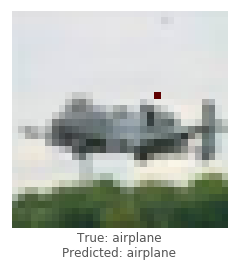

densenet - image 7254 - 716 / 1000


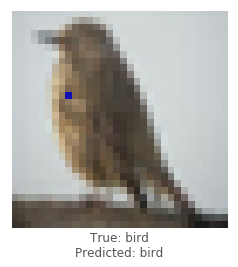

densenet - image 1578 - 717 / 1000


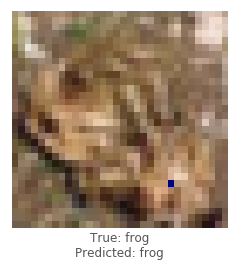

densenet - image 5775 - 718 / 1000


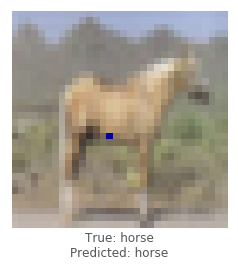

densenet - image 8267 - 719 / 1000


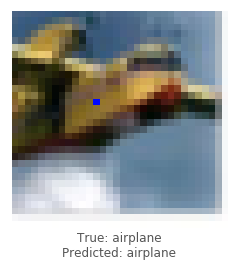

densenet - image 6417 - 720 / 1000


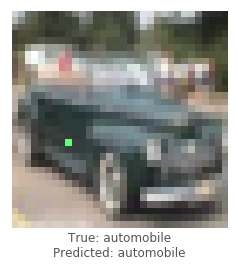

densenet - image 7470 - 721 / 1000


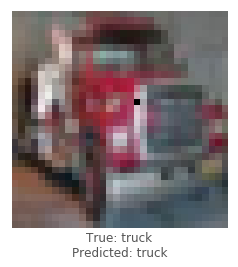

densenet - image 6456 - 722 / 1000


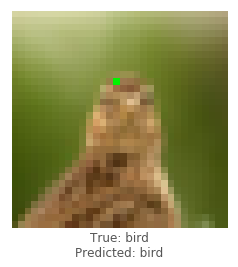

densenet - image 3142 - 723 / 1000


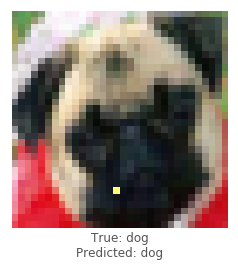

densenet - image 6458 - 724 / 1000


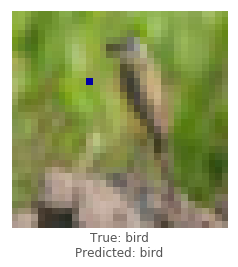

densenet - image 7221 - 725 / 1000


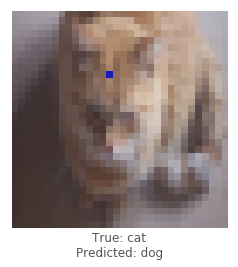

densenet - image 9740 - 726 / 1000


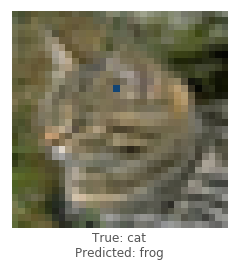

densenet - image 5541 - 727 / 1000


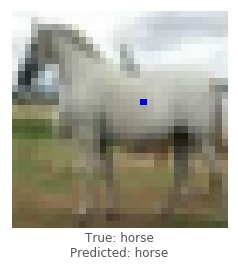

densenet - image 3848 - 728 / 1000


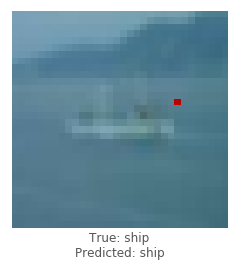

densenet - image 1282 - 729 / 1000


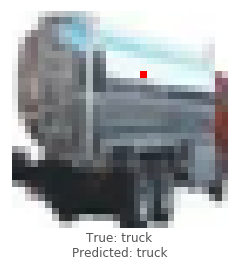

densenet - image 4407 - 730 / 1000


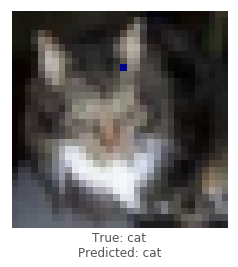

densenet - image 3014 - 731 / 1000


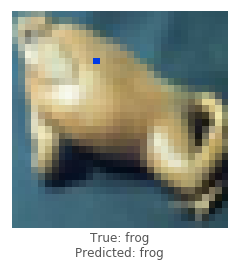

densenet - image 8908 - 732 / 1000


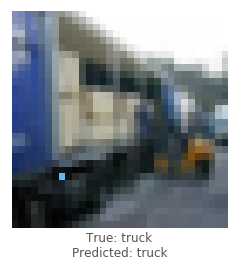

densenet - image 7565 - 733 / 1000


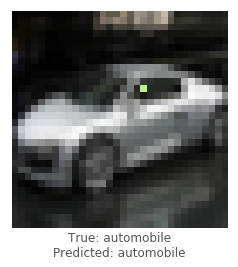

densenet - image 2148 - 734 / 1000


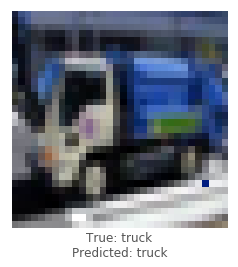

densenet - image 3253 - 735 / 1000


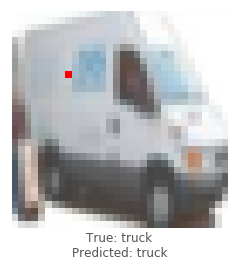

densenet - image 492 - 736 / 1000


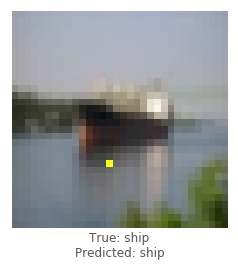

densenet - image 1333 - 737 / 1000


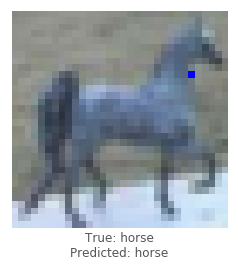

densenet - image 7260 - 738 / 1000


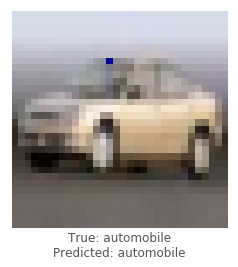

densenet - image 3165 - 739 / 1000


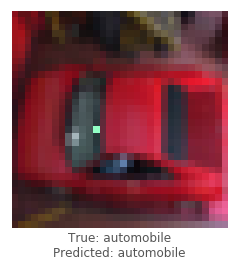

densenet - image 9945 - 740 / 1000


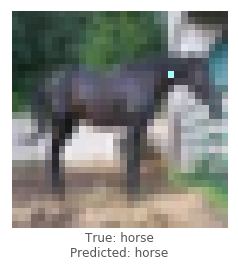

densenet - image 1074 - 741 / 1000


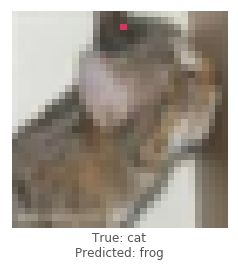

densenet - image 3759 - 742 / 1000


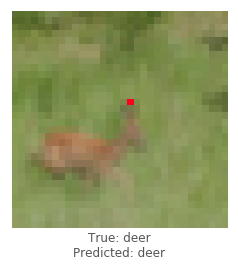

densenet - image 2707 - 743 / 1000


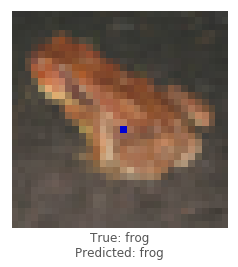

densenet - image 5289 - 744 / 1000


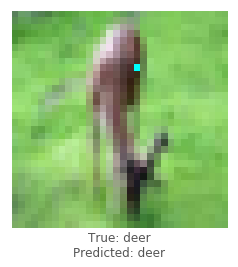

densenet - image 7227 - 745 / 1000


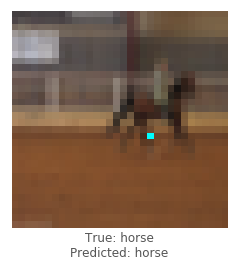

densenet - image 7442 - 746 / 1000


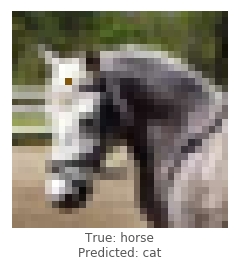

densenet - image 1754 - 747 / 1000


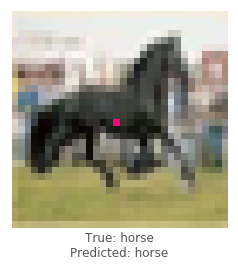

densenet - image 6250 - 748 / 1000


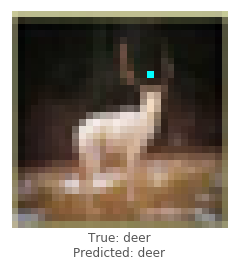

densenet - image 3232 - 749 / 1000


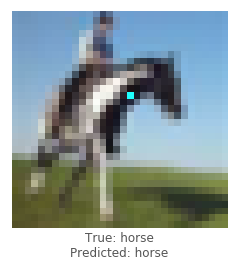

densenet - image 4593 - 750 / 1000


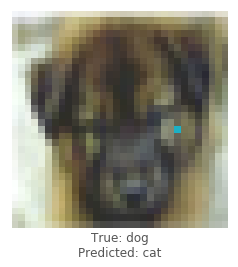

densenet - image 21 - 751 / 1000


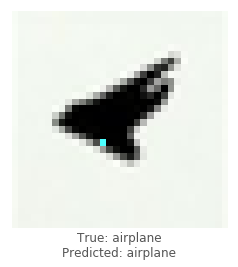

densenet - image 4279 - 752 / 1000


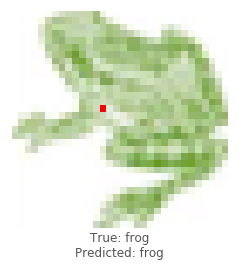

densenet - image 5778 - 753 / 1000


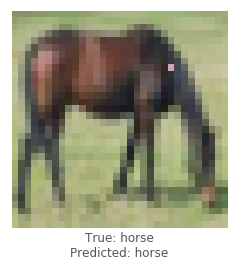

densenet - image 3263 - 754 / 1000


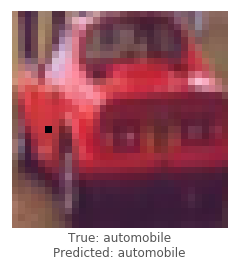

densenet - image 9464 - 755 / 1000


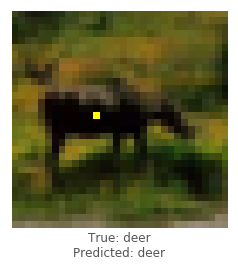

densenet - image 5759 - 756 / 1000


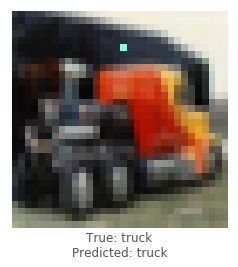

densenet - image 3951 - 757 / 1000


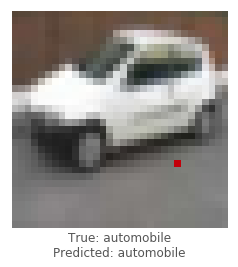

densenet - image 7270 - 758 / 1000


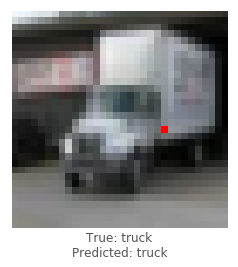

densenet - image 155 - 759 / 1000


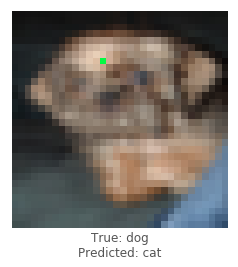

densenet - image 450 - 760 / 1000


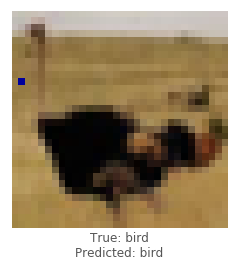

densenet - image 4565 - 761 / 1000


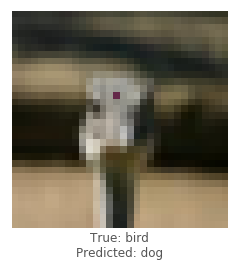

densenet - image 6132 - 762 / 1000


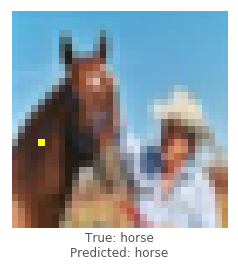

densenet - image 8032 - 763 / 1000


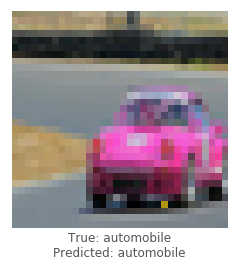

densenet - image 2690 - 764 / 1000


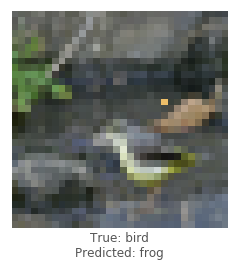

densenet - image 4381 - 765 / 1000


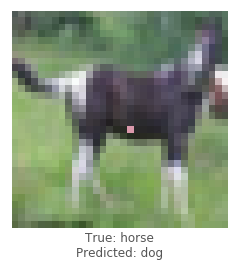

densenet - image 76 - 766 / 1000


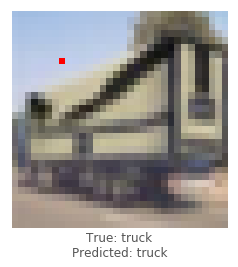

densenet - image 7636 - 767 / 1000


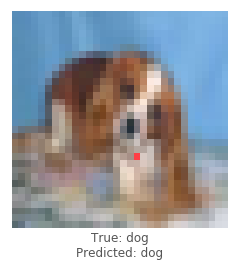

densenet - image 7955 - 768 / 1000


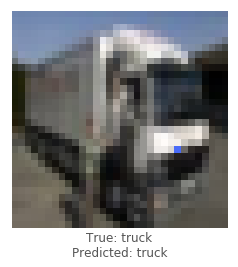

densenet - image 2346 - 769 / 1000


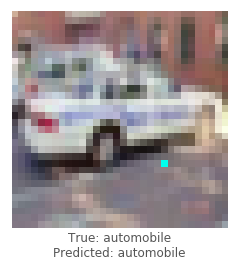

densenet - image 4697 - 770 / 1000


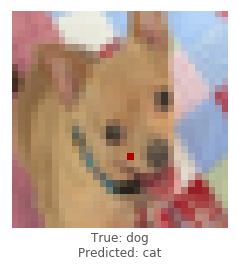

densenet - image 1918 - 771 / 1000


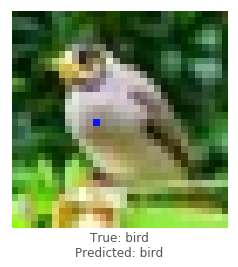

densenet - image 5968 - 772 / 1000


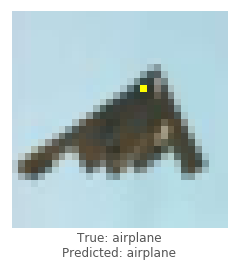

densenet - image 8242 - 773 / 1000


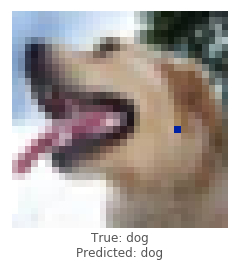

densenet - image 4424 - 774 / 1000


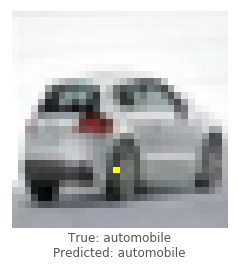

densenet - image 8733 - 775 / 1000


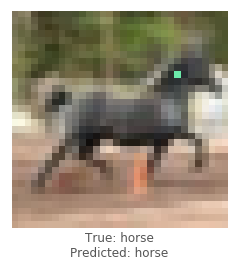

densenet - image 9139 - 776 / 1000


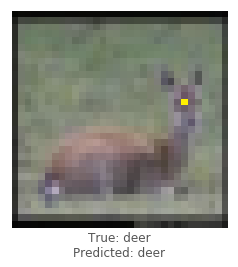

densenet - image 2909 - 777 / 1000


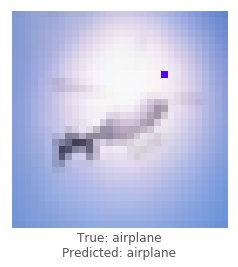

densenet - image 6935 - 778 / 1000


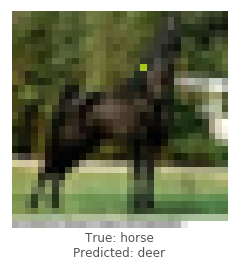

densenet - image 4268 - 779 / 1000


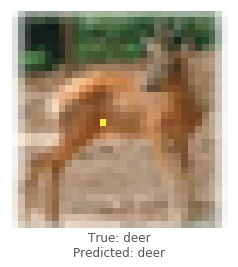

densenet - image 6112 - 780 / 1000


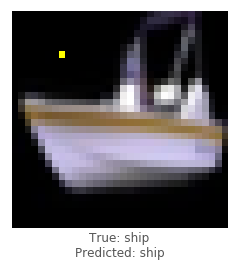

densenet - image 1977 - 781 / 1000


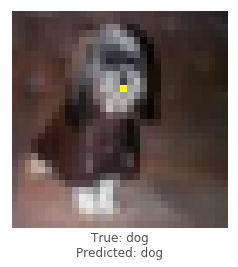

densenet - image 9000 - 782 / 1000


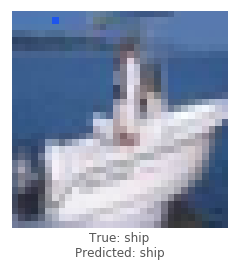

densenet - image 5200 - 783 / 1000


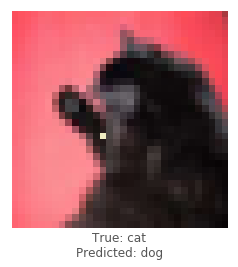

densenet - image 6433 - 784 / 1000


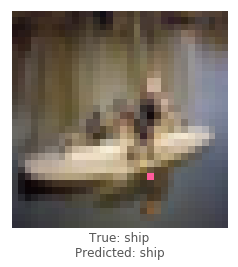

densenet - image 7140 - 785 / 1000


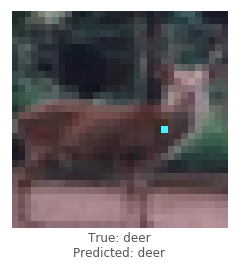

densenet - image 608 - 786 / 1000


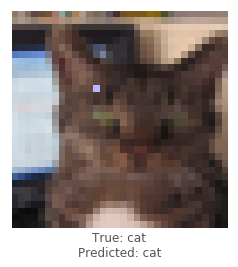

densenet - image 1042 - 787 / 1000


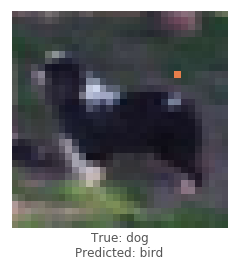

densenet - image 3503 - 788 / 1000


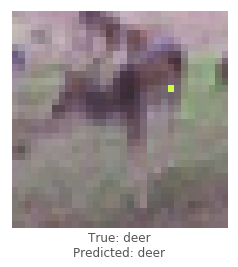

densenet - image 8917 - 789 / 1000


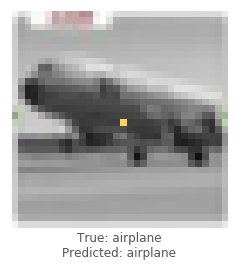

densenet - image 1234 - 790 / 1000


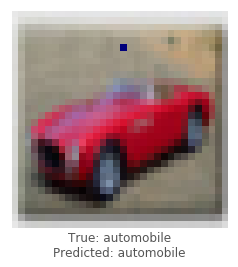

densenet - image 4644 - 791 / 1000


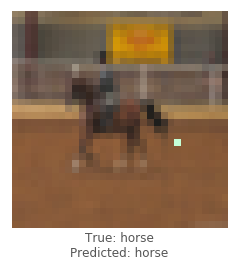

densenet - image 6950 - 792 / 1000


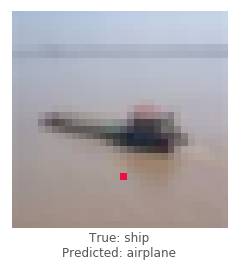

densenet - image 1552 - 793 / 1000


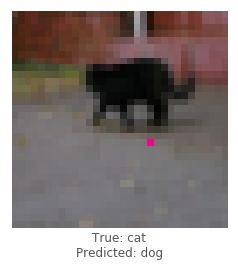

densenet - image 7532 - 794 / 1000


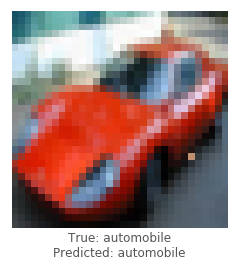

densenet - image 6927 - 795 / 1000


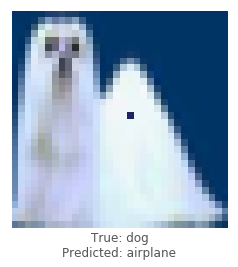

densenet - image 4459 - 796 / 1000


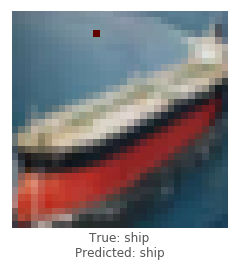

densenet - image 9033 - 797 / 1000


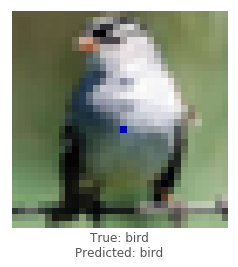

densenet - image 4596 - 798 / 1000


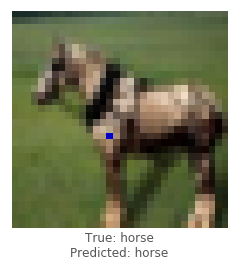

densenet - image 5399 - 799 / 1000


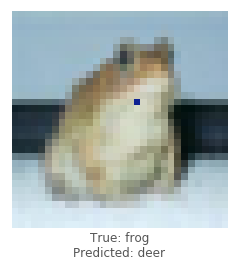

densenet - image 1336 - 800 / 1000


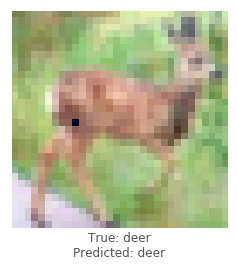

densenet - image 4355 - 801 / 1000


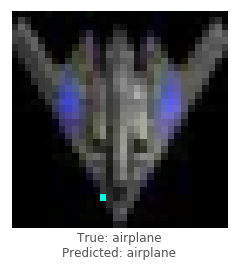

densenet - image 3911 - 802 / 1000


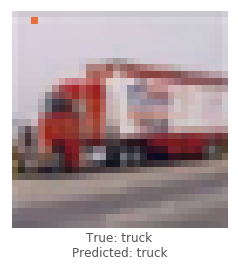

densenet - image 3207 - 803 / 1000


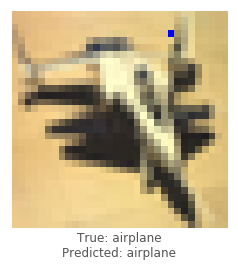

densenet - image 7526 - 804 / 1000


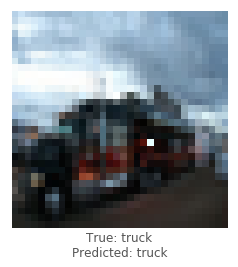

densenet - image 9026 - 805 / 1000


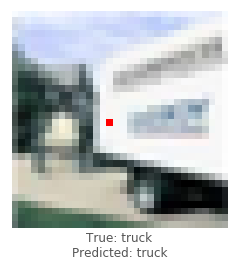

densenet - image 9973 - 806 / 1000


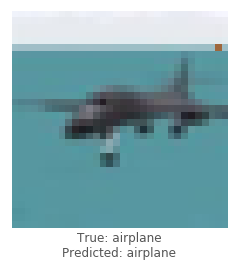

densenet - image 3009 - 807 / 1000


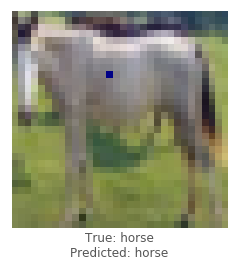

densenet - image 111 - 808 / 1000


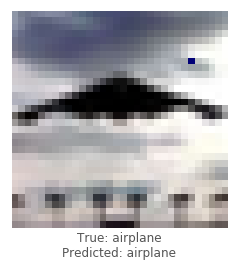

densenet - image 1583 - 809 / 1000


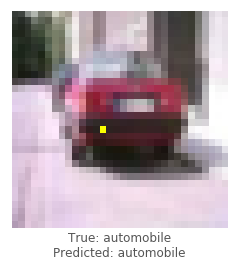

densenet - image 8640 - 810 / 1000


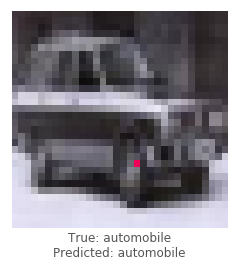

densenet - image 1941 - 811 / 1000


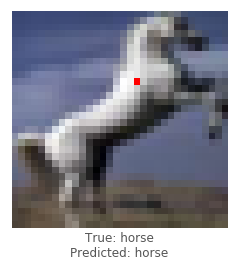

densenet - image 7873 - 812 / 1000


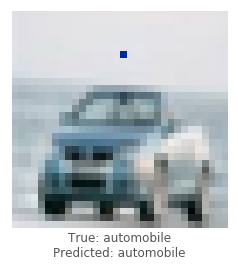

densenet - image 9329 - 813 / 1000


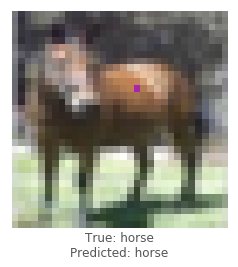

densenet - image 4225 - 814 / 1000


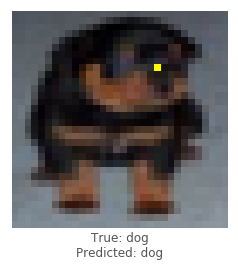

densenet - image 2378 - 815 / 1000


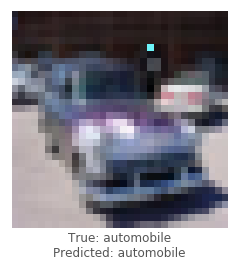

densenet - image 4347 - 816 / 1000


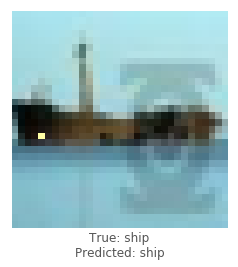

densenet - image 3167 - 817 / 1000


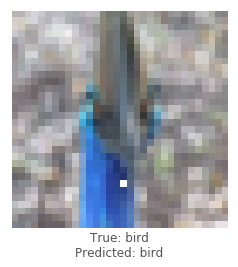

densenet - image 1626 - 818 / 1000


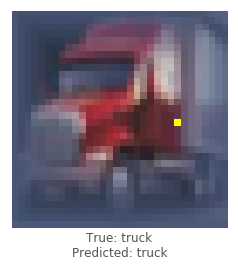

densenet - image 8319 - 819 / 1000


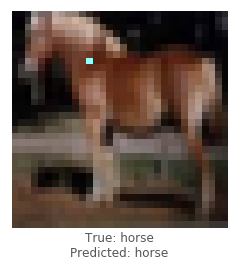

densenet - image 925 - 820 / 1000


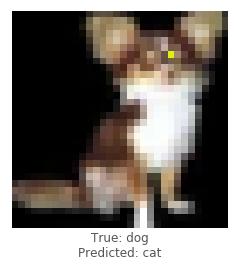

densenet - image 6981 - 821 / 1000


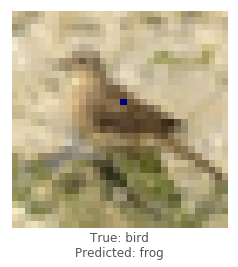

densenet - image 497 - 822 / 1000


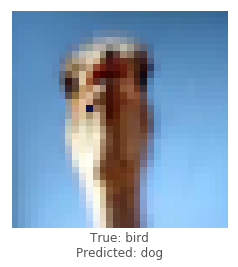

densenet - image 2257 - 823 / 1000


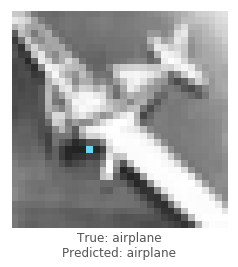

densenet - image 9238 - 824 / 1000


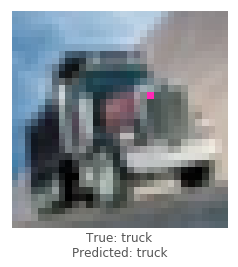

densenet - image 3305 - 825 / 1000


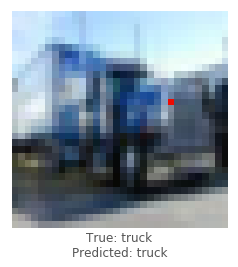

densenet - image 3442 - 826 / 1000


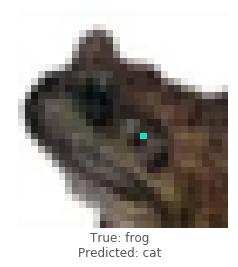

densenet - image 7355 - 827 / 1000


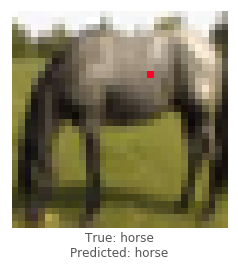

densenet - image 2716 - 828 / 1000


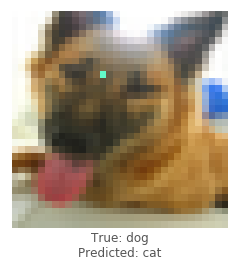

densenet - image 4292 - 829 / 1000


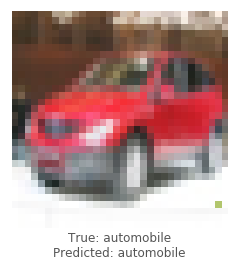

densenet - image 3550 - 830 / 1000


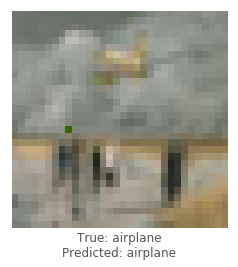

densenet - image 7781 - 831 / 1000


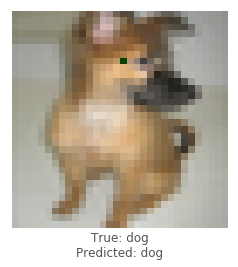

densenet - image 6292 - 832 / 1000


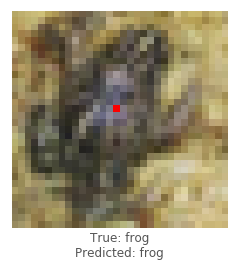

densenet - image 4069 - 833 / 1000


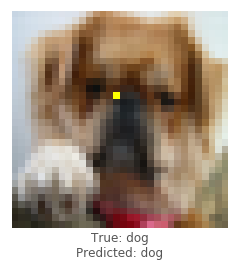

densenet - image 5666 - 834 / 1000


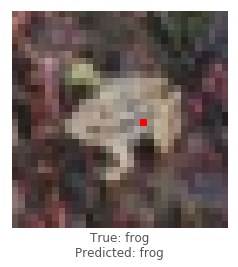

densenet - image 3891 - 835 / 1000


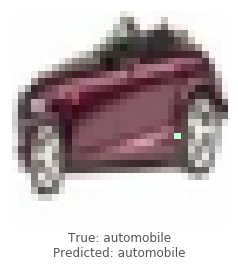

densenet - image 1433 - 836 / 1000


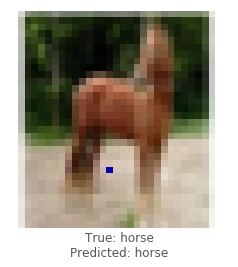

densenet - image 6135 - 837 / 1000


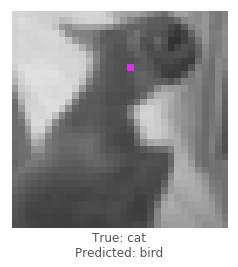

densenet - image 6022 - 838 / 1000


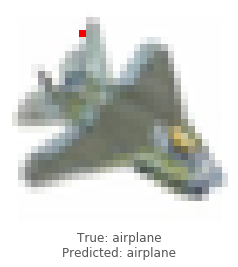

densenet - image 1225 - 839 / 1000


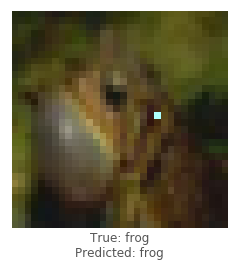

densenet - image 4081 - 840 / 1000


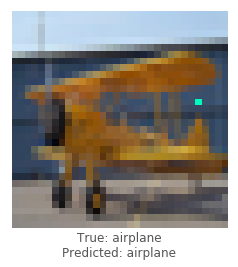

densenet - image 7186 - 841 / 1000


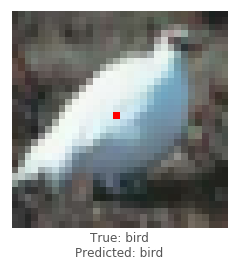

densenet - image 1488 - 842 / 1000


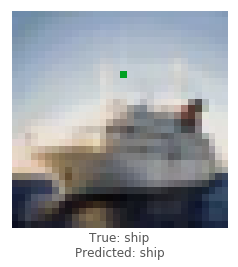

densenet - image 1180 - 843 / 1000


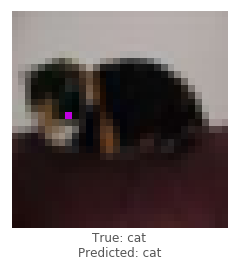

densenet - image 8482 - 844 / 1000


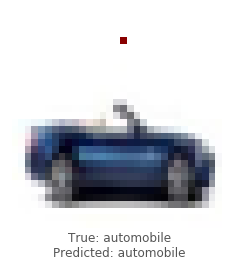

densenet - image 5278 - 845 / 1000


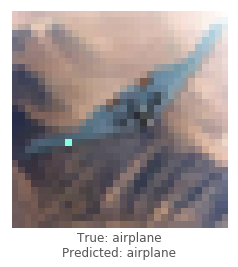

densenet - image 9828 - 846 / 1000


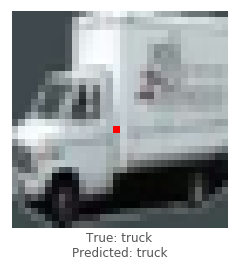

densenet - image 3835 - 847 / 1000


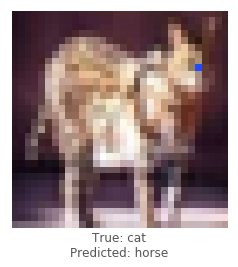

densenet - image 5722 - 848 / 1000


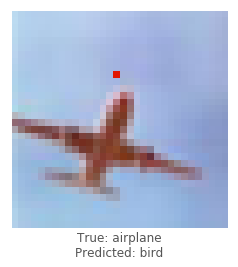

densenet - image 6727 - 849 / 1000


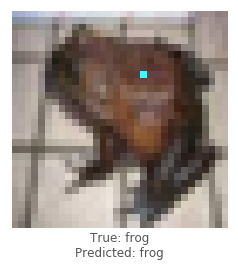

densenet - image 9536 - 850 / 1000


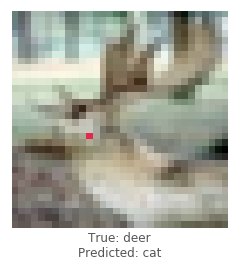

densenet - image 5620 - 851 / 1000


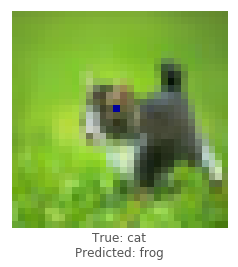

densenet - image 5787 - 852 / 1000


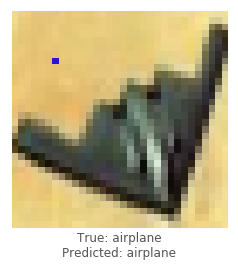

densenet - image 5848 - 853 / 1000


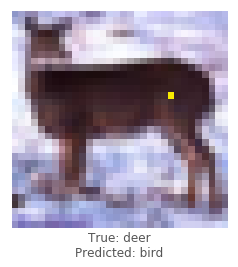

densenet - image 4332 - 854 / 1000


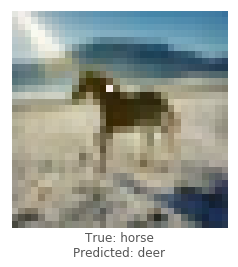

densenet - image 8914 - 855 / 1000


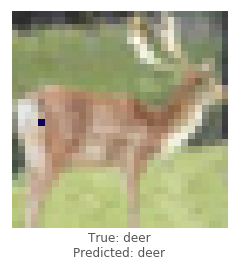

densenet - image 9415 - 856 / 1000


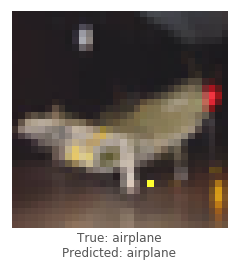

densenet - image 9180 - 857 / 1000


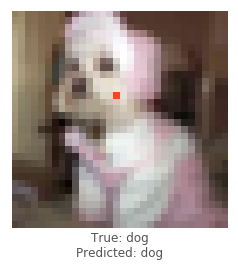

densenet - image 2576 - 858 / 1000


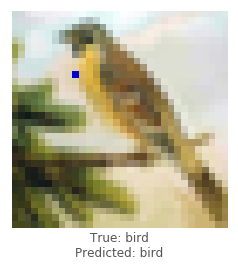

densenet - image 1038 - 859 / 1000


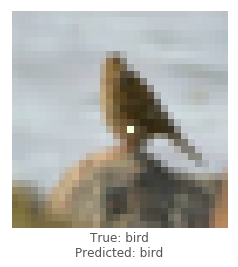

densenet - image 7717 - 860 / 1000


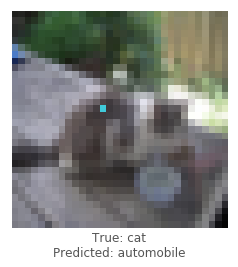

densenet - image 6268 - 861 / 1000


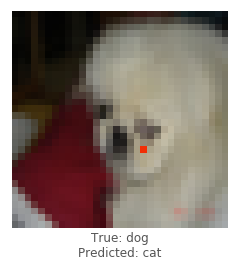

densenet - image 5696 - 862 / 1000


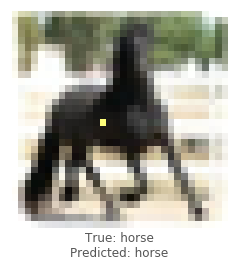

densenet - image 9210 - 863 / 1000


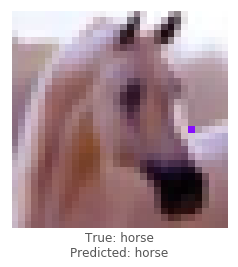

densenet - image 3216 - 864 / 1000


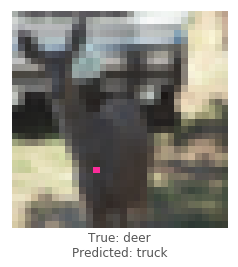

densenet - image 9620 - 865 / 1000


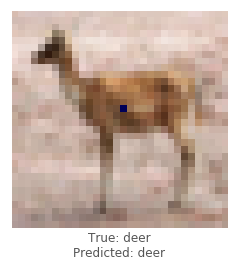

densenet - image 9774 - 866 / 1000


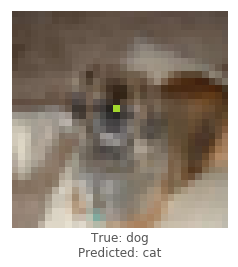

densenet - image 762 - 867 / 1000


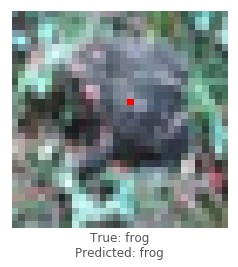

densenet - image 4090 - 868 / 1000


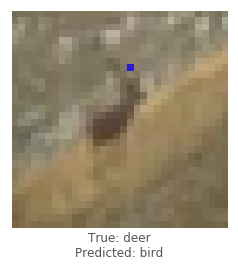

densenet - image 784 - 869 / 1000


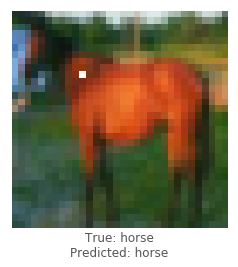

densenet - image 4695 - 870 / 1000


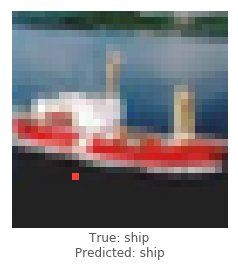

densenet - image 3339 - 871 / 1000


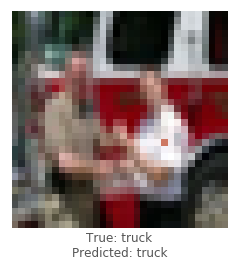

densenet - image 143 - 872 / 1000


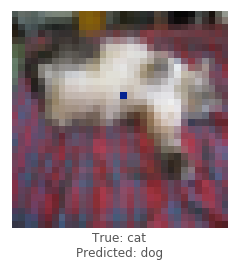

densenet - image 2402 - 873 / 1000


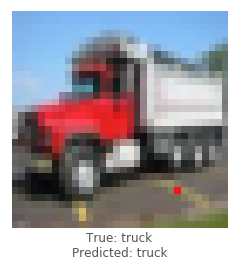

densenet - image 2422 - 874 / 1000


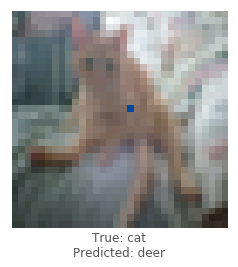

densenet - image 6529 - 875 / 1000


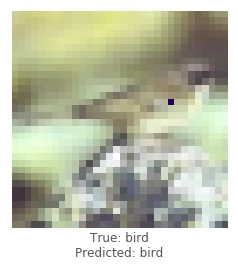

densenet - image 3575 - 876 / 1000


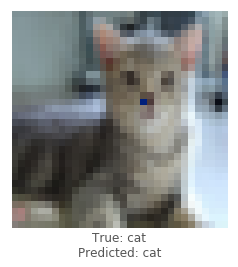

densenet - image 237 - 877 / 1000


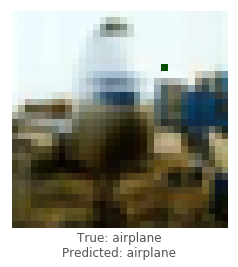

densenet - image 6019 - 878 / 1000


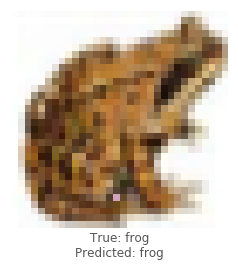

densenet - image 5770 - 879 / 1000


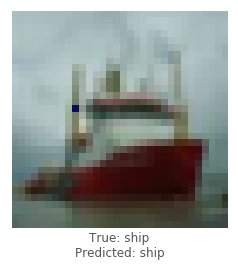

densenet - image 6895 - 880 / 1000


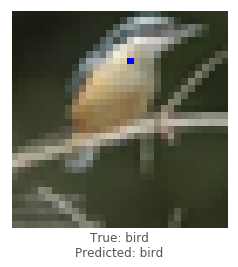

densenet - image 8011 - 881 / 1000


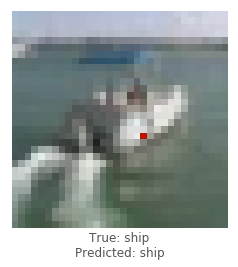

densenet - image 2676 - 882 / 1000


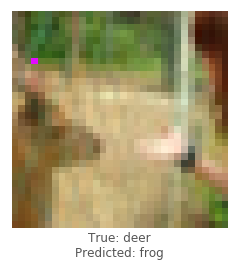

densenet - image 1195 - 883 / 1000


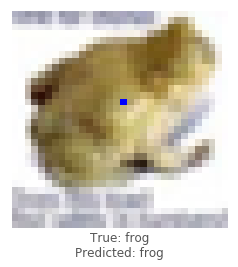

densenet - image 8898 - 884 / 1000


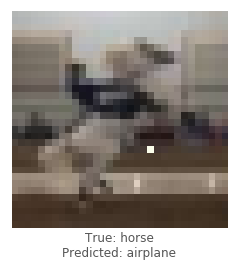

densenet - image 3183 - 885 / 1000


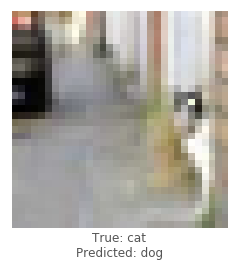

densenet - image 5181 - 886 / 1000


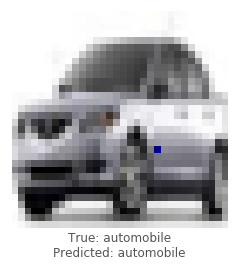

densenet - image 8476 - 887 / 1000


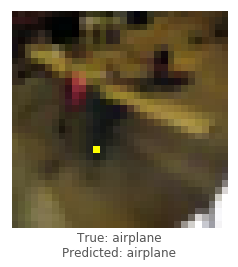

densenet - image 3925 - 888 / 1000


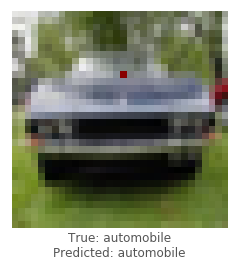

densenet - image 703 - 889 / 1000


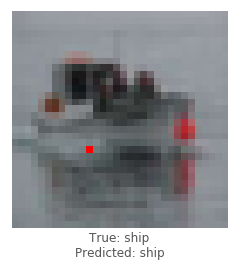

densenet - image 7133 - 890 / 1000


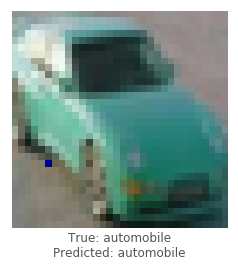

densenet - image 240 - 891 / 1000


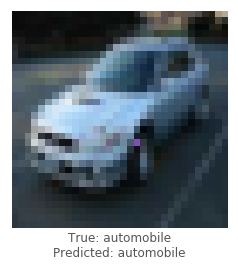

densenet - image 992 - 892 / 1000


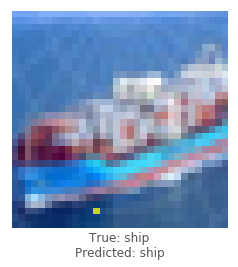

densenet - image 9790 - 893 / 1000


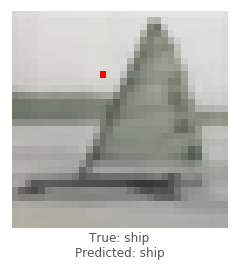

densenet - image 2731 - 894 / 1000


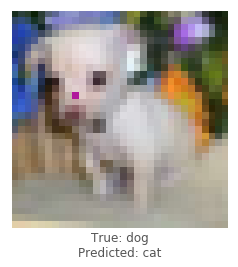

densenet - image 7920 - 895 / 1000


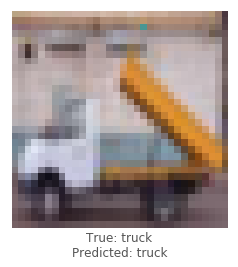

densenet - image 2595 - 896 / 1000


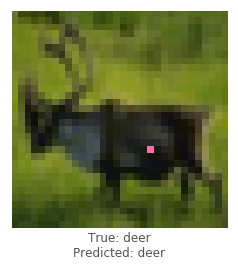

densenet - image 8756 - 897 / 1000


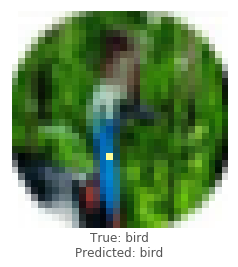

densenet - image 5480 - 898 / 1000


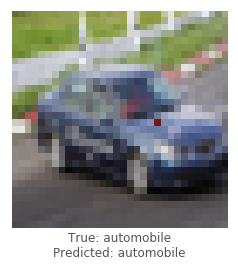

densenet - image 7686 - 899 / 1000


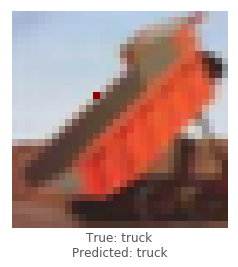

densenet - image 687 - 900 / 1000


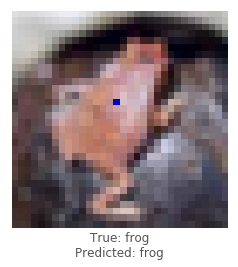

densenet - image 6557 - 901 / 1000


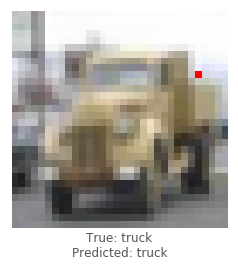

densenet - image 2095 - 902 / 1000


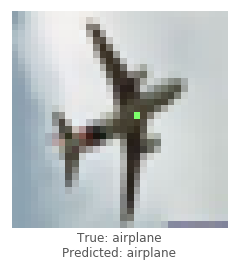

densenet - image 947 - 903 / 1000


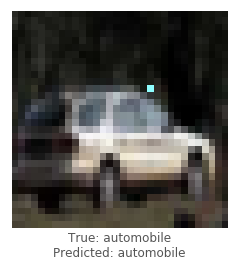

densenet - image 1729 - 904 / 1000


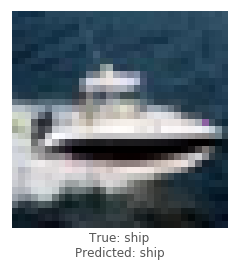

densenet - image 4153 - 905 / 1000


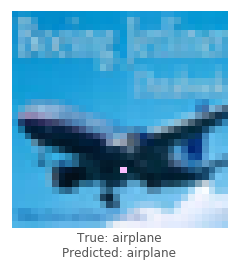

densenet - image 2157 - 906 / 1000


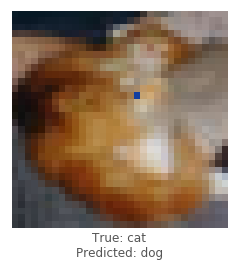

densenet - image 2582 - 907 / 1000


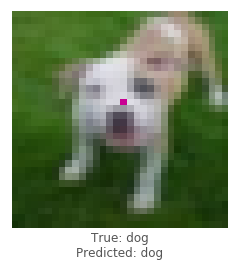

densenet - image 4639 - 908 / 1000


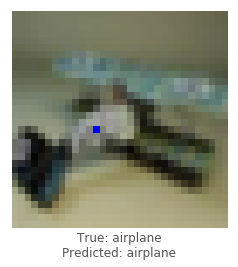

densenet - image 5826 - 909 / 1000


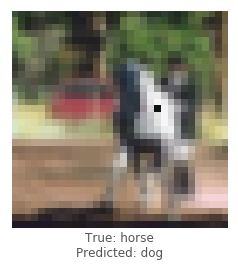

densenet - image 3315 - 910 / 1000


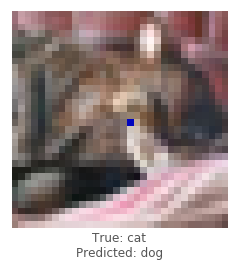

densenet - image 9872 - 911 / 1000


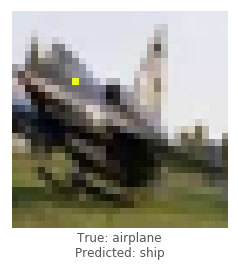

densenet - image 8168 - 912 / 1000


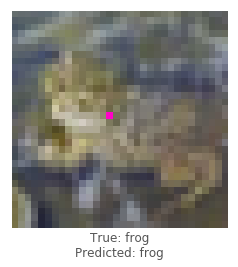

densenet - image 5475 - 913 / 1000


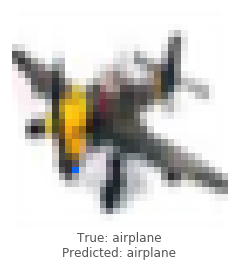

densenet - image 4415 - 914 / 1000


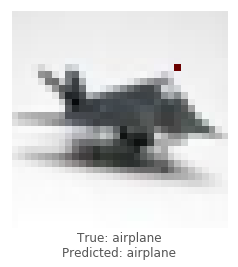

densenet - image 7441 - 915 / 1000


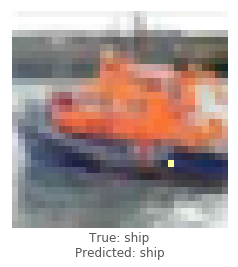

densenet - image 4521 - 916 / 1000


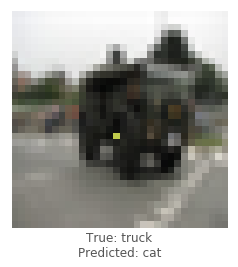

densenet - image 2224 - 917 / 1000


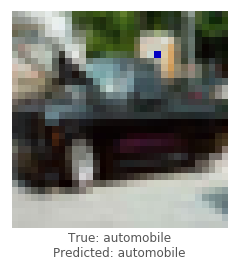

densenet - image 561 - 918 / 1000


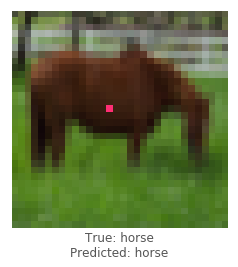

densenet - image 2172 - 919 / 1000


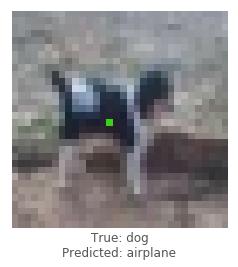

densenet - image 4492 - 920 / 1000


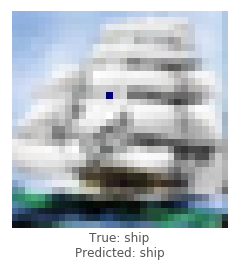

densenet - image 4598 - 921 / 1000


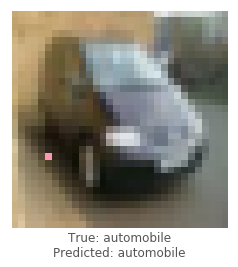

densenet - image 9670 - 922 / 1000


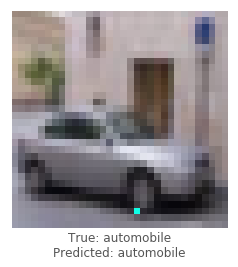

densenet - image 5403 - 923 / 1000


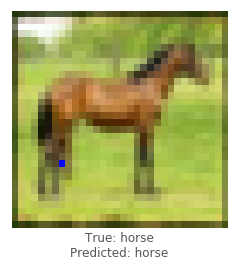

densenet - image 7477 - 924 / 1000


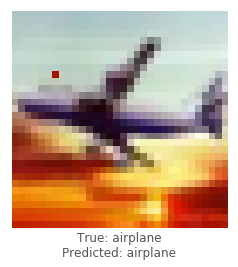

densenet - image 1545 - 925 / 1000


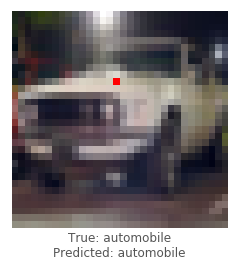

densenet - image 2764 - 926 / 1000


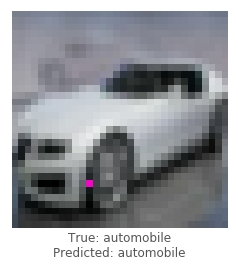

densenet - image 9874 - 927 / 1000


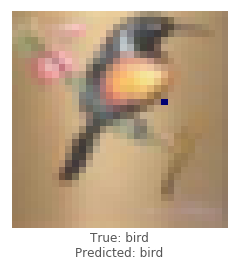

densenet - image 5610 - 928 / 1000


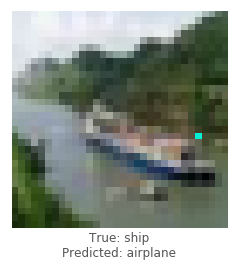

densenet - image 605 - 929 / 1000


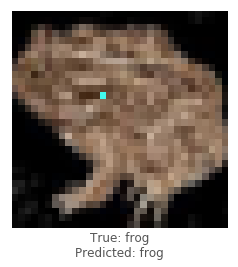

densenet - image 9121 - 930 / 1000


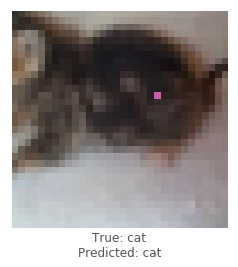

densenet - image 2070 - 931 / 1000


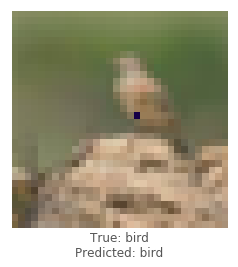

densenet - image 3147 - 932 / 1000


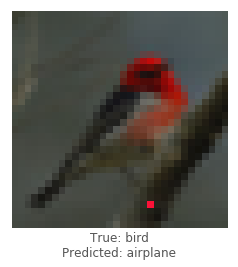

densenet - image 4610 - 933 / 1000


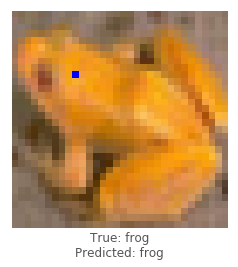

densenet - image 4993 - 934 / 1000


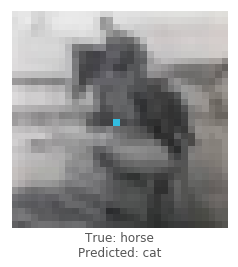

densenet - image 2031 - 935 / 1000


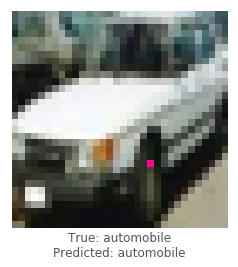

densenet - image 1387 - 936 / 1000


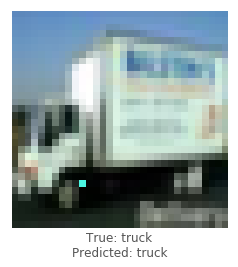

densenet - image 6918 - 937 / 1000


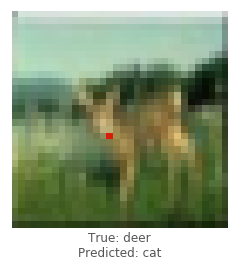

densenet - image 6526 - 938 / 1000


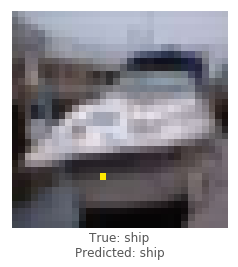

densenet - image 6768 - 939 / 1000


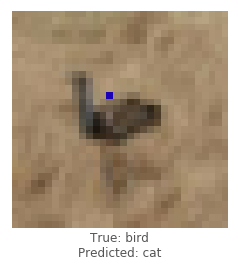

densenet - image 7006 - 940 / 1000


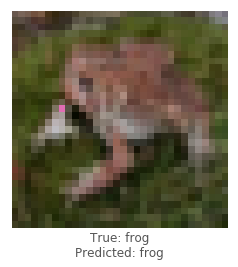

densenet - image 1012 - 941 / 1000


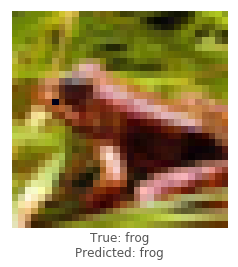

densenet - image 740 - 942 / 1000


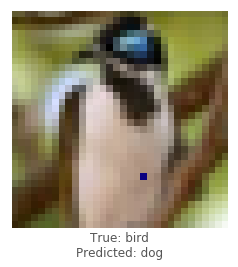

densenet - image 5678 - 943 / 1000


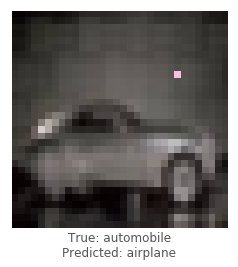

densenet - image 3677 - 944 / 1000


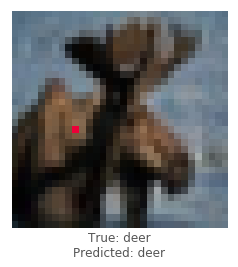

densenet - image 948 - 945 / 1000


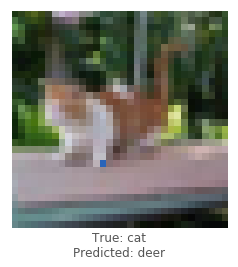

densenet - image 7799 - 946 / 1000


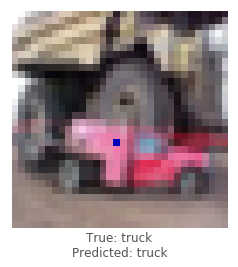

densenet - image 2922 - 947 / 1000


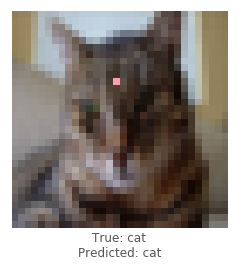

densenet - image 7988 - 948 / 1000


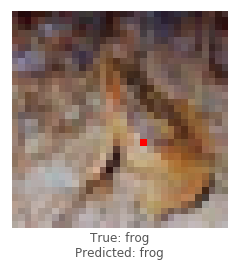

densenet - image 3397 - 949 / 1000


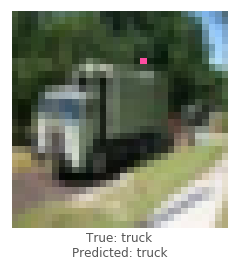

densenet - image 7273 - 950 / 1000


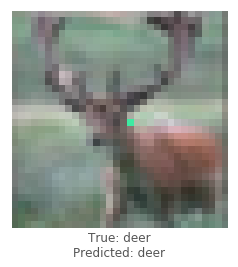

densenet - image 1348 - 951 / 1000


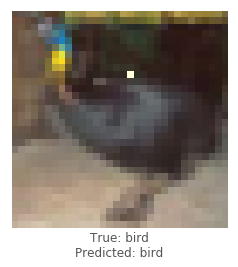

densenet - image 4762 - 952 / 1000


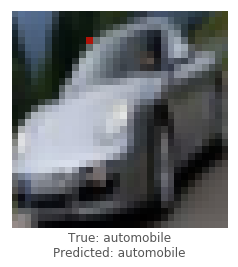

densenet - image 8030 - 953 / 1000


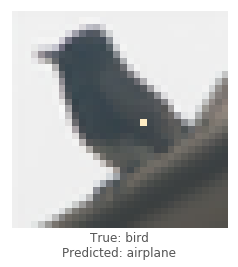

densenet - image 2320 - 954 / 1000


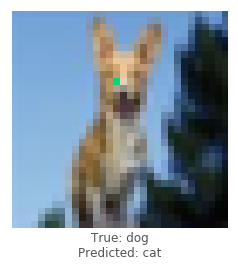

densenet - image 9661 - 955 / 1000


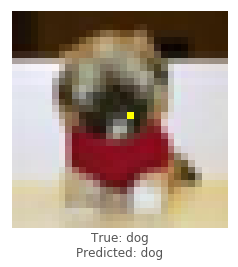

densenet - image 3833 - 956 / 1000


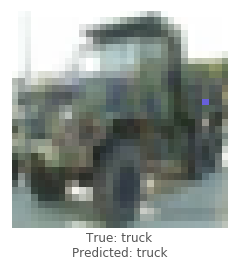

densenet - image 1788 - 957 / 1000


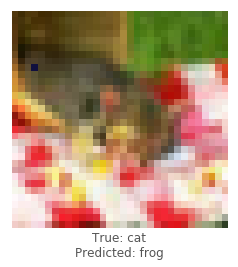

densenet - image 5522 - 958 / 1000


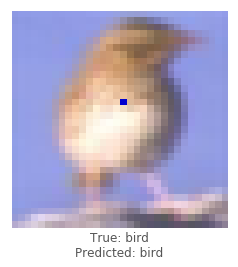

densenet - image 1047 - 959 / 1000


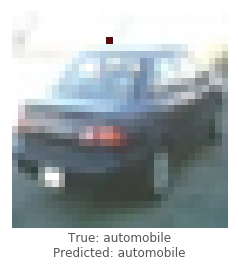

densenet - image 8687 - 960 / 1000


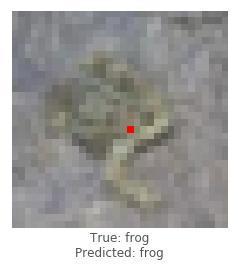

densenet - image 8171 - 961 / 1000


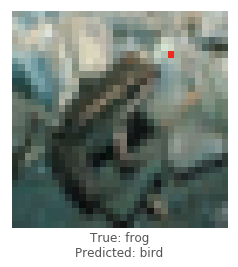

densenet - image 7009 - 962 / 1000


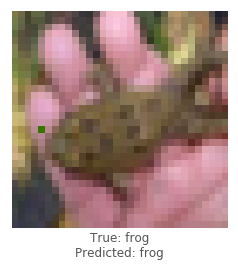

densenet - image 8130 - 963 / 1000


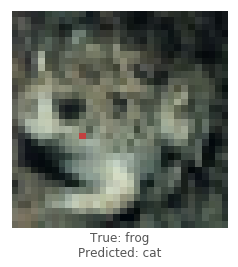

densenet - image 2508 - 964 / 1000


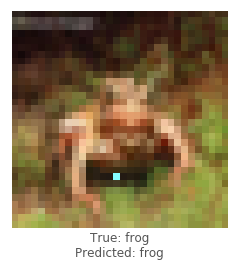

densenet - image 9805 - 965 / 1000


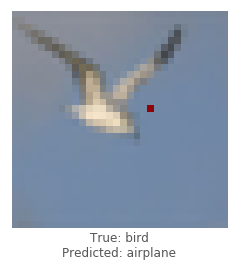

densenet - image 4293 - 966 / 1000


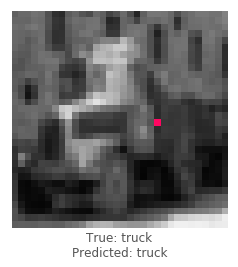

densenet - image 6517 - 967 / 1000


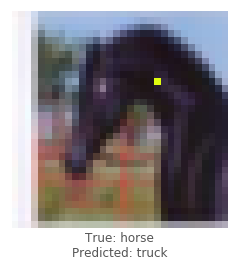

densenet - image 7536 - 968 / 1000


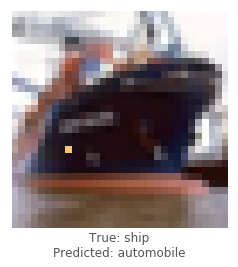

densenet - image 4627 - 969 / 1000


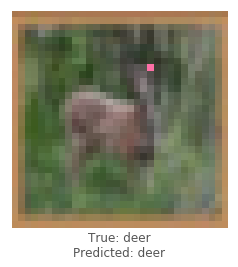

densenet - image 413 - 970 / 1000


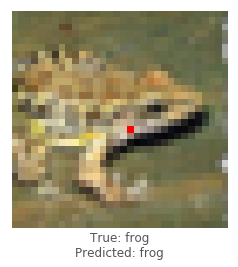

densenet - image 8468 - 971 / 1000


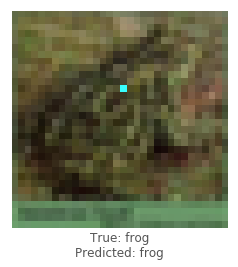

densenet - image 4097 - 972 / 1000


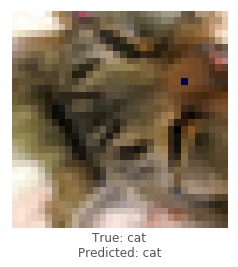

densenet - image 2023 - 973 / 1000


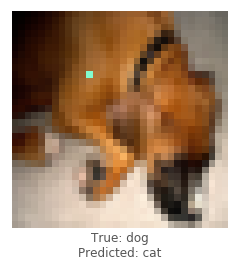

densenet - image 9077 - 974 / 1000


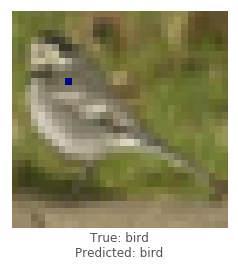

densenet - image 3969 - 975 / 1000


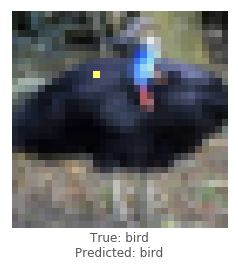

densenet - image 2666 - 976 / 1000


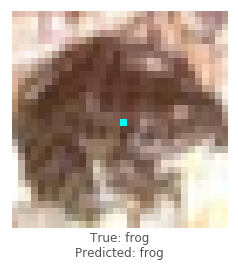

densenet - image 80 - 977 / 1000


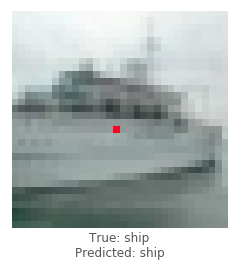

densenet - image 5445 - 978 / 1000


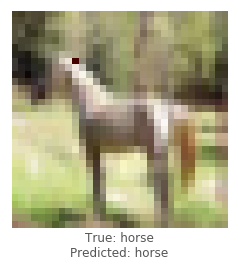

densenet - image 9873 - 979 / 1000


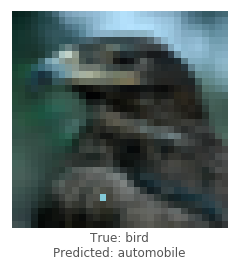

densenet - image 5924 - 980 / 1000


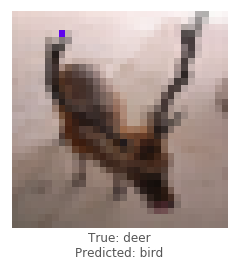

densenet - image 9484 - 981 / 1000


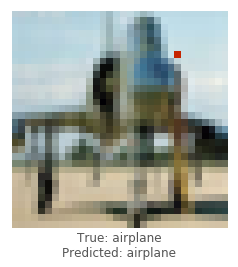

densenet - image 4646 - 982 / 1000


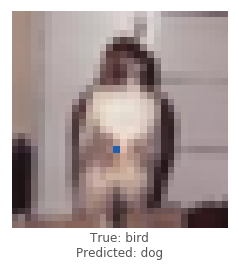

densenet - image 1061 - 983 / 1000


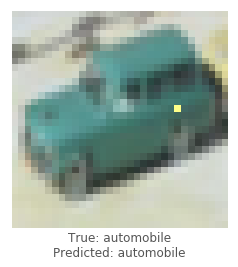

densenet - image 6145 - 984 / 1000


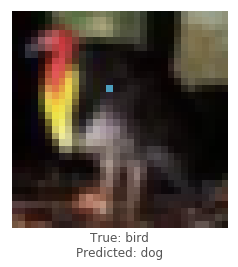

densenet - image 3760 - 985 / 1000


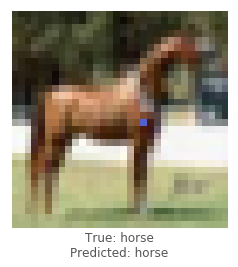

densenet - image 2963 - 986 / 1000


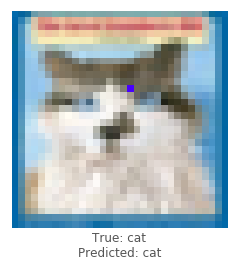

densenet - image 1810 - 987 / 1000


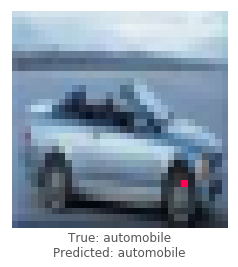

densenet - image 7432 - 988 / 1000


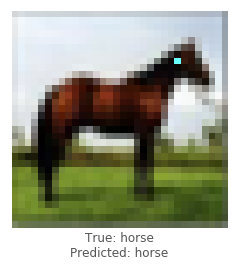

densenet - image 830 - 989 / 1000


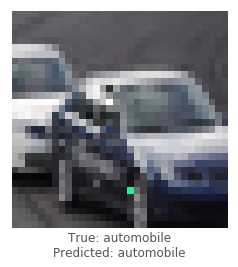

densenet - image 5641 - 990 / 1000


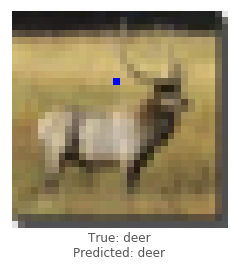

densenet - image 50 - 991 / 1000


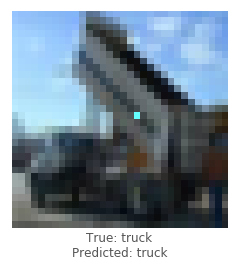

densenet - image 2219 - 992 / 1000


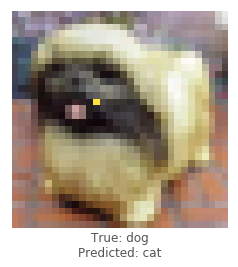

densenet - image 1254 - 993 / 1000


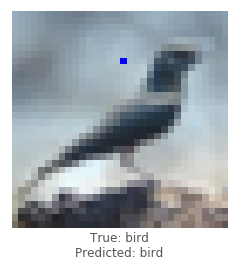

densenet - image 6681 - 994 / 1000


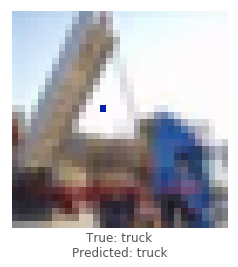

densenet - image 6716 - 995 / 1000


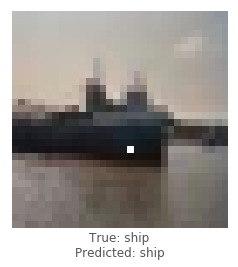

densenet - image 1290 - 996 / 1000


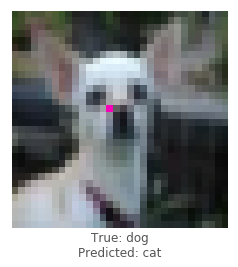

densenet - image 8326 - 997 / 1000


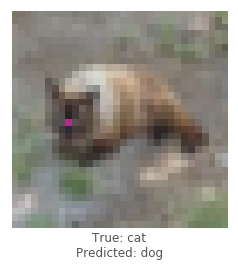

densenet - image 4726 - 998 / 1000


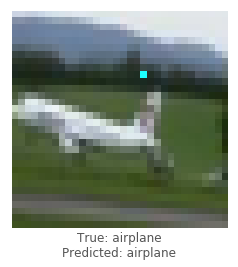

densenet - image 5676 - 999 / 1000


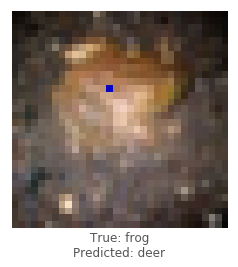

densenet - image 5721 - 1000 / 1000


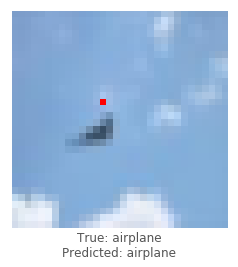

In [25]:
models = [densenet]
untargeted = attack_all(models, samples=1000, pixels=[1], targeted=False)

In [26]:
# targeted = attack_all(models, samples=10, targeted=True)

### Attack Statistics

Print the final results! 

In [27]:
# Load the result
# untargeted, targeted = helper.load_results()

In [28]:
# columns = ['model', 'pixels', 'image', 'true', 'predicted', 'success', 'cdiff', 'prior_probs', 'predicted_probs', 'perturbation']
# untargeted_results = pd.DataFrame(untargeted, columns=columns)
# targeted_results = pd.DataFrame(targeted, columns=columns)

#### Untargeted

In [29]:
#helper.attack_stats(untargeted_results, models, network_stats)

#### Targeted

In [30]:
# helper.attack_stats(targeted_results, models, network_stats)

### Show some successful attacks

Plot 9 random successful attack images

In [31]:
#print('Untargeted Attack')
#helper.visualize_attack(untargeted_results, class_names)

In [32]:
# print('Targeted Attack')
# helper.visualize_attack(targeted_results, class_names)

In [45]:
#n_elements = ["336"]
#resnet = ResNet()
models = [resnet]
#quality = 75
#folders = ['Recons336stride1patch9', 'cifar224loihi']
#radii = ["0.25", "0.75"]
for model in models:
    #for radius in radii:
    #for folder in folders:
    #for n_element in n_elements:
       # directory = "reconstructions/" + model.name + "_reconstructions/one_pixel/" + n_element + "/"
        #directory = "blur_attack/" + model.name + "/"+ radius + "/"
        #directory = 'reconstructions/Recons2/'
        #directory = 'loihi/'+ folder + '/' 
    directory = 'jpg_compression_attack/resnet/one_pixel/'
    for img_file in os.listdir(directory):
        img_num = re.findall("([\d]+)",img_file)[0]
        img = Image.open(directory + img_file, 'r')
        img = np.asarray(img)
        probs = model.predict_one(img);
        predicted_class = np.argmax(probs)
        file_name = model.name + '_jpg_compression_prediction_75.csv'
        #file_name = model.name + '_reconstruction_prediction_'+ n_element +'.csv'
        #file_name = model.name + '_reconstruction_prediction_'+ folder +'.csv'
        #file_name = model.name + '_blur_prediction_' + radius + '.csv'
        #file_name = 'openCV_resenet_reconstruction_predictions.csv'
        data = [img_num, model.name, class_names[predicted_class], probs]
        if os.path.exists(file_name):
            file = open(file_name, 'a')
            with file:
                writer = csv.writer(file)
                writer.writerow(data)
        else:
            headers = ["img", "model", "predicted", "reconstruction_prob"]
            rows = [headers, data]
            file = open(file_name, 'w')
            with file:
                writer = csv.writer(file)
                writer.writerows(rows)


IndexError: too many indices for array

## Conclusions

It appears that the accuracy of a model is not strongly correlated with the chance of performing a successful attack on an image. Perhaps surprisingly, the purely convolutional model is the most resistant CNN to these types of attacks. In addition, the capsule network CapsNet has the lowest attack success rate out of all the models, although it is still vulnerable to attack.

[Part 2](1_one-pixel-attack-cifar10.ipynb)

## Credits
 -  This implemenation is based off of the original paper describing the one pixel attack: https://arxiv.org/abs/1710.08864
 - Base code for iPython notebook: https://github.com/09rohanchopra/cifar10
 - Keras Cifar10 models: https://github.com/BIGBALLON/cifar-10-cnn
 - Scipy's differential evolution implementation: https://docs.scipy.org/doc/scipy-0.17.0/reference/generated/scipy.optimize.differential_evolution.html
 - State of the art: https://github.com/RedditSota/state-of-the-art-result-for-machine-learning-problems
 - CapsNet Keras: https://github.com/XifengGuo/CapsNet-Keras
 - CapsNet with Cifar: https://github.com/theblackcat102/dynamic-routing-capsule-cifar